#### Problem Statement
The aim of this case study is to identify patterns which indicate if a client has difficulty paying their installments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected.

When the company receives a loan application, the company has to decide for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:

-If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

-If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company.

#### Import the Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',125)
pd.set_option('display.max_rows',200)

#### Import and read the Application_Data DataSet

In [3]:
appln_data = pd.read_csv("application_data.csv")
appln_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

#### Check the shape of Application_Data

In [4]:
appln_data.shape

(307511, 122)

#### Check the datatypes of each column in Application_Data

In [8]:
#If we pass verbose it will provide the information of all columns(type of the dataframe, No. of rows, No. of columns and the type of each column)
appln_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

#### Check the missing values in Application_Data DataSet

In [9]:
appln_data.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

#### Check the percentage of missing values in Application_Data DataSet

In [10]:
round(100*((appln_data.isnull().sum())/appln_data.shape[0]).sort_values(ascending=False),2)

COMMONAREA_MEDI                 69.87
COMMONAREA_AVG                  69.87
COMMONAREA_MODE                 69.87
NONLIVINGAPARTMENTS_MODE        69.43
NONLIVINGAPARTMENTS_AVG         69.43
NONLIVINGAPARTMENTS_MEDI        69.43
FONDKAPREMONT_MODE              68.39
LIVINGAPARTMENTS_MODE           68.35
LIVINGAPARTMENTS_AVG            68.35
LIVINGAPARTMENTS_MEDI           68.35
FLOORSMIN_AVG                   67.85
FLOORSMIN_MODE                  67.85
FLOORSMIN_MEDI                  67.85
YEARS_BUILD_MEDI                66.50
YEARS_BUILD_MODE                66.50
YEARS_BUILD_AVG                 66.50
OWN_CAR_AGE                     65.99
LANDAREA_MEDI                   59.38
LANDAREA_MODE                   59.38
LANDAREA_AVG                    59.38
BASEMENTAREA_MEDI               58.52
BASEMENTAREA_AVG                58.52
BASEMENTAREA_MODE               58.52
EXT_SOURCE_1                    56.38
NONLIVINGAREA_MODE              55.18
NONLIVINGAREA_AVG               55.18
NONLIVINGARE

#### Delete the columns which are having >50% Missing values

In [11]:
appln_data = appln_data.loc[:,100*((appln_data.isnull().sum())/len(appln_data))<50]
appln_data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,0.032561,-9327,-236,-8456.0,-1982,1,

#### Check the shape of the Application_Data after deleting the columns which contains missing values >50%

In [12]:
appln_data.shape

(307511, 81)

#### Check the missing values percentage once again in Application_Data

In [17]:
round(100*((appln_data.isnull().sum())/appln_data.shape[0]).sort_values(ascending=False),2)

FLOORSMAX_AVG                   49.76
FLOORSMAX_MODE                  49.76
FLOORSMAX_MEDI                  49.76
YEARS_BEGINEXPLUATATION_AVG     48.78
YEARS_BEGINEXPLUATATION_MODE    48.78
YEARS_BEGINEXPLUATATION_MEDI    48.78
TOTALAREA_MODE                  48.27
EMERGENCYSTATE_MODE             47.40
OCCUPATION_TYPE                 31.35
EXT_SOURCE_3                    19.83
AMT_REQ_CREDIT_BUREAU_YEAR      13.50
AMT_REQ_CREDIT_BUREAU_HOUR      13.50
AMT_REQ_CREDIT_BUREAU_DAY       13.50
AMT_REQ_CREDIT_BUREAU_WEEK      13.50
AMT_REQ_CREDIT_BUREAU_MON       13.50
AMT_REQ_CREDIT_BUREAU_QRT       13.50
NAME_TYPE_SUITE                  0.42
DEF_30_CNT_SOCIAL_CIRCLE         0.33
OBS_60_CNT_SOCIAL_CIRCLE         0.33
DEF_60_CNT_SOCIAL_CIRCLE         0.33
OBS_30_CNT_SOCIAL_CIRCLE         0.33
EXT_SOURCE_2                     0.21
AMT_GOODS_PRICE                  0.09
AMT_ANNUITY                      0.00
CNT_FAM_MEMBERS                  0.00
DAYS_LAST_PHONE_CHANGE           0.00
FLAG_OWN_CAR

#### Check only the missing values percentage in Application_Data

In [21]:
# retriving the columns which has any null values
appln_data_cols=appln_data.columns[appln_data.isnull().any()]
appln_data[appln_data_cols].isnull().sum()*100/len(appln_data)

AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
OCCUPATION_TYPE                 31.345545
CNT_FAM_MEMBERS                  0.000650
EXT_SOURCE_2                     0.214626
EXT_SOURCE_3                    19.825307
YEARS_BEGINEXPLUATATION_AVG     48.781019
FLOORSMAX_AVG                   49.760822
YEARS_BEGINEXPLUATATION_MODE    48.781019
FLOORSMAX_MODE                  49.760822
YEARS_BEGINEXPLUATATION_MEDI    48.781019
FLOORSMAX_MEDI                  49.760822
TOTALAREA_MODE                  48.268517
EMERGENCYSTATE_MODE             47.398304
OBS_30_CNT_SOCIAL_CIRCLE         0.332021
DEF_30_CNT_SOCIAL_CIRCLE         0.332021
OBS_60_CNT_SOCIAL_CIRCLE         0.332021
DEF_60_CNT_SOCIAL_CIRCLE         0.332021
DAYS_LAST_PHONE_CHANGE           0.000325
AMT_REQ_CREDIT_BUREAU_HOUR      13.501631
AMT_REQ_CREDIT_BUREAU_DAY       13.501631
AMT_REQ_CREDIT_BUREAU_WEEK      13.501631
AMT_REQ_CREDIT_BUREAU_MON       13

#### Convert negative DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, DAYS_LAST_PHONE_CHANGE to positive value

In [185]:
appln_data['DAYS_BIRTH']=abs(appln_data['DAYS_BIRTH'])

appln_data['DAYS_EMPLOYED']=abs(appln_data['DAYS_EMPLOYED'])

appln_data['DAYS_REGISTRATION']=abs(appln_data['DAYS_REGISTRATION'])

appln_data['DAYS_ID_PUBLISH']=abs(appln_data['DAYS_ID_PUBLISH'])

appln_data['DAYS_LAST_PHONE_CHANGE']=abs(appln_data['DAYS_LAST_PHONE_CHANGE'])

appln_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_CREDIT_Binning,AMT_INCOME_TOTAL_Binning
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.9722,0.0833,0.9722,0.0833,0.9722,0.0833,0.0149,No,2.0,2.0,2.0,2.0,1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,Low,200000-225000
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,0.9851,0.2917,0.9851,0.2917,0.9851,0.2917,0.0714,No,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,High,250000-275000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,Very Low,50000-75000
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,19005,3039,9833.0,2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Low,125000-150000
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,19932,3038,4311.0,3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,Low,100000-125000


#### Now extract the numerical columns from the columns which are having the missing values

In [6]:
appln_data[appln_data_cols].describe()

,AMT_ANNUITY,AMT_GOODS_PRICE,CNT_FAM_MEMBERS,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307499.000000,3.072330e+05,307509.000000,3.068510e+05,246546.000000,157504.000000,154491.000000,157504.000000,154491.000000,157504.000000,154491.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,27108.573909,5.383962e+05,2.152665,5.143927e-01,0.510853,0.977735,0.226282,0.977065,0.222315,0.977752,0.225897,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,14493.737315,3.694465e+05,0.910682,1.910602e-01,0.194844,0.059223,0.144641,0.064575,0.143709,0.059897,0.145067,0.107462,2.400989,0.446698,2.379803,0.362291,826.808487,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,1615.500000,4.050000e+04,1.000000,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16524.000000,2.385000e+05,2.000000,3.924574e-01,0.370650,0.976700,0.166700,0.976700,0.166700,0.976700,0.166700,0.041200,0.000000,0.000000,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,24903.000000,4.500000e+05,2.000000,5.659614e-01,0.535276,0.981600,0.166700,0.981600,0.166700,0.981600,0.166700,0.068800,0.000000,0.000000,0.000000,0.000000,-757.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,34596.000000,6.795000e+05,3.000000,6.636171e-01,0.669057,0.986600,0.333300,0.986600,0.333300,0.986600,0.333300,0.127600,2.000000,0.000000,2.000000,0.000000,-274.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,258025.500000,4.050000e+06,20.000000,8.549997e-01,0.896010,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,348.000000,34.000000,344.000000,24.000000,0.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


#### Numerical Columns which are having missing values
From the above result, we can clearly say that the below are numerical columns which consists of missing values - 
AMT_ANNUITY, AMT_GOODS_PRICE, CNT_FAM_MEMBERS, EXT_SOURCE_2, EXT_SOURCE_3, YEARS_BEGINEXPLUATATION_AVG, FLOORSMAX_AVG, YEARS_BEGINEXPLUATATON_MODE, FLOORSMAX_MODE, YEARS_BEGINEXPLUATATION_MEDI, FLOORSMAX_MEDI, TOTALAREA_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR  

#### Now extract the categorical columns from the columns which are having the missing values

In [8]:
set(appln_data[appln_data_cols].columns)-set(appln_data[appln_data_cols].describe())

{'EMERGENCYSTATE_MODE', 'NAME_TYPE_SUITE', 'OCCUPATION_TYPE'}

#### Categorical columns which are having missing values
From the  above result, we can  cleaarly say that the below are categorical columns which consists of missing values -
EMERGENCYSTATE_MODE, NAME_TYPE_SUITE, OCCUPATION_TYPE

#### Impute the missing values with anyone of the mean, median, mode  based on the column type (Numerial / Categorical)

count    307511.000000
mean      27108.487841
std       14493.461065
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64


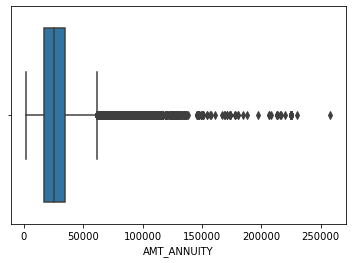

Mean of AMT_ANNUITY: 27108.48784108536
Median of AMT_ANNUITY: 24903.0
Missing values in AMT_ANNUITY: 0


In [17]:
# Imputing the missing values for AMT_ANNUITY
# Check the minimum, maixmum, 25%, 50%, 75%
print(appln_data.AMT_ANNUITY.describe())
#Plot the Boxplot for AMT_ANNUITY to check the outliers 
sns.boxplot(appln_data.AMT_ANNUITY)
plt.show()
#Finding the mean, median of AMT_ANNUTY
AMT_ANNUITY_Mean=appln_data.AMT_ANNUITY.mean()
print('Mean of AMT_ANNUITY:', AMT_ANNUITY_Mean)
AMT_ANNUITY_Median=appln_data.AMT_ANNUITY.median()
print('Median of AMT_ANNUITY:', AMT_ANNUITY_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
appln_data.AMT_ANNUITY.fillna(AMT_ANNUITY_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_ANNUITY in Application_Data DataSet
print('Missing values in AMT_ANNUITY:',appln_data.AMT_ANNUITY.isnull().sum())

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64


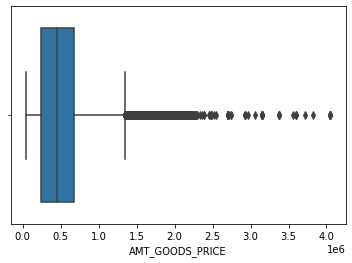

Mean of AMT_GOODS_PRICE: 538396.2074288895
Median of AMT_GOODS_PRICE: 450000.0
Missing values in AMT_GOODS_PRICE: 0


In [18]:
# Imputing the missing values for AMT_GOODS_PRICE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.AMT_GOODS_PRICE.describe())
#Plot the Boxplot for AMT_GOODS_PRICE to check the outliers 
sns.boxplot(appln_data.AMT_GOODS_PRICE)
plt.show()
#Finding the mean, median of AMT_GOODS_PRICE
AMT_GOODS_PRICE_Mean=appln_data.AMT_GOODS_PRICE.mean()
print('Mean of AMT_GOODS_PRICE:',AMT_GOODS_PRICE_Mean)
AMT_GOODS_PRICE_Median=appln_data.AMT_GOODS_PRICE.median()
print('Median of AMT_GOODS_PRICE:',AMT_GOODS_PRICE_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
appln_data.AMT_GOODS_PRICE.fillna(AMT_GOODS_PRICE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_GOODS_PRICE in Application_Data DataSet
print('Missing values in AMT_GOODS_PRICE:',appln_data.AMT_GOODS_PRICE.isnull().sum())

count            306219
unique                7
top       Unaccompanied
freq             248526
Name: NAME_TYPE_SUITE, dtype: object


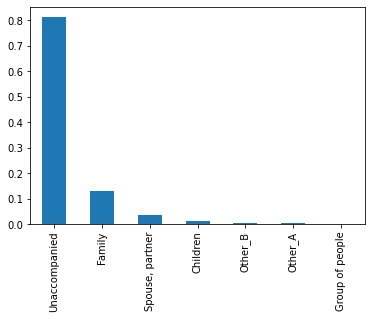

Missing values in NAME_TYPE_SUITE: 0


In [19]:
# Imputing the missing values for NAME_TYPE_SUITE which is a categorical column
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.NAME_TYPE_SUITE.describe())
# Based on the output, we conclude that it is categorical column so that we can calculate mode of NAME_TYPE_SUITE
NAME_TYPE_SUITE_Mode = appln_data.NAME_TYPE_SUITE.mode()[0]
#Plot the Bar for NAME_TYPE_SUITE to check which type is having high percentage  
appln_data.NAME_TYPE_SUITE.value_counts(normalize=True).plot.bar()
plt.show()
#Imputing the missing values with Mode
appln_data.NAME_TYPE_SUITE.fillna(NAME_TYPE_SUITE_Mode, inplace=True)
# After imputing the missing values with mode, check the missing values of NAME_TYPE_SUITE in Application_Data DataSet
print('Missing values in NAME_TYPE_SUITE:',appln_data.NAME_TYPE_SUITE.isnull().sum())

count    307509.000000
mean          2.152665
std           0.910682
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64


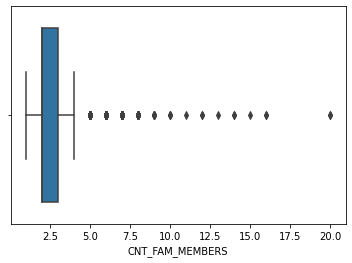

Mean of CNT_FAM_MEMBERS: 2.152665450442101
Median of CNT_FAM_MEMBERS: 2.0
Missing values in CNT_FAM_MEMBERS: 0


In [20]:
# Imputing the missing values for CNT_FAM_MEMBERS
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.CNT_FAM_MEMBERS.describe())
#Plot the Boxplot for CNT_FAM_MEMBERS to check the outliers 
sns.boxplot(appln_data.CNT_FAM_MEMBERS)
plt.show()
#Finding the mean, median of CNT_FAM_MEMBERS
CNT_FAM_MEMBERS_Mean=appln_data.CNT_FAM_MEMBERS.mean()
print('Mean of CNT_FAM_MEMBERS:',CNT_FAM_MEMBERS_Mean)
CNT_FAM_MEMBERS_Median=appln_data.CNT_FAM_MEMBERS.median()
print('Median of CNT_FAM_MEMBERS:',CNT_FAM_MEMBERS_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
appln_data.CNT_FAM_MEMBERS.fillna(CNT_FAM_MEMBERS_Median, inplace=True)
# After imputing the missing values with median, check the missing values of CNT_FAM_MEMBERS in Application_Data DataSet
print('Missing values in CNT_FAM_MEMBERS:',appln_data.CNT_FAM_MEMBERS.isnull().sum())

count    3.075110e+05
mean     5.145034e-01
std      1.908699e-01
min      8.173617e-08
25%      3.929737e-01
50%      5.659614e-01
75%      6.634218e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64


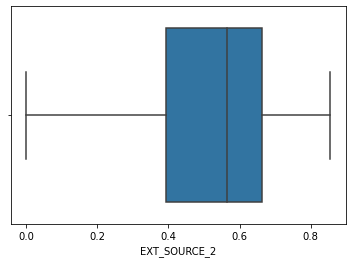

Mean of EXT_SOURCE_2: 0.5145033543220444
Median of EXT_SOURCE_2: 0.5659614260608526
Missing values in EXT_SOURCE_2: 0


In [22]:
# Imputing the missing values for EXT_SOURCE_2
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.EXT_SOURCE_2.describe())
#Plot the Boxplot for EXT_SOURCE_2 to check the outliers 
sns.boxplot(appln_data.EXT_SOURCE_2)
plt.show()
#Finding the mean, median of EXT_SOURCE_2
EXT_SOURCE_2_Mean=appln_data.EXT_SOURCE_2.mean()
print('Mean of EXT_SOURCE_2:',EXT_SOURCE_2_Mean)
EXT_SOURCE_2_Median=appln_data.EXT_SOURCE_2.median()
print('Median of EXT_SOURCE_2:',EXT_SOURCE_2_Median)
#Imputing the missing values with Mean as there are no outliers for EXT_SOURCE_2
appln_data.EXT_SOURCE_2.fillna(EXT_SOURCE_2_Mean, inplace=True)
# After imputing the missing values with median, check the missing values of EXT_SOURCE_2 in Application_Data DataSet
print('Missing values in EXT_SOURCE_2:',appln_data.EXT_SOURCE_2.isnull().sum())

count     161756
unique         2
top           No
freq      159428
Name: EMERGENCYSTATE_MODE, dtype: object


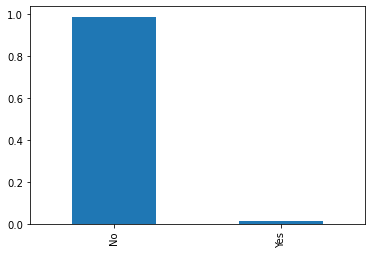

Missing values in EMERGENCYSTATE_MODE: 0


In [23]:
# Imputing the missing values for EMERGENCYSTATE_MODE which is a categorical column
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.EMERGENCYSTATE_MODE.describe())
# Based on the output, we conclude that it is categorical column so that we can calculate mode of EMERGENCYSTATE_MODE
EMERGENCYSTATE_MODE_Mode = appln_data.EMERGENCYSTATE_MODE.mode()[0]
#Plot the Bar for EMERGENCYSTATE_MODE to check which type is having high percentage  
appln_data.EMERGENCYSTATE_MODE.value_counts(normalize=True).plot.bar()
plt.show()
#Imputing the missing values with Mode
appln_data.EMERGENCYSTATE_MODE.fillna(EMERGENCYSTATE_MODE_Mode, inplace=True)
# After imputing the missing values with mode, check the missing values of EMERGENCYSTATE_MODE in Application_Data DataSet
print('Missing values in EMERGENCYSTATE_MODE:',appln_data.EMERGENCYSTATE_MODE.isnull().sum())

#### Now I will impute the other missing values either with mean, median and mode according to the type of the column to get rid of the missing values
I  will change the type of the column based on the value_counts of each column, in this way we can easily impute values based on the type without affecting the data

In [25]:
appln_data.nunique().sort_values(ascending=True)

FLAG_DOCUMENT_3                      2
FLAG_PHONE                           2
FLAG_DOCUMENT_4                      2
FLAG_DOCUMENT_2                      2
REG_REGION_NOT_LIVE_REGION           2
REG_REGION_NOT_WORK_REGION           2
LIVE_REGION_NOT_WORK_REGION          2
REG_CITY_NOT_LIVE_CITY               2
REG_CITY_NOT_WORK_CITY               2
LIVE_CITY_NOT_WORK_CITY              2
FLAG_DOCUMENT_14                     2
FLAG_DOCUMENT_13                     2
FLAG_DOCUMENT_12                     2
FLAG_DOCUMENT_11                     2
FLAG_DOCUMENT_10                     2
FLAG_DOCUMENT_9                      2
FLAG_DOCUMENT_8                      2
FLAG_DOCUMENT_7                      2
EMERGENCYSTATE_MODE                  2
FLAG_DOCUMENT_6                      2
FLAG_CONT_MOBILE                     2
FLAG_WORK_PHONE                      2
FLAG_EMAIL                           2
FLAG_MOBIL                           2
TARGET                               2
NAME_CONTRACT_TYPE       

In [27]:
for cols in appln_data.columns:
    if appln_data[cols].nunique() <= 3: # I am considering columns with 3 unique values as categorical variables
        appln_data[cols] = appln_data[cols].astype(object)

#### Now extract the columns which are numerical from the Application_Data DataSet

In [31]:
appln_data.describe()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,3.075110e+05,307511.000000,157504.000000,154491.000000,157504.000000,154491.000000,157504.000000,154491.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.417052,1.687979e+05,5.990260e+05,27108.487841,5.383163e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,2.152664,12.063419,5.145034e-01,0.510853,0.977735,0.226282,0.977065,0.222315,0.977752,0.225897,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.722121,2.371231e+05,4.024908e+05,14493.461065,3.692890e+05,0.013831,4363.988632,141275.766519,3522.886321,1509.450419,0.910679,3.265832,1.908699e-01,0.174464,0.059223,0.144641,0.064575,0.143709,0.059897,0.145067,0.107462,2.400989,0.446698,2.379803,0.362291,826.808487,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,1.000000,0.000000,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,-4299.000000,2.000000,10.000000,3.929737e-01,0.417100,0.976700,0.166700,0.976700,0.166700,0.976700,0.166700,0.041200,0.000000,0.000000,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,-3254.000000,2.000000,12.000000,5.659614e-01,0.510853,0.981600,0.166700,0.981600,0.166700,0.981600,0.166700,0.068800,0.000000,0.000000,0.000000,0.000000,-757.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,-1720.000000,3.000000,14.000000,6.634218e-01,0.636376,0.986600,0.333300,0.986600,0.333300,0.986600,0.333300,0.127600,2.000000,0.000000,2.000000,0.000000,-274.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,0.000000,20.000000,23.000000,8.549997e-01,0.896010,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,348.000000,34.000000,344.000000,24.000000,0.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


#### Numerical Columns in Application_Data DataSet
From the above result, we can clearly say that below are numerical columns
SK_ID_CURR, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, CNT_FAM_MEMBERS, HOUR_APPR_PROCESS_START, EXT_SOURCE_2, EXT_SOURCE_3, YEARS_BEGINEXPLUATATION_AVG, FLOORSMAX_AVG, YEARS_BEGINEXPLUATATION_MODE, FLOORSMAX_MODE, YEARS_BEGINEXPLUATATION_MEDI, FLOORSMAX_MEDI, TOTALAREA_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR

#### Now extract the columns which are categorical from the Application_Data DataSet

In [32]:
# Here I am using set operation to perform difference on Application_Data DataSet to get the categorical columns
set(appln_data.columns)-set(appln_data.describe())

{'CODE_GENDER',
 'EMERGENCYSTATE_MODE',
 'FLAG_CONT_MOBILE',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_EMAIL',
 'FLAG_EMP_PHONE',
 'FLAG_MOBIL',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_PHONE',
 'FLAG_WORK_PHONE',
 'LIVE_CITY_NOT_WORK_CITY',
 'LIVE_REGION_NOT_WORK_REGION',
 'NAME_CONTRACT_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'NAME_INCOME_TYPE',
 'NAME_TYPE_SUITE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION'

count    307511.000000
mean          0.510853
std           0.174464
min           0.000527
25%           0.417100
50%           0.510853
75%           0.636376
max           0.896010
Name: EXT_SOURCE_3, dtype: float64


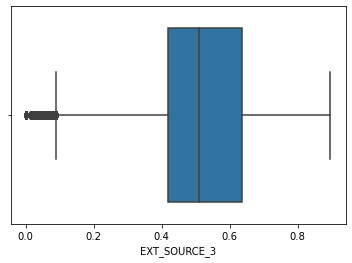

Mean of EXT_SOURCE_3: 0.5108529061805426
Median of EXT_SOURCE_3: 0.5108529061800121
Missing values in EXT_SOURCE_3: 0


In [33]:
# Imputing the missing values for EXT_SOURCE_3
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.EXT_SOURCE_3.describe())
#Plot the Boxplot for EXT_SOURCE_3 to check the outliers 
sns.boxplot(appln_data.EXT_SOURCE_3)
plt.show()
#Finding the mean, median of EXT_SOURCE_3
EXT_SOURCE_3_Mean=appln_data.EXT_SOURCE_3.mean()
print('Mean of EXT_SOURCE_3:',EXT_SOURCE_3_Mean)
EXT_SOURCE_3_Median=appln_data.EXT_SOURCE_3.median()
print('Median of EXT_SOURCE_3:',EXT_SOURCE_3_Median)
#Imputing the missing values with Mean as there are no outliers for EXT_SOURCE_3
appln_data.EXT_SOURCE_3.fillna(EXT_SOURCE_3_Mean, inplace=True)
# After imputing the missing values with median, check the missing values of EXT_SOURCE_3 in Application_Data DataSet
print('Missing values in EXT_SOURCE_3:',appln_data.EXT_SOURCE_3.isnull().sum())

count    307510.000000
mean        962.858788
std         826.808487
min           0.000000
25%         274.000000
50%         757.000000
75%        1570.000000
max        4292.000000
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64


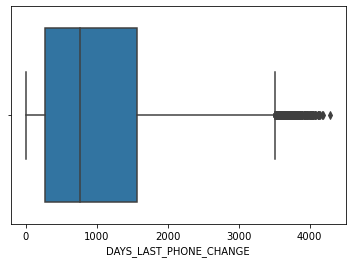

Mean of DAYS_LAST_PHONE_CHANGE: 962.8587883320868
Median of DAYS_LAST_PHONE_CHANGE: 757.0
Missing values in DAYS_LAST_PHONE_CHANGE: 0


In [37]:
# Imputing the missing values for DAYS_LAST_PHONE_CHANGE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.DAYS_LAST_PHONE_CHANGE.describe())
#Plot the Boxplot for DAYS_LAST_PHONE_CHANGE to check the outliers 
sns.boxplot(appln_data.DAYS_LAST_PHONE_CHANGE)
plt.show()
#Finding the mean, median of DAYS_LAST_PHONE_CHANGE
DAYS_LAST_PHONE_CHANGE_Mean=appln_data.DAYS_LAST_PHONE_CHANGE.mean()
print('Mean of DAYS_LAST_PHONE_CHANGE:',DAYS_LAST_PHONE_CHANGE_Mean)
DAYS_LAST_PHONE_CHANGE_Median=appln_data.DAYS_LAST_PHONE_CHANGE.median()
print('Median of DAYS_LAST_PHONE_CHANGE:',DAYS_LAST_PHONE_CHANGE_Median)
#Imputing the missing values with Median as there are outliers for DAYS_LAST_PHONE_CHANGE
appln_data.DAYS_LAST_PHONE_CHANGE.fillna(DAYS_LAST_PHONE_CHANGE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of DAYS_LAST_PHONE_CHANGE in Application_Data DataSet
print('Missing values in DAYS_LAST_PHONE_CHANGE:',appln_data.DAYS_LAST_PHONE_CHANGE.isnull().sum())


count    307511.000000
mean          0.053049
std           0.092735
min           0.000000
25%           0.000000
50%           0.005000
75%           0.070300
max           1.000000
Name: TOTALAREA_MODE, dtype: float64


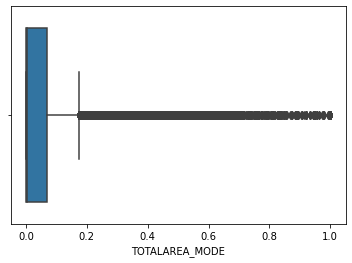

Mean of TOTALAREA_MODE: 0.05304890914471287
Median of TOTALAREA_MODE: 0.005
Missing values in TOTALAREA_MODE: 0


In [39]:
# Imputing the missing values for TOTALAREA_MODE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.TOTALAREA_MODE.describe())
#Plot the Boxplot for TOTALAREA_MODE to check the outliers 
sns.boxplot(appln_data.TOTALAREA_MODE)
plt.show()
#Finding the mean, median of TOTALAREA_MODE
TOTALAREA_MODE_Mean=appln_data.TOTALAREA_MODE.mean()
print('Mean of TOTALAREA_MODE:',TOTALAREA_MODE_Mean)
TOTALAREA_MODE_Median=appln_data.TOTALAREA_MODE.median()
print('Median of TOTALAREA_MODE:',TOTALAREA_MODE_Median)
#Imputing the missing values with Median as there are outliers for TOTALAREA_MODE
appln_data.TOTALAREA_MODE.fillna(TOTALAREA_MODE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of TOTALAREA_MODE in Application_Data DataSet
print('Missing values in TOTALAREA_MODE:',appln_data.TOTALAREA_MODE.isnull().sum())


count    307511.000000
mean          0.196633
std           0.106761
min           0.000000
25%           0.166700
50%           0.166700
75%           0.166700
max           1.000000
Name: FLOORSMAX_AVG, dtype: float64


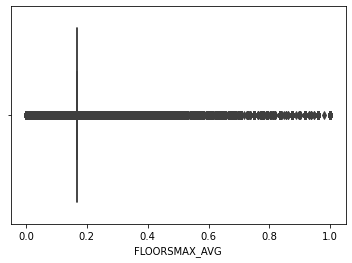

Mean of FLOORSMAX_AVG: 0.19663346059233838
Median of FLOORSMAX_AVG: 0.1667
Missing values in FLOORSMAX_AVG: 0
count    307511.000000
mean          0.194641
std           0.105588
min           0.000000
25%           0.166700
50%           0.166700
75%           0.166700
max           1.000000
Name: FLOORSMAX_MODE, dtype: float64


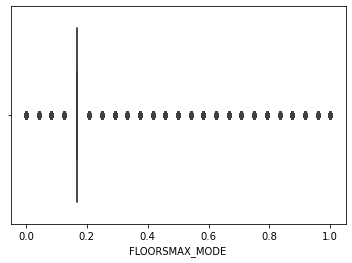

Mean of FLOORSMAX_MODE: 0.19464054294061817
Median of FLOORSMAX_MODE: 0.1667
Missing values in FLOORSMAX_MODE: 0
count    154491.000000
mean          0.225897
std           0.145067
min           0.000000
25%           0.166700
50%           0.166700
75%           0.333300
max           1.000000
Name: FLOORSMAX_MEDI, dtype: float64


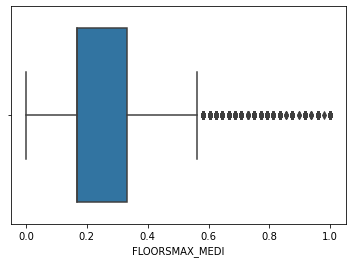

Mean of FLOORSMAX_MEDI: 0.22589659009280993
Median of FLOORSMAX_MEDI: 0.1667
Missing values in FLOORSMAX_MEDI: 0


In [46]:
# Imputing the missing values for FLOORSMAX_AVG
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.FLOORSMAX_AVG.describe())
#Plot the Boxplot for FLOORSMAX_AVG to check the outliers 
sns.boxplot(appln_data.FLOORSMAX_AVG)
plt.show()
#Finding the mean, median of FLOORSMAX_AVG
FLOORSMAX_AVG_Mean=appln_data.FLOORSMAX_AVG.mean()
print('Mean of FLOORSMAX_AVG:',FLOORSMAX_AVG_Mean)
FLOORSMAX_AVG_Median=appln_data.FLOORSMAX_AVG.median()
print('Median of FLOORSMAX_AVG:',FLOORSMAX_AVG_Median)
#Imputing the missing values with Median as there are outliers for FLOORSMAX_AVG
appln_data.FLOORSMAX_AVG.fillna(FLOORSMAX_AVG_Median, inplace=True)
# After imputing the missing values with median, check the missing values of FLOORSMAX_AVG in Application_Data DataSet
print('Missing values in FLOORSMAX_AVG:',appln_data.FLOORSMAX_AVG.isnull().sum())
print('\n')

# Imputing the missing values for FLOORSMAX_MODE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.FLOORSMAX_MODE.describe())
#Plot the Boxplot for FLOORSMAX_MODE to check the outliers 
sns.boxplot(appln_data.FLOORSMAX_MODE)
plt.show()
#Finding the mean, median of FLOORSMAX_MODE
FLOORSMAX_MODE_Mean=appln_data.FLOORSMAX_MODE.mean()
print('Mean of FLOORSMAX_MODE:',FLOORSMAX_MODE_Mean)
FLOORSMAX_MODE_Median=appln_data.FLOORSMAX_MODE.median()
print('Median of FLOORSMAX_MODE:',FLOORSMAX_MODE_Median)
#Imputing the missing values with Median as there are outliers for FLOORSMAX_MODE
appln_data.FLOORSMAX_MODE.fillna(FLOORSMAX_MODE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of FLOORSMAX_MODE in Application_Data DataSet
print('Missing values in FLOORSMAX_MODE:',appln_data.FLOORSMAX_MODE.isnull().sum())
print('\n')

# Imputing the missing values for FLOORSMAX_MEDI
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.FLOORSMAX_MEDI.describe())
#Plot the Boxplot for FLOORSMAX_MEDI to check the outliers 
sns.boxplot(appln_data.FLOORSMAX_MEDI)
plt.show()
#Finding the mean, median of FLOORSMAX_MODE
FLOORSMAX_MEDI_Mean=appln_data.FLOORSMAX_MEDI.mean()
print('Mean of FLOORSMAX_MEDI:',FLOORSMAX_MEDI_Mean)
FLOORSMAX_MEDI_Median=appln_data.FLOORSMAX_MEDI.median()
print('Median of FLOORSMAX_MEDI:',FLOORSMAX_MEDI_Median)
#Imputing the missing values with Median as there are outliers for FLOORSMAX_MODE
appln_data.FLOORSMAX_MEDI.fillna(FLOORSMAX_MEDI_Median, inplace=True)
# After imputing the missing values with median, check the missing values of FLOORSMAX_MODE in Application_Data DataSet
print('Missing values in FLOORSMAX_MEDI:',appln_data.FLOORSMAX_MEDI.isnull().sum())

count    307511.000000
mean          0.979620
std           0.042429
min           0.000000
25%           0.981600
50%           0.981600
75%           0.982100
max           1.000000
Name: YEARS_BEGINEXPLUATATION_AVG, dtype: float64


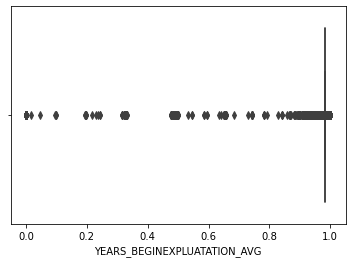

Mean of YEARS_BEGINEXPLUATATION_AVG: 0.9796203137444767
Median of YEARS_BEGINEXPLUATATION_AVG: 0.9816
Missing values in YEARS_BEGINEXPLUATATION_AVG: 0


count    307511.000000
mean          0.979629
std           0.042910
min           0.000000
25%           0.981600
50%           0.981600
75%           0.982100
max           1.000000
Name: YEARS_BEGINEXPLUATATION_MEDI, dtype: float64


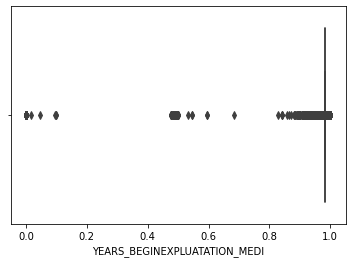

Mean of YEARS_BEGINEXPLUATATION_MEDI: 0.9796292288727173
Median of YEARS_BEGINEXPLUATATION_MEDI: 0.9816
Missing values in YEARS_BEGINEXPLUATATION_MEDI: 0


count    307511.000000
mean          0.979277
std           0.046270
min           0.000000
25%           0.981100
50%           0.981600
75%           0.981600
max           1.000000
Name: YEARS_BEGINEXPLUATATION_MODE, dtype: float64


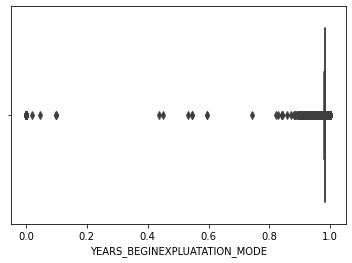

Mean of YEARS_BEGINEXPLUATATION_MODE: 0.9792774102385587
Median of YEARS_BEGINEXPLUATATION_MODE: 0.9816
Missing values in YEARS_BEGINEXPLUATATION_MODE: 0


In [51]:
# Imputing the missing values for YEARS_BEGINEXPLUATATION_AVG
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.YEARS_BEGINEXPLUATATION_AVG.describe())
#Plot the Boxplot for YEARS_BEGINEXPLUATATION_AVG to check the outliers 
sns.boxplot(appln_data.YEARS_BEGINEXPLUATATION_AVG)
plt.show()
#Finding the mean, median of YEARS_BEGINEXPLUATATION_AVG
YEARS_BEGINEXPLUATATION_AVG_Mean=appln_data.YEARS_BEGINEXPLUATATION_AVG.mean()
print('Mean of YEARS_BEGINEXPLUATATION_AVG:',YEARS_BEGINEXPLUATATION_AVG_Mean)
YEARS_BEGINEXPLUATATION_AVG_Median=appln_data.YEARS_BEGINEXPLUATATION_AVG.median()
print('Median of YEARS_BEGINEXPLUATATION_AVG:',YEARS_BEGINEXPLUATATION_AVG_Median)
#Imputing the missing values with Median as there are outliers for YEARS_BEGINEXPLUATATION_AVG
appln_data.YEARS_BEGINEXPLUATATION_AVG.fillna(YEARS_BEGINEXPLUATATION_AVG_Median, inplace=True)
# After imputing the missing values with median, check the missing values of YEARS_BEGINEXPLUATATION_AVG in Application_Data DataSet
print('Missing values in YEARS_BEGINEXPLUATATION_AVG:',appln_data.YEARS_BEGINEXPLUATATION_AVG.isnull().sum())
print('\n')

# Imputing the missing values for YEARS_BEGINEXPLUATATION_MEDI
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.YEARS_BEGINEXPLUATATION_MEDI.describe())
#Plot the Boxplot for YEARS_BEGINEXPLUATATION_MEDI to check the outliers 
sns.boxplot(appln_data.YEARS_BEGINEXPLUATATION_MEDI)
plt.show()
#Finding the mean, median of YEARS_BEGINEXPLUATATION_MEDI
YEARS_BEGINEXPLUATATION_MEDI_Mean=appln_data.YEARS_BEGINEXPLUATATION_MEDI.mean()
print('Mean of YEARS_BEGINEXPLUATATION_MEDI:',YEARS_BEGINEXPLUATATION_MEDI_Mean)
YEARS_BEGINEXPLUATATION_MEDI_Median=appln_data.YEARS_BEGINEXPLUATATION_MEDI.median()
print('Median of YEARS_BEGINEXPLUATATION_MEDI:',YEARS_BEGINEXPLUATATION_MEDI_Median)
#Imputing the missing values with Median as there are outliers for YEARS_BEGINEXPLUATATION_MEDI
appln_data.YEARS_BEGINEXPLUATATION_MEDI.fillna(YEARS_BEGINEXPLUATATION_MEDI_Median, inplace=True)
# After imputing the missing values with median, check the missing values of YEARS_BEGINEXPLUATATION_MEDI in Application_Data DataSet
print('Missing values in YEARS_BEGINEXPLUATATION_MEDI:',appln_data.YEARS_BEGINEXPLUATATION_MEDI.isnull().sum())
print('\n')

# Imputing the missing values for YEARS_BEGINEXPLUATATION_MODE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.YEARS_BEGINEXPLUATATION_MODE.describe())
#Plot the Boxplot for YEARS_BEGINEXPLUATATION_MODE to check the outliers 
sns.boxplot(appln_data.YEARS_BEGINEXPLUATATION_MODE)
plt.show()
#Finding the mean, median of YEARS_BEGINEXPLUATATION_MODE
YEARS_BEGINEXPLUATATION_MODE_Mean=appln_data.YEARS_BEGINEXPLUATATION_MODE.mean()
print('Mean of YEARS_BEGINEXPLUATATION_MODE:',YEARS_BEGINEXPLUATATION_MODE_Mean)
YEARS_BEGINEXPLUATATION_MODE_Median=appln_data.YEARS_BEGINEXPLUATATION_MODE.median()
print('Median of YEARS_BEGINEXPLUATATION_MODE:',YEARS_BEGINEXPLUATATION_MODE_Median)
#Imputing the missing values with Median as there are outliers for YEARS_BEGINEXPLUATATION_MODE
appln_data.YEARS_BEGINEXPLUATATION_MODE.fillna(YEARS_BEGINEXPLUATATION_MODE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of YEARS_BEGINEXPLUATATION_MODE in Application_Data DataSet
print('Missing values in YEARS_BEGINEXPLUATATION_MODE:',appln_data.YEARS_BEGINEXPLUATATION_MODE.isnull().sum())

count    306490.000000
mean          1.422245
std           2.400989
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         348.000000
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: float64


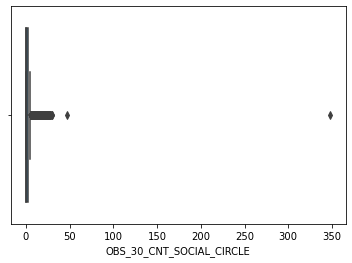

Mean of OBS_30_CNT_SOCIAL_CIRCLE: 1.4222454239942575
Median of OBS_30_CNT_SOCIAL_CIRCLE: 0.0
Missing values in OBS_30_CNT_SOCIAL_CIRCLE: 0


count    306490.000000
mean          1.405292
std           2.379803
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         344.000000
Name: OBS_60_CNT_SOCIAL_CIRCLE, dtype: float64


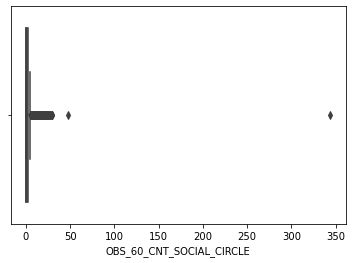

Mean of OBS_60_CNT_SOCIAL_CIRCLE: 1.4052921791901856
Median of OBS_60_CNT_SOCIAL_CIRCLE: 0.0
Missing values in OBS_60_CNT_SOCIAL_CIRCLE: 0


count    306490.000000
mean          0.143421
std           0.446698
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          34.000000
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: float64


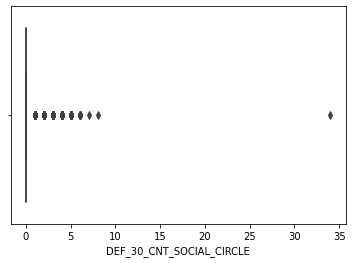

Mean of DEF_30_CNT_SOCIAL_CIRCLE: 0.1434206662533851
Median of DEF_30_CNT_SOCIAL_CIRCLE: 0.0
Missing values in DEF_30_CNT_SOCIAL_CIRCLE: 0


count    306490.000000
mean          0.100049
std           0.362291
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          24.000000
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: float64


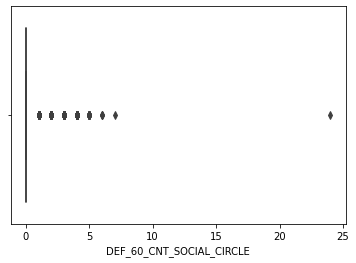

Mean of DEF_60_CNT_SOCIAL_CIRCLE: 0.10004894123788705
Median of DEF_60_CNT_SOCIAL_CIRCLE: 0.0
Missing values in DEF_60_CNT_SOCIAL_CIRCLE: 0




In [52]:
# Imputing the missing values for OBS_30_CNT_SOCIAL_CIRCLE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.OBS_30_CNT_SOCIAL_CIRCLE.describe())
#Plot the Boxplot for OBS_30_CNT_SOCIAL_CIRCLE to check the outliers 
sns.boxplot(appln_data.OBS_30_CNT_SOCIAL_CIRCLE)
plt.show()
#Finding the mean, median of OBS_30_CNT_SOCIAL_CIRCLE
OBS_30_CNT_SOCIAL_CIRCLE_Mean=appln_data.OBS_30_CNT_SOCIAL_CIRCLE.mean()
print('Mean of OBS_30_CNT_SOCIAL_CIRCLE:',OBS_30_CNT_SOCIAL_CIRCLE_Mean)
OBS_30_CNT_SOCIAL_CIRCLE_Median=appln_data.OBS_30_CNT_SOCIAL_CIRCLE.median()
print('Median of OBS_30_CNT_SOCIAL_CIRCLE:',OBS_30_CNT_SOCIAL_CIRCLE_Median)
#Imputing the missing values with Median as there are outliers for OBS_30_CNT_SOCIAL_CIRCLE
appln_data.OBS_30_CNT_SOCIAL_CIRCLE.fillna(OBS_30_CNT_SOCIAL_CIRCLE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of OBS_30_CNT_SOCIAL_CIRCLE in Application_Data DataSet
print('Missing values in OBS_30_CNT_SOCIAL_CIRCLE:',appln_data.OBS_30_CNT_SOCIAL_CIRCLE.isnull().sum())
print('\n')

# Imputing the missing values for OBS_60_CNT_SOCIAL_CIRCLE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.OBS_60_CNT_SOCIAL_CIRCLE.describe())
#Plot the Boxplot for OBS_60_CNT_SOCIAL_CIRCLE to check the outliers 
sns.boxplot(appln_data.OBS_60_CNT_SOCIAL_CIRCLE)
plt.show()
#Finding the mean, median of OBS_60_CNT_SOCIAL_CIRCLE
OBS_60_CNT_SOCIAL_CIRCLE_Mean=appln_data.OBS_60_CNT_SOCIAL_CIRCLE.mean()
print('Mean of OBS_60_CNT_SOCIAL_CIRCLE:',OBS_60_CNT_SOCIAL_CIRCLE_Mean)
OBS_60_CNT_SOCIAL_CIRCLE_Median=appln_data.OBS_60_CNT_SOCIAL_CIRCLE.median()
print('Median of OBS_60_CNT_SOCIAL_CIRCLE:',OBS_60_CNT_SOCIAL_CIRCLE_Median)
#Imputing the missing values with Median as there are outliers for OBS_60_CNT_SOCIAL_CIRCLE
appln_data.OBS_60_CNT_SOCIAL_CIRCLE.fillna(OBS_60_CNT_SOCIAL_CIRCLE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of OBS_60_CNT_SOCIAL_CIRCLE in Application_Data DataSet
print('Missing values in OBS_60_CNT_SOCIAL_CIRCLE:',appln_data.OBS_60_CNT_SOCIAL_CIRCLE.isnull().sum())
print('\n')

# Imputing the missing values for DEF_30_CNT_SOCIAL_CIRCLE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.DEF_30_CNT_SOCIAL_CIRCLE.describe())
#Plot the Boxplot for DEF_30_CNT_SOCIAL_CIRCLE to check the outliers 
sns.boxplot(appln_data.DEF_30_CNT_SOCIAL_CIRCLE)
plt.show()
#Finding the mean, median of DEF_30_CNT_SOCIAL_CIRCLE
DEF_30_CNT_SOCIAL_CIRCLE_Mean=appln_data.DEF_30_CNT_SOCIAL_CIRCLE.mean()
print('Mean of DEF_30_CNT_SOCIAL_CIRCLE:',DEF_30_CNT_SOCIAL_CIRCLE_Mean)
DEF_30_CNT_SOCIAL_CIRCLE_Median=appln_data.DEF_30_CNT_SOCIAL_CIRCLE.median()
print('Median of DEF_30_CNT_SOCIAL_CIRCLE:',DEF_30_CNT_SOCIAL_CIRCLE_Median)
#Imputing the missing values with Median as there are outliers for DEF_30_CNT_SOCIAL_CIRCLE
appln_data.DEF_30_CNT_SOCIAL_CIRCLE.fillna(DEF_30_CNT_SOCIAL_CIRCLE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of DEF_30_CNT_SOCIAL_CIRCLE in Application_Data DataSet
print('Missing values in DEF_30_CNT_SOCIAL_CIRCLE:',appln_data.DEF_30_CNT_SOCIAL_CIRCLE.isnull().sum())
print('\n')

# Imputing the missing values for DEF_60_CNT_SOCIAL_CIRCLE
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.DEF_60_CNT_SOCIAL_CIRCLE.describe())
#Plot the Boxplot for DEF_60_CNT_SOCIAL_CIRCLE to check the outliers 
sns.boxplot(appln_data.DEF_60_CNT_SOCIAL_CIRCLE)
plt.show()
#Finding the mean, median of DEF_60_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE_Mean=appln_data.DEF_60_CNT_SOCIAL_CIRCLE.mean()
print('Mean of DEF_60_CNT_SOCIAL_CIRCLE:',DEF_60_CNT_SOCIAL_CIRCLE_Mean)
DEF_60_CNT_SOCIAL_CIRCLE_Median=appln_data.DEF_60_CNT_SOCIAL_CIRCLE.median()
print('Median of DEF_60_CNT_SOCIAL_CIRCLE:',DEF_60_CNT_SOCIAL_CIRCLE_Median)
#Imputing the missing values with Median as there are outliers for DEF_60_CNT_SOCIAL_CIRCLE
appln_data.DEF_60_CNT_SOCIAL_CIRCLE.fillna(DEF_60_CNT_SOCIAL_CIRCLE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of DEF_60_CNT_SOCIAL_CIRCLE in Application_Data DataSet
print('Missing values in DEF_60_CNT_SOCIAL_CIRCLE:',appln_data.DEF_60_CNT_SOCIAL_CIRCLE.isnull().sum())
print('\n')

count    265992.000000
mean          0.006402
std           0.083849
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           4.000000
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: float64


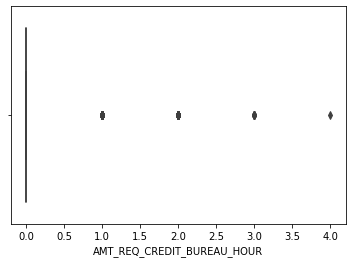

Mean of AMT_REQ_CREDIT_BUREAU_HOUR: 0.006402448193930645
Median of AMT_REQ_CREDIT_BUREAU_HOUR: 0.0
Missing values in AMT_REQ_CREDIT_BUREAU_HOUR: 0


count    265992.000000
mean          0.007000
std           0.110757
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           9.000000
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: float64


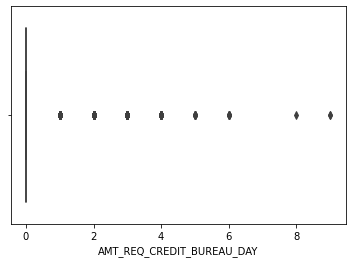

Mean of AMT_REQ_CREDIT_BUREAU_DAY: 0.0070002105326475985
Median of AMT_REQ_CREDIT_BUREAU_DAY: 0.0
Missing values in AMT_REQ_CREDIT_BUREAU_DAY: 0


count    265992.000000
mean          0.034362
std           0.204685
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           8.000000
Name: AMT_REQ_CREDIT_BUREAU_WEEK, dtype: float64


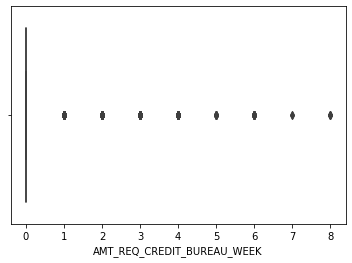

Mean of AMT_REQ_CREDIT_BUREAU_WEEK: 0.0343619356973142
Median of AMT_REQ_CREDIT_BUREAU_WEEK: 0.0
Missing values in AMT_REQ_CREDIT_BUREAU_WEEK: 0


count    265992.000000
mean          0.267395
std           0.916002
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          27.000000
Name: AMT_REQ_CREDIT_BUREAU_MON, dtype: float64


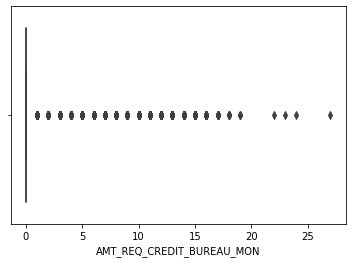

Mean of AMT_REQ_CREDIT_BUREAU_MON: 0.26739526000781977
Median of AMT_REQ_CREDIT_BUREAU_MON: 0.0
Missing values in AMT_REQ_CREDIT_BUREAU_MON: 0


count    265992.000000
mean          0.265474
std           0.794056
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max         261.000000
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: float64


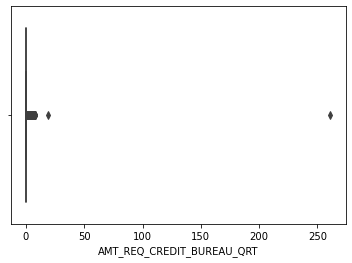

Mean of AMT_REQ_CREDIT_BUREAU_QRT: 0.26547414959848414
Median of AMT_REQ_CREDIT_BUREAU_QRT: 0.0
Missing values in AMT_REQ_CREDIT_BUREAU_QRT: 0


count    265992.000000
mean          1.899974
std           1.869295
min           0.000000
25%           0.000000
50%           1.000000
75%           3.000000
max          25.000000
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: float64


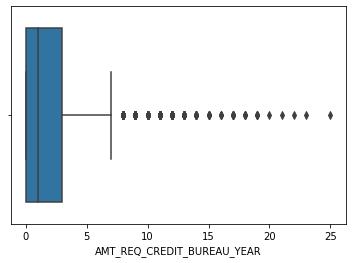

Mean of AMT_REQ_CREDIT_BUREAU_YEAR: 1.899974435321363
Median of AMT_REQ_CREDIT_BUREAU_YEAR: 1.0
Missing values in AMT_REQ_CREDIT_BUREAU_YEAR: 0


In [53]:
# Imputing the missing values for AMT_REQ_CREDIT_BUREAU_HOUR
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.AMT_REQ_CREDIT_BUREAU_HOUR.describe())
#Plot the Boxplot for AMT_REQ_CREDIT_BUREAU_HOUR to check the outliers 
sns.boxplot(appln_data.AMT_REQ_CREDIT_BUREAU_HOUR)
plt.show()
#Finding the mean, median of AMT_REQ_CREDIT_BUREAU_HOUR
AMT_REQ_CREDIT_BUREAU_HOUR_Mean=appln_data.AMT_REQ_CREDIT_BUREAU_HOUR.mean()
print('Mean of AMT_REQ_CREDIT_BUREAU_HOUR:',AMT_REQ_CREDIT_BUREAU_HOUR_Mean)
AMT_REQ_CREDIT_BUREAU_HOUR_Median=appln_data.AMT_REQ_CREDIT_BUREAU_HOUR.median()
print('Median of AMT_REQ_CREDIT_BUREAU_HOUR:',AMT_REQ_CREDIT_BUREAU_HOUR_Median)
#Imputing the missing values with Median as there are outliers for AMT_REQ_CREDIT_BUREAU_HOUR
appln_data.AMT_REQ_CREDIT_BUREAU_HOUR.fillna(AMT_REQ_CREDIT_BUREAU_HOUR_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_REQ_CREDIT_BUREAU_HOUR in Application_Data DataSet
print('Missing values in AMT_REQ_CREDIT_BUREAU_HOUR:',appln_data.AMT_REQ_CREDIT_BUREAU_HOUR.isnull().sum())
print('\n')

# Imputing the missing values for AMT_REQ_CREDIT_BUREAU_DAY
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.AMT_REQ_CREDIT_BUREAU_DAY.describe())
#Plot the Boxplot for AMT_REQ_CREDIT_BUREAU_DAY to check the outliers 
sns.boxplot(appln_data.AMT_REQ_CREDIT_BUREAU_DAY)
plt.show()
#Finding the mean, median of AMT_REQ_CREDIT_BUREAU_DAY
AMT_REQ_CREDIT_BUREAU_DAY_Mean=appln_data.AMT_REQ_CREDIT_BUREAU_DAY.mean()
print('Mean of AMT_REQ_CREDIT_BUREAU_DAY:',AMT_REQ_CREDIT_BUREAU_DAY_Mean)
AMT_REQ_CREDIT_BUREAU_DAY_Median=appln_data.AMT_REQ_CREDIT_BUREAU_DAY.median()
print('Median of AMT_REQ_CREDIT_BUREAU_DAY:',AMT_REQ_CREDIT_BUREAU_DAY_Median)
#Imputing the missing values with Median as there are outliers for AMT_REQ_CREDIT_BUREAU_DAY
appln_data.AMT_REQ_CREDIT_BUREAU_DAY.fillna(AMT_REQ_CREDIT_BUREAU_DAY_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_REQ_CREDIT_BUREAU_DAY in Application_Data DataSet
print('Missing values in AMT_REQ_CREDIT_BUREAU_DAY:',appln_data.AMT_REQ_CREDIT_BUREAU_DAY.isnull().sum())
print('\n')

# Imputing the missing values for AMT_REQ_CREDIT_BUREAU_WEEK
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.AMT_REQ_CREDIT_BUREAU_WEEK.describe())
#Plot the Boxplot for AMT_REQ_CREDIT_BUREAU_WEEK to check the outliers 
sns.boxplot(appln_data.AMT_REQ_CREDIT_BUREAU_WEEK)
plt.show()
#Finding the mean, median of AMT_REQ_CREDIT_BUREAU_WEEK
AMT_REQ_CREDIT_BUREAU_WEEK_Mean=appln_data.AMT_REQ_CREDIT_BUREAU_WEEK.mean()
print('Mean of AMT_REQ_CREDIT_BUREAU_WEEK:',AMT_REQ_CREDIT_BUREAU_WEEK_Mean)
AMT_REQ_CREDIT_BUREAU_WEEK_Median=appln_data.AMT_REQ_CREDIT_BUREAU_WEEK.median()
print('Median of AMT_REQ_CREDIT_BUREAU_WEEK:',AMT_REQ_CREDIT_BUREAU_WEEK_Median)
#Imputing the missing values with Median as there are outliers for AMT_REQ_CREDIT_BUREAU_WEEK
appln_data.AMT_REQ_CREDIT_BUREAU_WEEK.fillna(AMT_REQ_CREDIT_BUREAU_WEEK_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_REQ_CREDIT_BUREAU_WEEK in Application_Data DataSet
print('Missing values in AMT_REQ_CREDIT_BUREAU_WEEK:',appln_data.AMT_REQ_CREDIT_BUREAU_WEEK.isnull().sum())
print('\n')

# Imputing the missing values for AMT_REQ_CREDIT_BUREAU_MON
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.AMT_REQ_CREDIT_BUREAU_MON.describe())
#Plot the Boxplot for AMT_REQ_CREDIT_BUREAU_MON to check the outliers 
sns.boxplot(appln_data.AMT_REQ_CREDIT_BUREAU_MON)
plt.show()
#Finding the mean, median of AMT_REQ_CREDIT_BUREAU_MON
AMT_REQ_CREDIT_BUREAU_MON_Mean=appln_data.AMT_REQ_CREDIT_BUREAU_MON.mean()
print('Mean of AMT_REQ_CREDIT_BUREAU_MON:',AMT_REQ_CREDIT_BUREAU_MON_Mean)
AMT_REQ_CREDIT_BUREAU_MON_Median=appln_data.AMT_REQ_CREDIT_BUREAU_MON.median()
print('Median of AMT_REQ_CREDIT_BUREAU_MON:',AMT_REQ_CREDIT_BUREAU_MON_Median)
#Imputing the missing values with Median as there are outliers for AMT_REQ_CREDIT_BUREAU_MON
appln_data.AMT_REQ_CREDIT_BUREAU_MON.fillna(AMT_REQ_CREDIT_BUREAU_MON_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_REQ_CREDIT_BUREAU_MON in Application_Data DataSet
print('Missing values in AMT_REQ_CREDIT_BUREAU_MON:',appln_data.AMT_REQ_CREDIT_BUREAU_MON.isnull().sum())
print('\n')

# Imputing the missing values for AMT_REQ_CREDIT_BUREAU_QRT
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.AMT_REQ_CREDIT_BUREAU_QRT.describe())
#Plot the Boxplot for AMT_REQ_CREDIT_BUREAU_QRT to check the outliers 
sns.boxplot(appln_data.AMT_REQ_CREDIT_BUREAU_QRT)
plt.show()
#Finding the mean, median of AMT_REQ_CREDIT_BUREAU_QRT
AMT_REQ_CREDIT_BUREAU_QRT_Mean=appln_data.AMT_REQ_CREDIT_BUREAU_QRT.mean()
print('Mean of AMT_REQ_CREDIT_BUREAU_QRT:',AMT_REQ_CREDIT_BUREAU_QRT_Mean)
AMT_REQ_CREDIT_BUREAU_QRT_Median=appln_data.AMT_REQ_CREDIT_BUREAU_QRT.median()
print('Median of AMT_REQ_CREDIT_BUREAU_QRT:',AMT_REQ_CREDIT_BUREAU_QRT_Median)
#Imputing the missing values with Median as there are outliers for AMT_REQ_CREDIT_BUREAU_QRT
appln_data.AMT_REQ_CREDIT_BUREAU_QRT.fillna(AMT_REQ_CREDIT_BUREAU_QRT_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_REQ_CREDIT_BUREAU_QRT in Application_Data DataSet
print('Missing values in AMT_REQ_CREDIT_BUREAU_QRT:',appln_data.AMT_REQ_CREDIT_BUREAU_QRT.isnull().sum())
print('\n')

# Imputing the missing values for AMT_REQ_CREDIT_BUREAU_YEAR
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.AMT_REQ_CREDIT_BUREAU_YEAR.describe())
#Plot the Boxplot for AMT_REQ_CREDIT_BUREAU_YEAR to check the outliers 
sns.boxplot(appln_data.AMT_REQ_CREDIT_BUREAU_YEAR)
plt.show()
#Finding the mean, median of AMT_REQ_CREDIT_BUREAU_YEAR
AMT_REQ_CREDIT_BUREAU_YEAR_Mean=appln_data.AMT_REQ_CREDIT_BUREAU_YEAR.mean()
print('Mean of AMT_REQ_CREDIT_BUREAU_YEAR:',AMT_REQ_CREDIT_BUREAU_YEAR_Mean)
AMT_REQ_CREDIT_BUREAU_YEAR_Median=appln_data.AMT_REQ_CREDIT_BUREAU_YEAR.median()
print('Median of AMT_REQ_CREDIT_BUREAU_YEAR:',AMT_REQ_CREDIT_BUREAU_YEAR_Median)
#Imputing the missing values with Median as there are outliers for AMT_REQ_CREDIT_BUREAU_YEAR
appln_data.AMT_REQ_CREDIT_BUREAU_YEAR.fillna(AMT_REQ_CREDIT_BUREAU_YEAR_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_REQ_CREDIT_BUREAU_YEAR in Application_Data DataSet
print('Missing values in AMT_REQ_CREDIT_BUREAU_YEAR:',appln_data.AMT_REQ_CREDIT_BUREAU_YEAR.isnull().sum())


#### Now check the missing values percentage in the Application_Data DataSet

In [54]:
round(100*appln_data.isnull().sum()/len(appln_data),2)

SK_ID_CURR                       0.00
TARGET                           0.00
NAME_CONTRACT_TYPE               0.00
CODE_GENDER                      0.00
FLAG_OWN_CAR                     0.00
FLAG_OWN_REALTY                  0.00
CNT_CHILDREN                     0.00
AMT_INCOME_TOTAL                 0.00
AMT_CREDIT                       0.00
AMT_ANNUITY                      0.00
AMT_GOODS_PRICE                  0.00
NAME_TYPE_SUITE                  0.00
NAME_INCOME_TYPE                 0.00
NAME_EDUCATION_TYPE              0.00
NAME_FAMILY_STATUS               0.00
NAME_HOUSING_TYPE                0.00
REGION_POPULATION_RELATIVE       0.00
DAYS_BIRTH                       0.00
DAYS_EMPLOYED                    0.00
DAYS_REGISTRATION                0.00
DAYS_ID_PUBLISH                  0.00
FLAG_MOBIL                       0.00
FLAG_EMP_PHONE                   0.00
FLAG_WORK_PHONE                  0.00
FLAG_CONT_MOBILE                 0.00
FLAG_PHONE                       0.00
FLAG_EMAIL  

#### Impute the missing values in OCCUPATION_TYPE and Analyse the column with Income column

count       211120
unique          18
top       Laborers
freq         55186
Name: OCCUPATION_TYPE, dtype: object


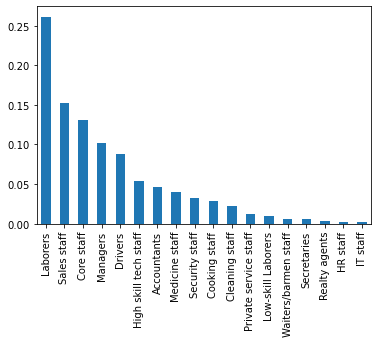

Missing values in OCCUPATION_TYPE: 0


In [55]:
# Imputing the missing values for OCCUPATION_TYPE which is a categorical column
# Check the minimum, maximum, 25%, 50%, 75%
print(appln_data.OCCUPATION_TYPE.describe())
# Based on the output, we conclude that it is categorical column so that we can calculate mode of OCCUPATION_TYPE
OCCUPATION_TYPE_Mode = appln_data.OCCUPATION_TYPE.mode()[0]
#Plot the Bar for OCCUPATION_TYPE to check which type is having high percentage  
appln_data.OCCUPATION_TYPE.value_counts(normalize=True).plot.bar()
plt.show()
#Imputing the missing values with Mode
appln_data.OCCUPATION_TYPE.fillna(OCCUPATION_TYPE_Mode, inplace=True)
# After imputing the missing values with mode, check the missing values of OCCUPATION_TYPE in Application_Data DataSet
print('Missing values in OCCUPATION_TYPE:',appln_data.OCCUPATION_TYPE.isnull().sum())

#### From the above Bar Graph, few values are similar so to get clarity now I will use countplot to get better insights

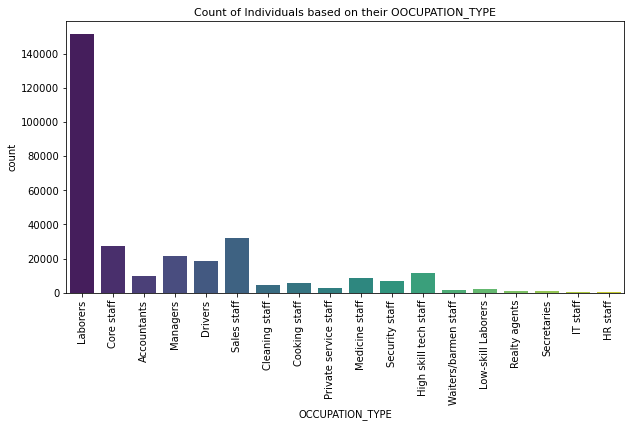

In [57]:
plt.figure(figsize=(10,5))
sns.countplot(data=appln_data, x = 'OCCUPATION_TYPE', palette='viridis',)
plt.title("Count of Individuals based on their OOCUPATION_TYPE",size=11)
plt.xticks(rotation = 90);

#### From the above countplot, we observe that  
- Majority of the individuals applying for loans are labourers, Sales Staff, Core Staff, Managers and Drivers
- HR Staff, IT Staff, Realty agents, Secretaies and Waiters/Barmen Staff have least interest in taking loans

#### Get the average income of the Occupation_Type using pivot Table

In [61]:
avg_income= pd.pivot_table(data=appln_data, index='OCCUPATION_TYPE', aggfunc='mean')['AMT_INCOME_TOTAL']
round(avg_income,2).sort_values(ascending=False)

OCCUPATION_TYPE
Managers                 260336.68
IT staff                 213465.60
Realty agents            195003.99
Accountants              194578.36
HR staff                 188916.28
Drivers                  187011.61
High skill tech staff    182842.05
Private service staff    182334.81
Core staff               172656.70
Secretaries              160541.66
Laborers                 158191.33
Sales staff              152302.87
Medicine staff           149709.64
Security staff           149662.70
Waiters/barmen staff     144272.58
Cooking staff            138396.51
Low-skill Laborers       133228.00
Cleaning staff           130790.90
Name: AMT_INCOME_TOTAL, dtype: float64

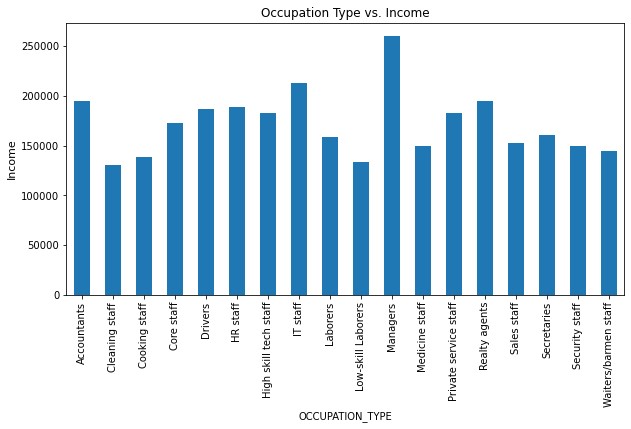

In [72]:
plt.figure(figsize=(10,5))
avg_income.plot.bar(title='Occupation Type vs. Income')
plt.ylabel('Income',size=11)
plt.show()

#### Based on the above output, 
- we can say that Managers, IT staff, Realty agents, Accountants and HR staff are having Highest Average Income
- Cleaning Staff, Low-skill laborers and cooling staff are having Least Average Income

In [81]:
appln_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 81 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  object 
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307511 non-null  float64
 10  AMT_GOODS_PRICE               307511 non-null  float64
 11  NAME_TYPE_SUITE               307511 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nul

#### Now check for the outliers in any of the five columns and explain your approach 
I prefer to test the below columns
- AMT_INCOME_TOTAL
- AMT_ANNUITY
- AMT_CREDIT
- AMT_GOODS_PRICE
- CNT_CHILDREN
- CNT_FAM_MEMBERS

count    307511.000000
mean          2.152664
std           0.910679
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64


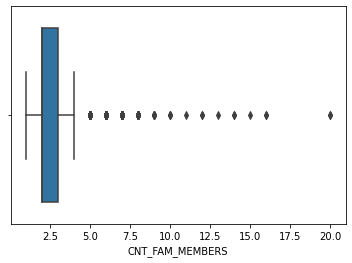

Values greater than 4.5 are considered to be outliers,since count of family members cannot be in decimals we can conclude that count greater than 5 can be an outlier


In [96]:
#Using describe, check the min, max, 25%, 50%, 75% 
print(appln_data.CNT_FAM_MEMBERS.describe())
# Check the outliers for CNT_FAM_MEMBERS Column by using Boxplot
sns.boxplot(appln_data.CNT_FAM_MEMBERS)
plt.show()
Q1_CNT_FAM_MEMBERS= appln_data.CNT_FAM_MEMBERS.quantile(0.25)
Q3_CNT_FAM_MEMBERS= appln_data.CNT_FAM_MEMBERS.quantile(0.75)
IQR_CNT_FAM_MEMBERS= Q3_CNT_FAM_MEMBERS - Q1_CNT_FAM_MEMBERS
# As per the statistics, we consider the values above the upper whisker and the values below the lower whisker are outliers. From the boxplot, we are seeing the values above the upper whisker and considered as outliers
LowerWhisker_CNT_FAM_MEMBERS = Q1_CNT_FAM_MEMBERS-1.5*IQR_CNT_FAM_MEMBERS
UpperWhisker_CNT_FAM_MEMBERS = Q3_CNT_FAM_MEMBERS+1.5*IQR_CNT_FAM_MEMBERS
# As per the boxplot, I see that the values are above the upper whisker and those are considered as outliers
print(f"From the boxplot, Values greater than {UpperWhisker_CNT_FAM_MEMBERS} are considered to be outliers,since count of family members cannot be in decimals we can conclude that count greater than 5 can be an outlier")

#### We can either delete the outliers or impute the values by using capping/flooring method

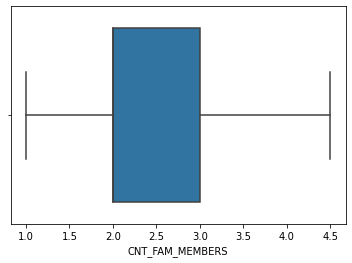

In [98]:
# From the above boxplt for CNT_FAM_MEMBERS, outliers are above Upper whisker, so use Capping method to treat outliers
appln_data.CNT_FAM_MEMBERS = appln_data.CNT_FAM_MEMBERS.apply(lambda x: UpperWhisker_CNT_FAM_MEMBERS if x> UpperWhisker_CNT_FAM_MEMBERS else x )
#plot the boxplot after applying the capping method
sns.boxplot(appln_data.CNT_FAM_MEMBERS)
plt.show()

count    3.075110e+05
mean     5.990260e+05
std      4.024908e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.135310e+05
75%      8.086500e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64


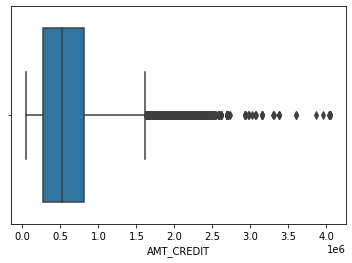

Values greater than 1616625.0 are considered to be outliers


In [101]:
#Using describe, check the min, max, 25%, 50%, 75% 
print(appln_data.AMT_CREDIT.describe())
# Check the outliers for AMT_CREDIT Column by using Boxplot
sns.boxplot(appln_data.AMT_CREDIT)
plt.show()
Q1_AMT_CREDIT= appln_data.AMT_CREDIT.quantile(0.25)
Q3_AMT_CREDIT= appln_data.AMT_CREDIT.quantile(0.75)
IQR_AMT_CREDIT= Q3_AMT_CREDIT - Q1_AMT_CREDIT
# As per the statistics, we consider the values above the upper whisker and the values below the lower whisker are outliers. From the boxplot, we are seeing the values above the upper whisker and considered as outliers
LowerWhisker_AMT_CREDIT = Q1_AMT_CREDIT-1.5*IQR_AMT_CREDIT
UpperWhisker_AMT_CREDIT = Q3_AMT_CREDIT+1.5*IQR_AMT_CREDIT
# As per the boxplot, I see that the values are above the upper whisker and those are considered as outliers
print(f"From the boxplot, Values greater than {UpperWhisker_AMT_CREDIT} are considered to be outliers")

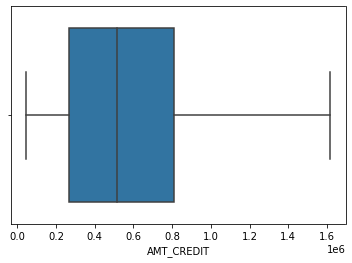

In [102]:
# From the above boxplt for AMT_CREDIT, outliers are above Upper whisker, so use Capping method to treat outliers
appln_data.AMT_CREDIT = appln_data.AMT_CREDIT.apply(lambda x: UpperWhisker_AMT_CREDIT if x> UpperWhisker_AMT_CREDIT else x )
#plot the boxplot after applying the capping method
sns.boxplot(appln_data.AMT_CREDIT)
plt.show()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64


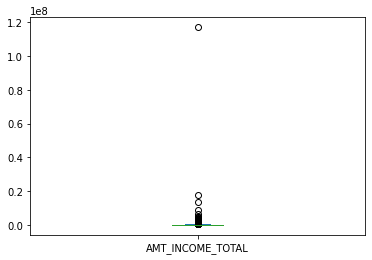

Values greater than 337500.0 are considered to be outliers


In [104]:
#Using describe, check the min, max, 25%, 50%, 75% 
print(appln_data.AMT_INCOME_TOTAL.describe())
# Check the outliers for AMT_INCOME_TOTAL Column by using Boxplot
appln_data.AMT_INCOME_TOTAL.plot.box()
plt.show()
Q1_AMT_INCOME_TOTAL= appln_data.AMT_INCOME_TOTAL.quantile(0.25)
Q3_AMT_INCOME_TOTAL= appln_data.AMT_INCOME_TOTAL.quantile(0.75)
IQR_AMT_INCOME_TOTAL= Q3_AMT_INCOME_TOTAL - Q1_AMT_INCOME_TOTAL
# As per the statistics, we consider the values above the upper whisker and the values below the lower whisker are outliers. From the boxplot, we are seeing the values above the upper whisker and considered as outliers
LowerWhisker_AMT_INCOME_TOTAL = Q1_AMT_INCOME_TOTAL-1.5*IQR_AMT_INCOME_TOTAL
UpperWhisker_AMT_INCOME_TOTAL = Q3_AMT_INCOME_TOTAL+1.5*IQR_AMT_INCOME_TOTAL
# As per the boxplot, I see that the values are above the upper whisker and those are considered as outliers
print(f"From the boxplot, Values greater than {UpperWhisker_AMT_INCOME_TOTAL} are considered to be outliers")

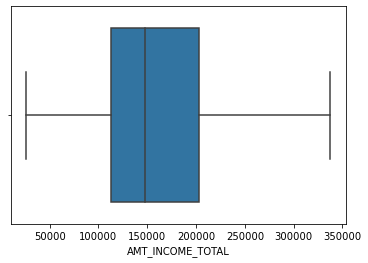

In [105]:
# From the above boxplt for AMT_INCOME_TOTAL, outliers are above Upper whisker, so use Capping method to treat outliers
appln_data.AMT_INCOME_TOTAL = appln_data.AMT_INCOME_TOTAL.apply(lambda x: UpperWhisker_AMT_INCOME_TOTAL if x> UpperWhisker_AMT_INCOME_TOTAL else x )
#plot the boxplot after applying the capping method
sns.boxplot(appln_data.AMT_INCOME_TOTAL)
plt.show()

count    307511.000000
mean      27108.487841
std       14493.461065
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64


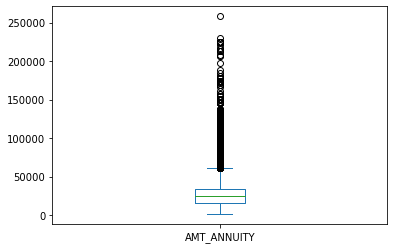

Values greater than 61704.0 are considered to be outliers


In [106]:
#Using describe, check the min, max, 25%, 50%, 75% 
print(appln_data.AMT_ANNUITY.describe())
# Check the outliers for AMT_ANNUITY Column by using Boxplot
appln_data.AMT_ANNUITY.plot.box()
plt.show()
Q1_AMT_ANNUITY= appln_data.AMT_ANNUITY.quantile(0.25)
Q3_AMT_ANNUITY= appln_data.AMT_ANNUITY.quantile(0.75)
IQR_AMT_ANNUITY= Q3_AMT_ANNUITY - Q1_AMT_ANNUITY
# As per the statistics, we consider the values above the upper whisker and the values below the lower whisker are outliers. From the boxplot, we are seeing the values above the upper whisker and considered as outliers
LowerWhisker_AMT_ANNUITY = Q1_AMT_ANNUITY-1.5*IQR_AMT_ANNUITY
UpperWhisker_AMT_ANNUITY = Q3_AMT_ANNUITY+1.5*IQR_AMT_ANNUITY
# As per the boxplot, I see that the values are above the upper whisker and those are considered as outliers
print(f"From the boxplot, Values greater than {UpperWhisker_AMT_ANNUITY} are considered to be outliers")

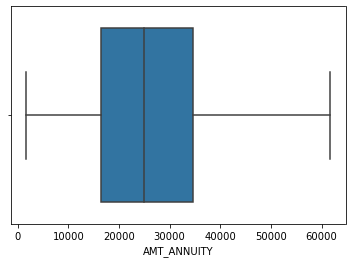

In [107]:
# From the above boxplt for AMT_ANNUITY, outliers are above Upper whisker, so use Capping method to treat outliers
appln_data.AMT_ANNUITY = appln_data.AMT_ANNUITY.apply(lambda x: UpperWhisker_AMT_ANNUITY if x> UpperWhisker_AMT_ANNUITY else x )
#plot the boxplot after applying the capping method
sns.boxplot(appln_data.AMT_ANNUITY)
plt.show()

count    3.075110e+05
mean     5.383163e+05
std      3.692890e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64


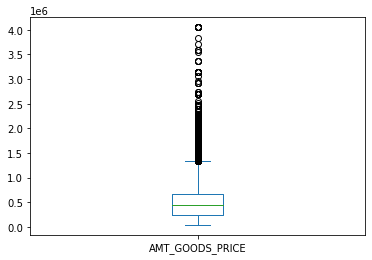

Values greater than 1341000.0 are considered to be outliers


In [108]:
#Using describe, check the min, max, 25%, 50%, 75% 
print(appln_data.AMT_GOODS_PRICE.describe())
# Check the outliers for AMT_GOODS_PRICE Column by using Boxplot
appln_data.AMT_GOODS_PRICE.plot.box()
plt.show()
Q1_AMT_GOODS_PRICE= appln_data.AMT_GOODS_PRICE.quantile(0.25)
Q3_AMT_GOODS_PRICE= appln_data.AMT_GOODS_PRICE.quantile(0.75)
IQR_AMT_GOODS_PRICE= Q3_AMT_GOODS_PRICE - Q1_AMT_GOODS_PRICE
# As per the statistics, we consider the values above the upper whisker and the values below the lower whisker are outliers. From the boxplot, we are seeing the values above the upper whisker and considered as outliers
LowerWhisker_AMT_GOODS_PRICE = Q1_AMT_GOODS_PRICE-1.5*IQR_AMT_GOODS_PRICE
UpperWhisker_AMT_GOODS_PRICE = Q3_AMT_GOODS_PRICE+1.5*IQR_AMT_GOODS_PRICE
# As per the boxplot, I see that the values are above the upper whisker and those are considered as outliers
print(f"From the boxplot, Values greater than {UpperWhisker_AMT_GOODS_PRICE} are considered to be outliers")

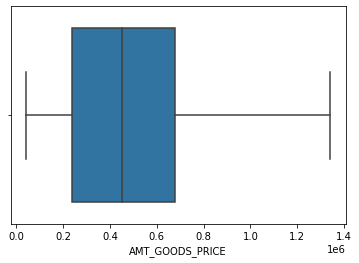

In [109]:
# From the above boxplt for AMT_GOODS_PRICE, outliers are above Upper whisker, so use Capping method to treat outliers
appln_data.AMT_GOODS_PRICE = appln_data.AMT_GOODS_PRICE.apply(lambda x: UpperWhisker_AMT_GOODS_PRICE if x> UpperWhisker_AMT_GOODS_PRICE else x )
#plot the boxplot after applying the capping method
sns.boxplot(appln_data.AMT_GOODS_PRICE)
plt.show()

count    307511.000000
mean          0.417052
std           0.722121
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64


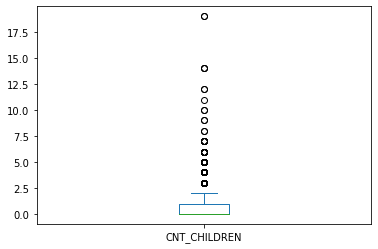

From the boxplot, Values greater than 2.5 are considered to be outliers. Since count of children cannot be in decimals we can conclude that count greater than 3 can be an outlier


In [112]:
#Using describe, check the min, max, 25%, 50%, 75% 
print(appln_data.CNT_CHILDREN.describe())
# Check the outliers for CNT_CHILDREN Column by using Boxplot
appln_data.CNT_CHILDREN.plot.box()
plt.show()
Q1_CNT_CHILDREN= appln_data.CNT_CHILDREN.quantile(0.25)
Q3_CNT_CHILDREN= appln_data.CNT_CHILDREN.quantile(0.75)
IQR_CNT_CHILDREN= Q3_CNT_CHILDREN - Q1_CNT_CHILDREN
# As per the statistics, we consider the values above the upper whisker and the values below the lower whisker are outliers. From the boxplot, we are seeing the values above the upper whisker and considered as outliers
LowerWhisker_CNT_CHILDREN = Q1_CNT_CHILDREN-1.5*IQR_CNT_CHILDREN
UpperWhisker_CNT_CHILDREN = Q3_CNT_CHILDREN+1.5*IQR_CNT_CHILDREN
# As per the boxplot, I see that the values are above the upper whisker and those are considered as outliers
print(f"From the boxplot, Values greater than {UpperWhisker_CNT_CHILDREN} are considered to be outliers. Since count of children cannot be in decimals we can conclude that count greater than 3 can be an outlier")

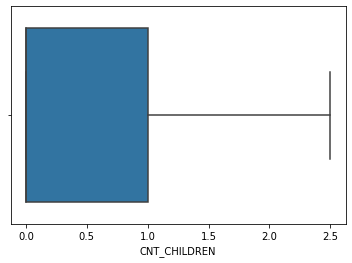

In [113]:
# From the above boxplt for CNT_CHILDREN, outliers are above Upper whisker, so use Capping method to treat outliers
appln_data.CNT_CHILDREN = appln_data.CNT_CHILDREN.apply(lambda x: UpperWhisker_CNT_CHILDREN if x> UpperWhisker_CNT_CHILDREN else x )
#plot the boxplot after applying the capping method
sns.boxplot(appln_data.CNT_CHILDREN)
plt.show()

#### Now check whether we can apply any Binning method
- AMT_CREDIT
- AMT_INCOME_TOTAL

Low         64085
High        63033
Very Low    63024
Medium      61824
Name: AMT_CREDIT_Binning, dtype: int64


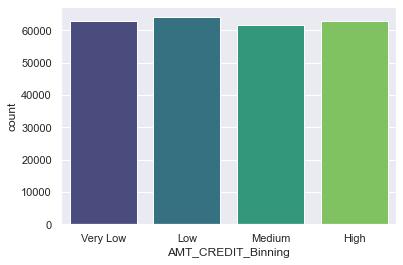

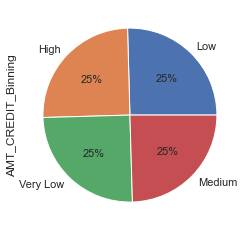

In [272]:
# Apply Binning method on AMT_CREDIT
Minimum_AMT_CREDIT = appln_data.AMT_CREDIT.min()
Q1_AMT_CREDIT = appln_data.AMT_CREDIT.quantile(0.25)
Q2_AMT_CREDIT = appln_data.AMT_CREDIT.quantile(0.50)
Q3_AMT_CREDIT = appln_data.AMT_CREDIT.quantile(0.75)
Maximum_AMT_CREDIT = appln_data.AMT_CREDIT.max()
# Binning AMT_CREDIT into AMT_CREDIT_Binning so that we don't loose data and have binned values
appln_data['AMT_CREDIT_Binning'] = pd.cut(appln_data['AMT_CREDIT'],[Minimum_AMT_CREDIT, Q1_AMT_CREDIT, Q2_AMT_CREDIT,Q3_AMT_CREDIT, Maximum_AMT_CREDIT], labels = ['Very Low', 'Low', 'Medium', 'High'])
print(appln_data.AMT_CREDIT_Binning.value_counts())
# Now check the AMT_CREDIT Values using visualisation
sns.countplot(data=appln_data, x= 'AMT_CREDIT_Binning', palette='viridis')
plt.show()
# From the countplot, we are little confused and I am using Pie Plot
appln_data.AMT_CREDIT_Binning.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

125000-150000       47890
100000-125000       43701
200000-225000       40797
75000,100000        39806
150000-175000       34663
175000-200000       29644
50000-75000         19375
250000-275000       12733
225000-250000        7340
300000-325000        6752
350000-375000        4537
25000-50000          4517
275000-300000        4306
425000-450000        3113
500000 and above     2702
325000-350000        2122
400000-425000        1811
375000-400000        1265
475000-500000         312
450000-475000         125
0-25000                 0
Name: AMT_INCOME_TOTAL_Binning, dtype: int64


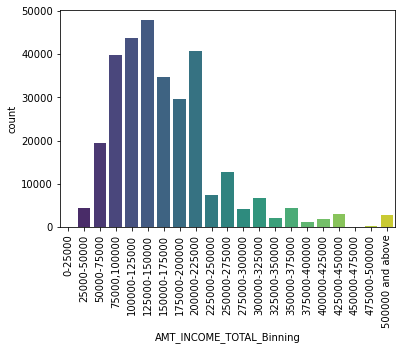

In [15]:
# Apply Binning method on AMT_INCOME_TOTAL
Minimum_AMT_INCOME_TOTAL = appln_data.AMT_INCOME_TOTAL.min()
Q1_AMT_INCOME_TOTAL = appln_data.AMT_INCOME_TOTAL.quantile(0.25)
Q2_AMT_INCOME_TOTAL = appln_data.AMT_INCOME_TOTAL.quantile(0.50)
Q3_AMT_INCOME_TOTAL = appln_data.AMT_INCOME_TOTAL.quantile(0.75)
Maximum_AMT_CREDIT = appln_data.AMT_INCOME_TOTAL.max()
# Binning AMT_INCOME_TOTAL into AMT_INCOME_TOTAL_Binning so that we don't loose data and have binned values
appln_data['AMT_INCOME_TOTAL_Binning'] = pd.cut(appln_data['AMT_INCOME_TOTAL'],[0,25000,50000,75000,100000,125000,150000,175000,200000,225000,250000,275000,300000,325000,350000,375000,400000,425000,450000,475000,500000,10000000000], labels = ['0-25000', '25000-50000','50000-75000','75000,100000','100000-125000', '125000-150000', '150000-175000','175000-200000','200000-225000','225000-250000','250000-275000','275000-300000','300000-325000','325000-350000','350000-375000','375000-400000','400000-425000','425000-450000','450000-475000','475000-500000','500000 and above'])
print(appln_data.AMT_INCOME_TOTAL_Binning.value_counts())
# Now check the AMT_INCOME_TOTAL Values using visualisation
sns.countplot(data=appln_data, x= 'AMT_INCOME_TOTAL_Binning', palette='viridis')
plt.xticks(rotation=90)
plt.show()

#### From the above count plot, we can conclude that
- Income range from 125000-150000, 100000-125000, 200000-225000, 75000-100000 has high chances of applying for loan

#### Check the CODE_GENDER 

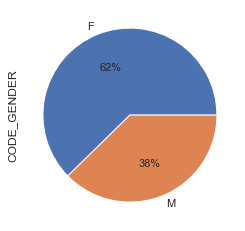

F    62.339522
M    37.660478
Name: CODE_GENDER, dtype: float64

In [273]:
# Check the Not Availble values(XNA) in CODE_GENDER and impute/drop the columns based on the percentage
appln_data.CODE_GENDER.value_counts().plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()
# We see that Female are having higher percentage so we can impute XNA Values with Female as it does not affect the overall dataset
appln_data.loc[appln_data['CODE_GENDER']=='XNA','CODE_GENDER']='F'
appln_data['CODE_GENDER'].value_counts(normalize=True)*100

- From the above Bar Graph and the percentage of values in CODE_GENDER, 62% females are taking loans whereas 37% Males are taking the loans.

#### Check the ORGANIZATION_TYPE

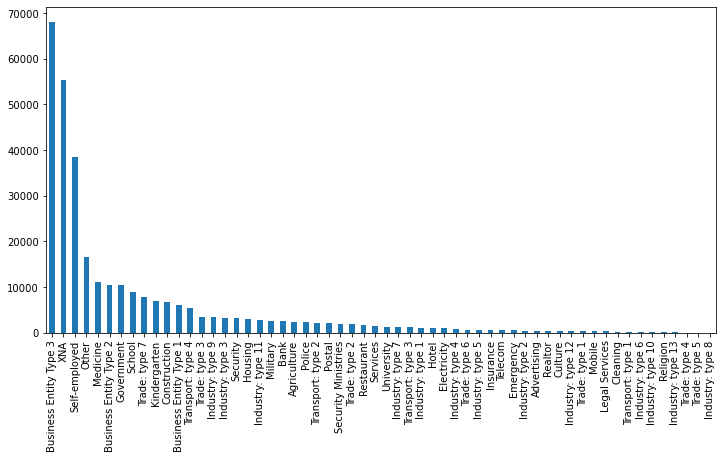

XNA Not Available Values(XNA): 0.18007160719453938


In [31]:
plt.figure(figsize=(12,6))
appln_data.ORGANIZATION_TYPE.value_counts().plot.bar()
plt.show()
print('XNA Not Available Values(XNA):',appln_data.ORGANIZATION_TYPE.value_counts(normalize=True)['XNA'])

#### From the above Bar graph and XNA Values percentage, we can conclude that
- XNA Value percentage is around 18% so we can drop the rows which are having the XNA Values

In [37]:
# Dropping the 55374 rows which are having the XNA Values 
appln_data=appln_data.drop(appln_data.loc[appln_data['ORGANIZATION_TYPE']=='XNA'].index)
appln_data.ORGANIZATION_TYPE.value_counts()

Business Entity Type 3    67992
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transport: type 3          1187
Industry

#### Check the NAME_CONTRACT_TYPE

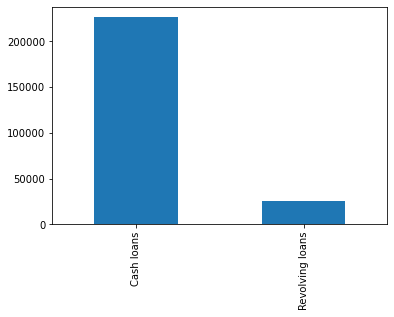

In [39]:
#Plot the bar graph to check which is having more values
appln_data.NAME_CONTRACT_TYPE.value_counts().plot.bar()
plt.show()

- From the Bar Graph for NAME_CONTRACT_TYPE, we can conclude that people are more likely to take cash loans rather than revolving loans

#### check the NAME_EDUCATION_TYPE

Secondary / secondary special    173286
Higher education                  66669
Incomplete higher                  9757
Lower secondary                    2287
Academic degree                     138
Name: NAME_EDUCATION_TYPE, dtype: int64


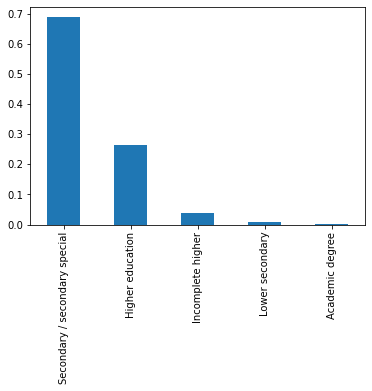

In [43]:
print(appln_data.NAME_EDUCATION_TYPE.value_counts())
# check the percentage of values in NAME_EDUCATION_TYPE and plot it using bar plot
appln_data.NAME_EDUCATION_TYPE.value_counts(normalize=True).plot.bar()
plt.show()

- From the above Bar Graph, we can conclude that Secondary/secondary special are likely to take loans from Bank

#### Checking the Imbalance Percentage by analysing the target variable

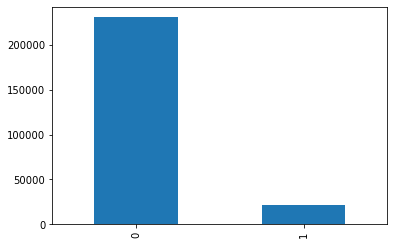

0    91.340025
1     8.659975
Name: TARGET, dtype: float64


In [47]:
#Plot the Bar Graph and check which value is having highest percentage
appln_data.TARGET.value_counts().plot.bar()
plt.show()
print(100*appln_data.TARGET.value_counts(normalize=True))

- From the above Bar Graph, we can conclude that 90% of the individuals have paid their loan successfully and 8% of individuals are facing the difficulties while paying the loan 
- Also we can clearly say that this is imbalanced dataset
- We need to analyse the dataset further by spltting the dataset in to two parts based on 0 and 1.

#### Divide the Application_Data DataSet into two DataSets based on Target values 0 and 1 

In [48]:
# appln_data_t0 consists of values where target=0
appln_data_t0 = appln_data[appln_data['TARGET']==0]
# appln_data_t1 consists of values where target=1
appln_data_t1 = appln_data[appln_data['TARGET']==1]

#### Now extract the categorical columns to perform univariate analysis on them by using Target=0 and Target=1

In [49]:
categorical_cols=list(set(appln_data.columns)-set(appln_data.describe()))
categorical_cols

['FLAG_OWN_REALTY',
 'NAME_FAMILY_STATUS',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'NAME_EDUCATION_TYPE',
 'EMERGENCYSTATE_MODE',
 'NAME_HOUSING_TYPE',
 'AMT_INCOME_TOTAL_Binning',
 'OCCUPATION_TYPE',
 'NAME_TYPE_SUITE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'AMT_CREDIT_Binning',
 'NAME_INCOME_TYPE',
 'FLAG_OWN_CAR']

#### Compare the target variable across the categorical columns against Target values 0 (Client with no payment dfficulties) and 1 (all others)

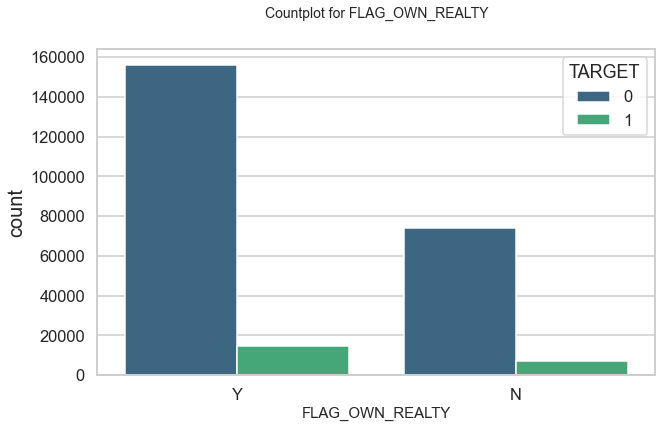

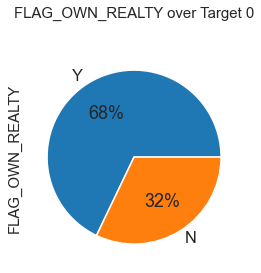

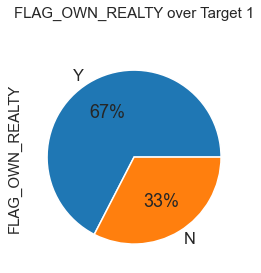

In [152]:
# Apply countplot, pie chart for FLAG_OWN_REALTY
plt.figure(figsize=(10,6))
plt.xlabel('FLAG_OWN_REALTY',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=appln_data, x= 'FLAG_OWN_REALTY',hue='TARGET', palette='viridis')
plt.title('Countplot for FLAG_OWN_REALTY', fontsize=14)
plt.show()

plt.ylabel('FLAG_OWN_REALTY',fontsize=15)
plt.title('FLAG_OWN_REALTY over Target 0', fontsize=15)
appln_data_t0.FLAG_OWN_REALTY.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%")
plt.show()

plt.ylabel('FLAG_OWN_REALTY',fontsize=15)
plt.title('FLAG_OWN_REALTY over Target 1', fontsize=15)
appln_data_t1.FLAG_OWN_REALTY.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%")
plt.show()

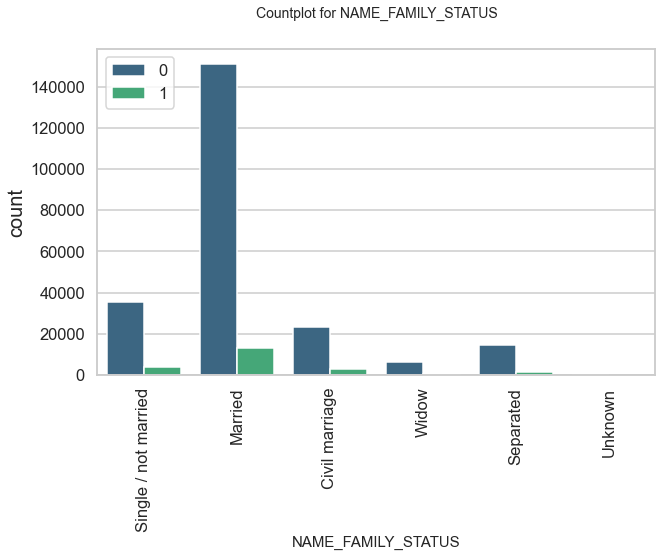

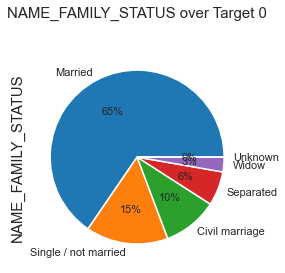

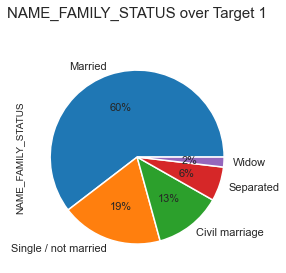

In [153]:
# Apply countplot, pie chart for NAME_FAMILY_STATUS
plt.figure(figsize=(10,6))
plt.xlabel('NAME_FAMILY_STATUS',fontsize=15)
plt.xticks(rotation=90)
plt.ylabel('count',fontsize=20)
sns.countplot(data=appln_data, x= 'NAME_FAMILY_STATUS', hue='TARGET', palette='viridis')
plt.title('Countplot for NAME_FAMILY_STATUS', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('NAME_FAMILY_STATUS',fontsize=15)
plt.title('NAME_FAMILY_STATUS over Target 0', fontsize=15)
appln_data_t0.NAME_FAMILY_STATUS.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('NAME_FAMILY_STATUS',fontsize=10)
plt.title('NAME_FAMILY_STATUS over Target 1', fontsize=15)
appln_data_t1.NAME_FAMILY_STATUS.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

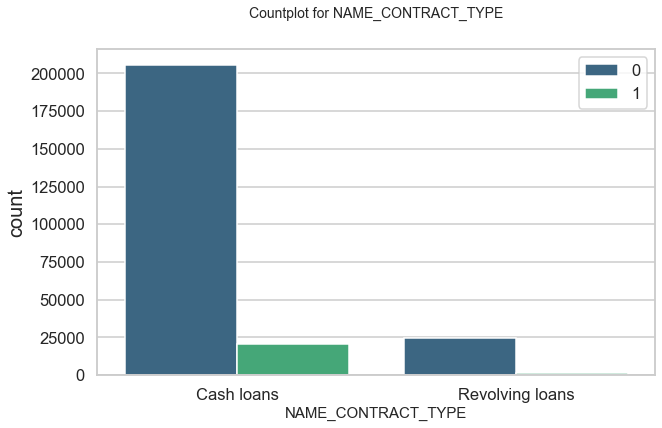

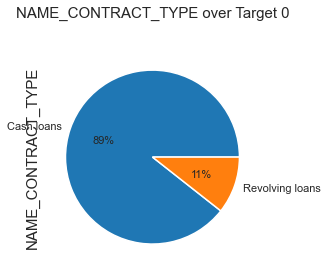

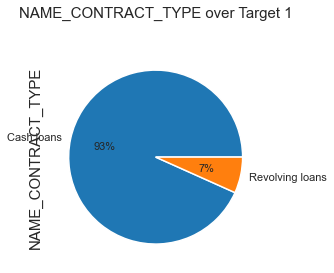

In [154]:
# Apply countplot, pie chart for NAME_CONTRACT_TYPE
plt.figure(figsize=(10,6))
plt.xlabel('NAME_CONTRACT_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=appln_data, x= 'NAME_CONTRACT_TYPE', hue='TARGET', palette='viridis')
plt.title('Countplot for NAME_CONTRACT_TYPE', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('NAME_CONTRACT_TYPE',fontsize=15)
plt.title('NAME_CONTRACT_TYPE over Target 0', fontsize=15)
appln_data_t0.NAME_CONTRACT_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('NAME_CONTRACT_TYPE',fontsize=15)
plt.title('NAME_CONTRACT_TYPE over Target 1', fontsize=15)
appln_data_t1.NAME_CONTRACT_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

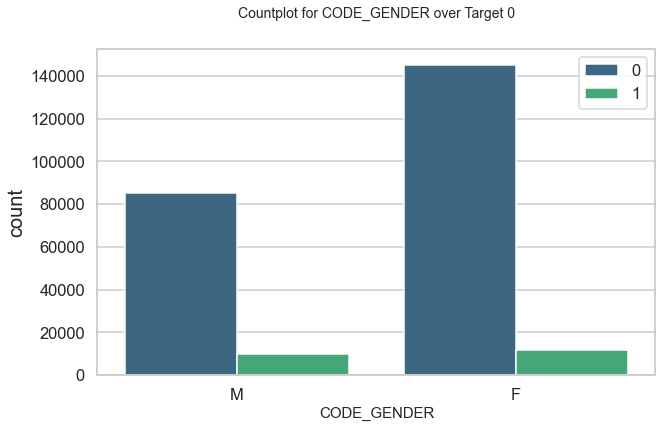

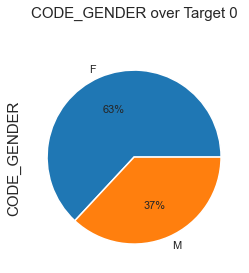

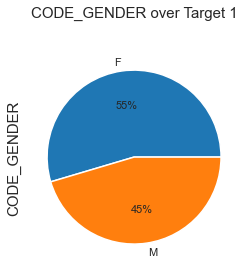

In [138]:
# Apply countplot, pie chart for CODE_GENDER
plt.figure(figsize=(10,6))
plt.xlabel('CODE_GENDER',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=appln_data, x= 'CODE_GENDER', hue='TARGET', palette='viridis')
plt.title('Countplot for CODE_GENDER over Target 0', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('CODE_GENDER',fontsize=15)
plt.title('CODE_GENDER over Target 0', fontsize=15)
appln_data_t0.CODE_GENDER.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('CODE_GENDER',fontsize=15)
plt.title('CODE_GENDER over Target 1', fontsize=15)
appln_data_t1.CODE_GENDER.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

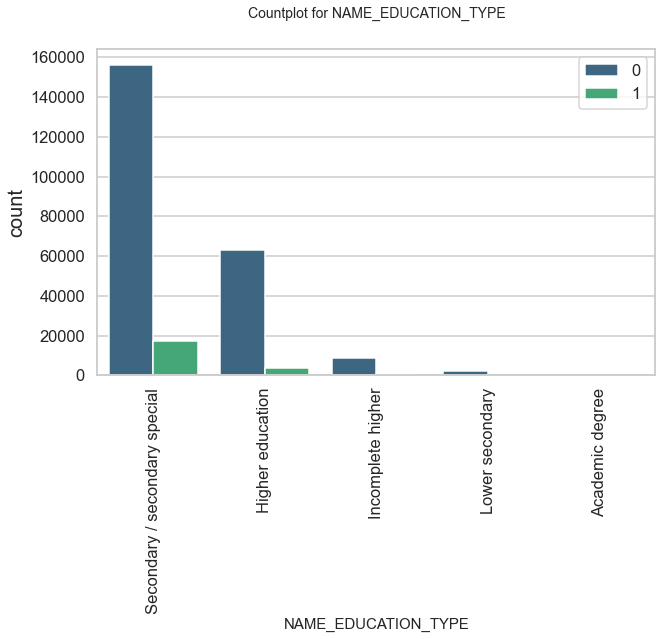

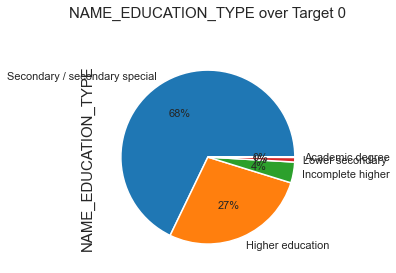

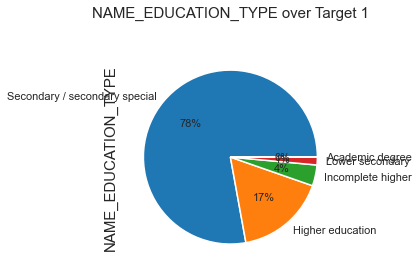

In [155]:
# Apply countplot, pie chart for NAME_EDUCATION_TYPE
plt.figure(figsize=(10,6))
plt.xlabel('NAME_EDUCATION_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'NAME_EDUCATION_TYPE', hue='TARGET', palette='viridis')
plt.title('Countplot for NAME_EDUCATION_TYPE', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('NAME_EDUCATION_TYPE',fontsize=15)
plt.title('NAME_EDUCATION_TYPE over Target 0', fontsize=15)
appln_data_t0.NAME_EDUCATION_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('NAME_EDUCATION_TYPE',fontsize=15)
plt.title('NAME_EDUCATION_TYPE over Target 1', fontsize=15)
appln_data_t1.NAME_EDUCATION_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

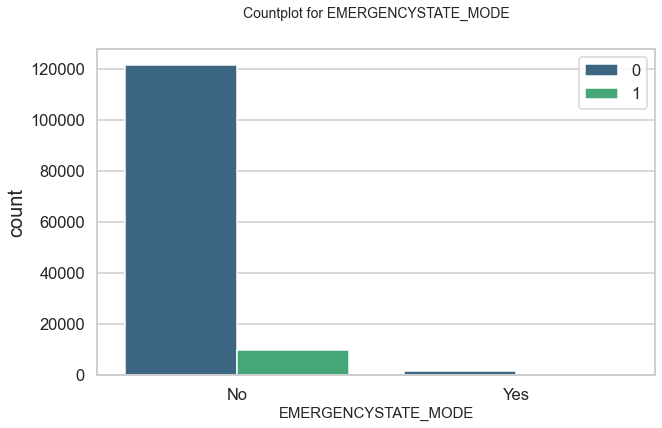

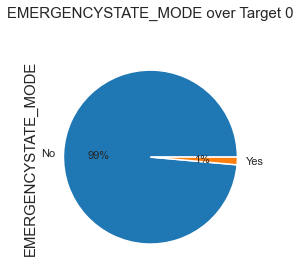

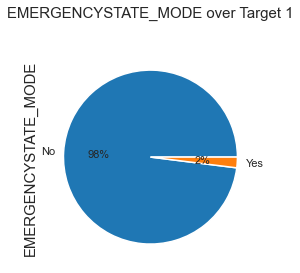

In [156]:
# Apply countplot, pie chart for EMERGENCYSTATE_MODE
plt.figure(figsize=(10,6))
plt.xlabel('EMERGENCYSTATE_MODE',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=appln_data, x= 'EMERGENCYSTATE_MODE', hue='TARGET', palette='viridis')
plt.title('Countplot for EMERGENCYSTATE_MODE', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('EMERGENCYSTATE_MODE',fontsize=15)
plt.title('EMERGENCYSTATE_MODE over Target 0', fontsize=15)
appln_data_t0.EMERGENCYSTATE_MODE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('EMERGENCYSTATE_MODE',fontsize=15)
plt.title('EMERGENCYSTATE_MODE over Target 1', fontsize=15)
appln_data_t1.EMERGENCYSTATE_MODE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

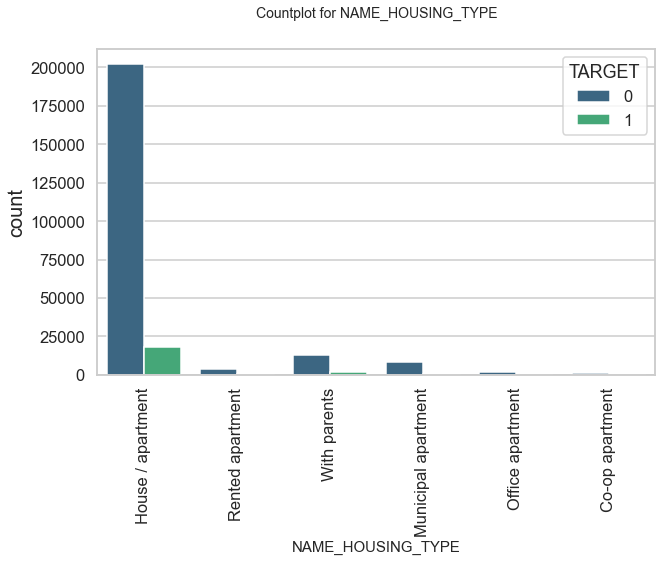

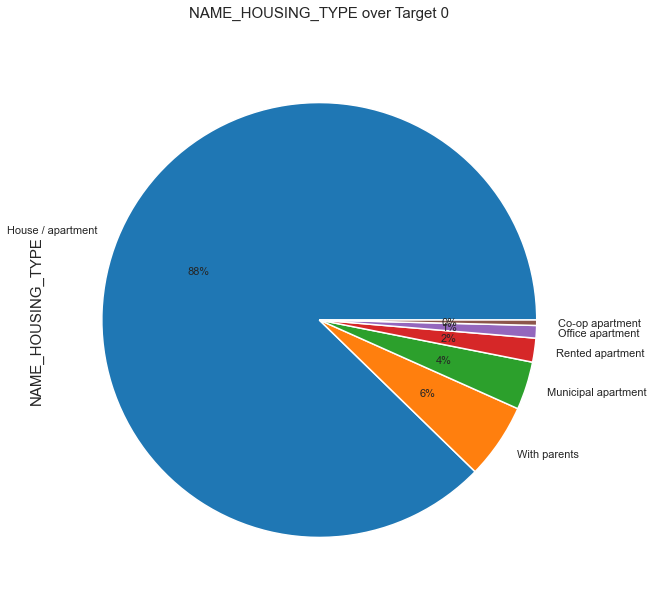

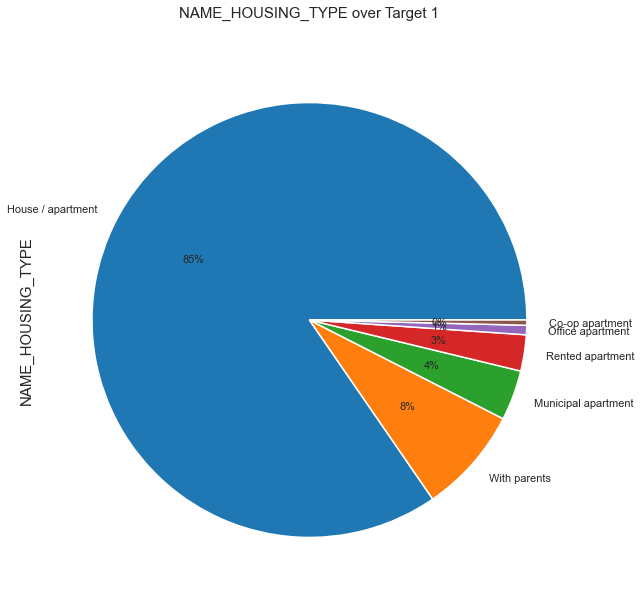

In [157]:
# Apply countplot, pie chart for NAME_HOUSING_TYPE
plt.figure(figsize=(10,6))
plt.xlabel('NAME_HOUSING_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'NAME_HOUSING_TYPE', hue='TARGET', palette='viridis')
plt.title('Countplot for NAME_HOUSING_TYPE', fontsize=14)
plt.show()

plt.figure(figsize=(10,10))
plt.ylabel('NAME_HOUSING_TYPE',fontsize=15)
plt.title('NAME_HOUSING_TYPE over Target 0', fontsize=15)
appln_data_t0.NAME_HOUSING_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.figure(figsize=(10,10))
plt.ylabel('NAME_HOUSING_TYPE',fontsize=15)
plt.title('NAME_HOUSING_TYPE over Target 1', fontsize=15)
appln_data_t1.NAME_HOUSING_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

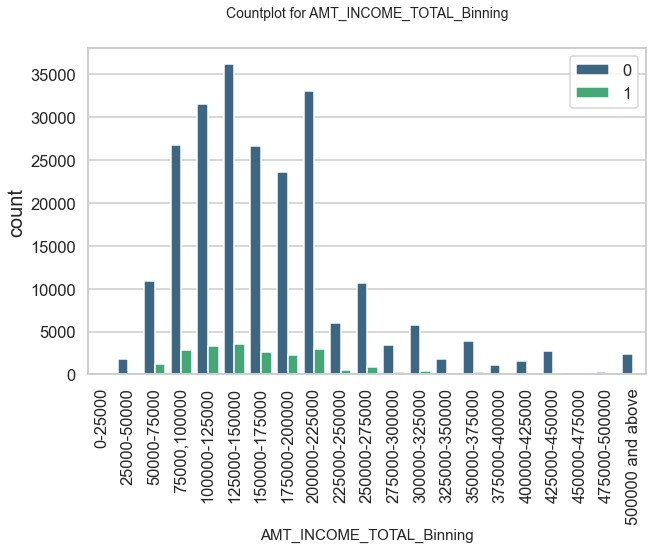

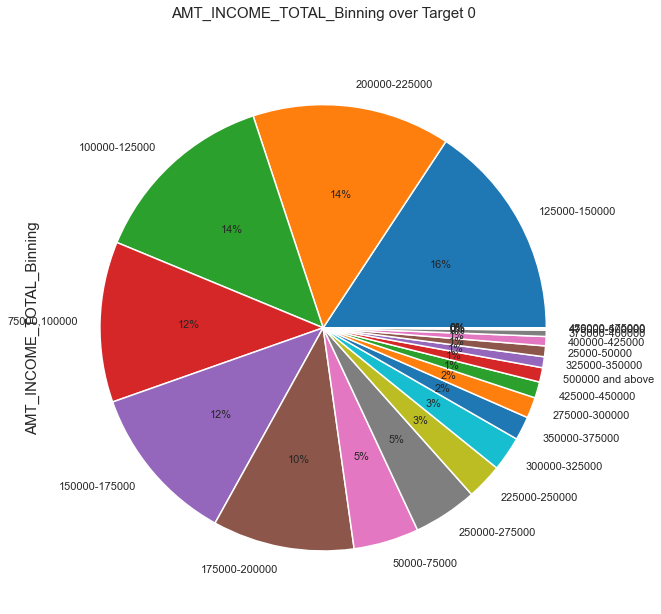

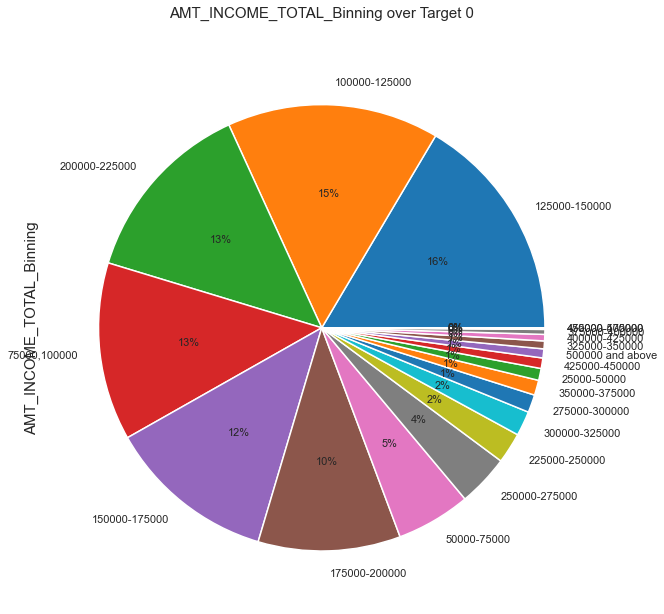

In [160]:
# Apply countplot, pie chart for AMT_INCOME_TOTAL_Binning
plt.figure(figsize=(10,6))
plt.xlabel('AMT_INCOME_TOTAL_Binning',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'AMT_INCOME_TOTAL_Binning', hue='TARGET', palette='viridis')
plt.title('Countplot for AMT_INCOME_TOTAL_Binning', fontsize=14)
plt.legend()
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('AMT_INCOME_TOTAL_Binning',fontsize=15)
plt.title('AMT_INCOME_TOTAL_Binning over Target 0', fontsize=15)
appln_data_t0.AMT_INCOME_TOTAL_Binning.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('AMT_INCOME_TOTAL_Binning',fontsize=15)
plt.title('AMT_INCOME_TOTAL_Binning over Target 0', fontsize=15)
appln_data_t1.AMT_INCOME_TOTAL_Binning.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

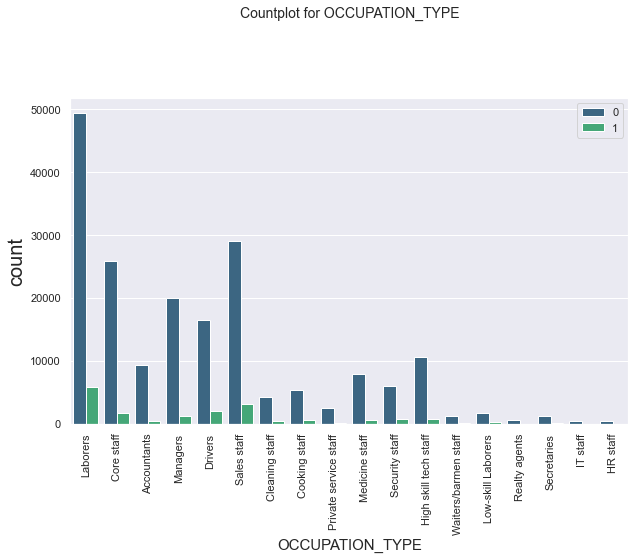

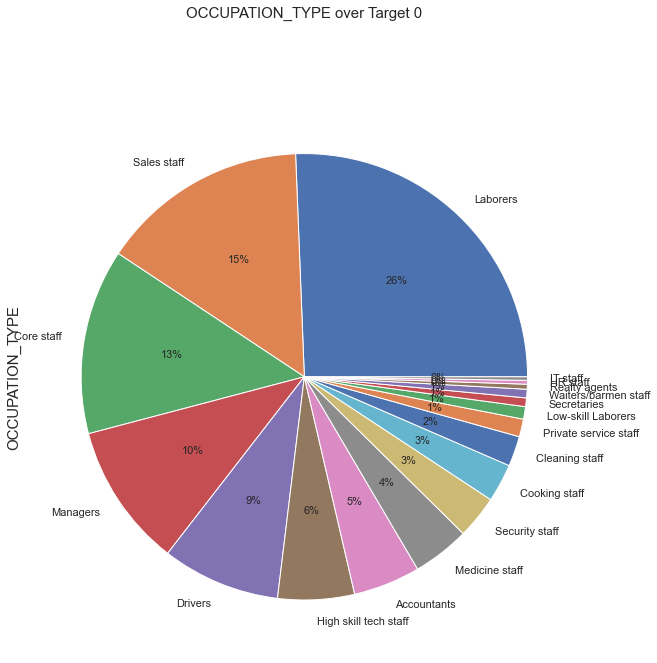

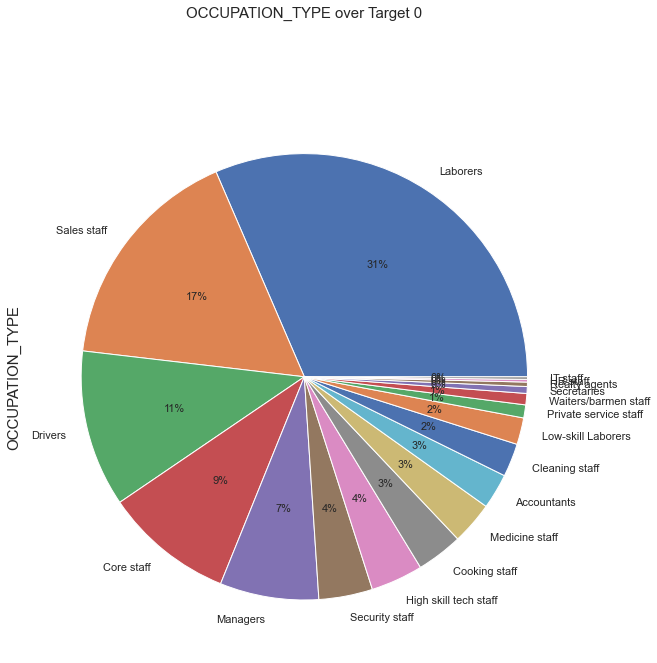

In [274]:
# Apply countplot, pie chart for OCCUPATION_TYPE
plt.figure(figsize=(10,6))
plt.xlabel('OCCUPATION_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'OCCUPATION_TYPE', hue='TARGET', palette='viridis')
plt.title('Countplot for OCCUPATION_TYPE', fontsize=14)
plt.legend()
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('OCCUPATION_TYPE',fontsize=15)
plt.title('OCCUPATION_TYPE over Target 0', fontsize=15)
appln_data_t0.OCCUPATION_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('OCCUPATION_TYPE',fontsize=15)
plt.title('OCCUPATION_TYPE over Target 0', fontsize=15)
appln_data_t1.OCCUPATION_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

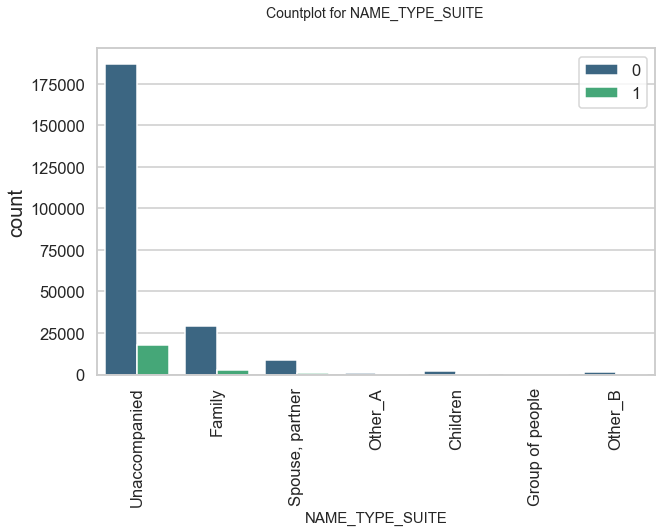

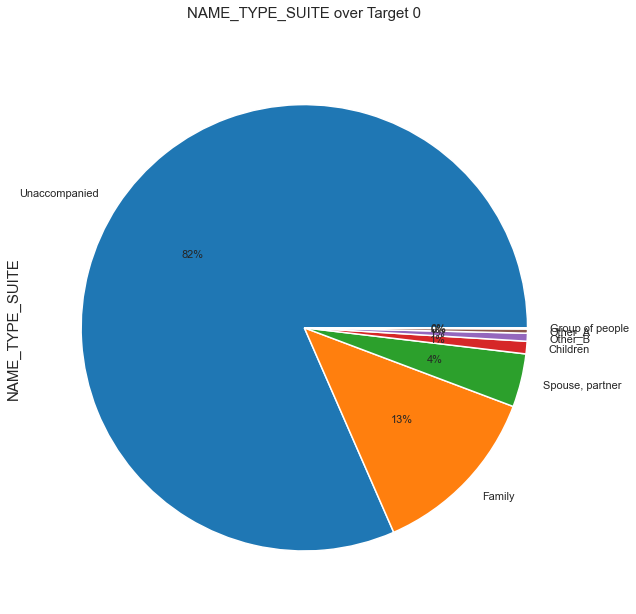

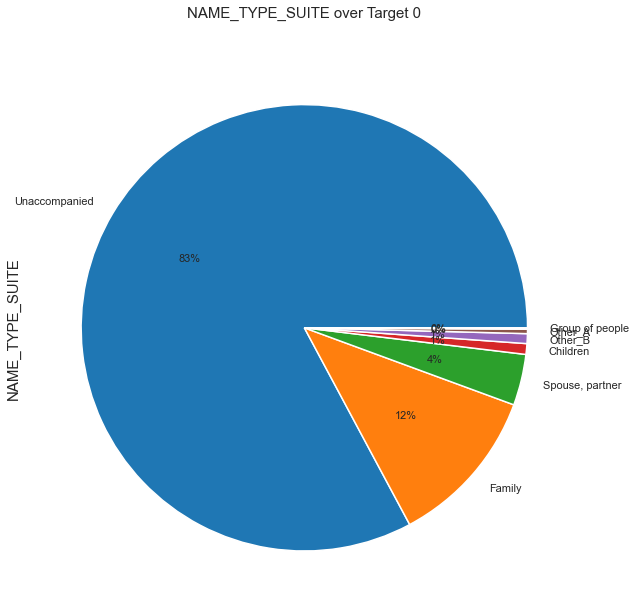

In [166]:
# Apply countplot, pie chart for NAME_TYPE_SUITE
plt.figure(figsize=(10,6))
plt.xlabel('NAME_TYPE_SUITE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'NAME_TYPE_SUITE', hue='TARGET', palette='viridis')
plt.title('Countplot for NAME_TYPE_SUITE ', fontsize=14)
plt.legend()
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('NAME_TYPE_SUITE',fontsize=15)
plt.title('NAME_TYPE_SUITE over Target 0', fontsize=15)
appln_data_t0.NAME_TYPE_SUITE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('NAME_TYPE_SUITE',fontsize=15)
plt.title('NAME_TYPE_SUITE over Target 0', fontsize=15)
appln_data_t1.NAME_TYPE_SUITE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

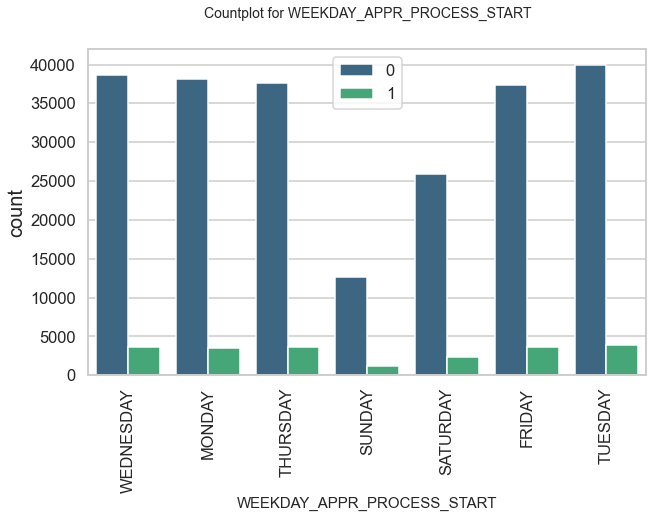

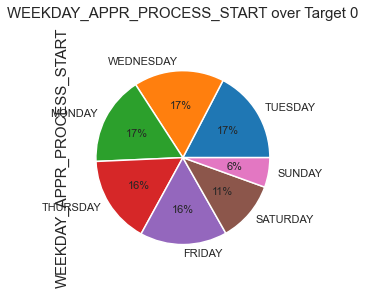

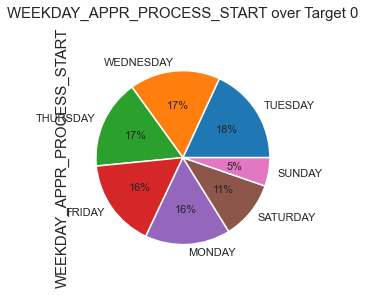

In [167]:
# Apply countplot, pie chart for WEEKDAY_APPR_PROCESS_START
plt.figure(figsize=(10,6))
plt.xlabel('WEEKDAY_APPR_PROCESS_START',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'WEEKDAY_APPR_PROCESS_START', hue='TARGET', palette='viridis')
plt.title('Countplot for WEEKDAY_APPR_PROCESS_START', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('WEEKDAY_APPR_PROCESS_START',fontsize=15)
plt.title('WEEKDAY_APPR_PROCESS_START over Target 0', fontsize=15)
appln_data_t0.WEEKDAY_APPR_PROCESS_START.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('WEEKDAY_APPR_PROCESS_START',fontsize=15)
plt.title('WEEKDAY_APPR_PROCESS_START over Target 0', fontsize=15)
appln_data_t1.WEEKDAY_APPR_PROCESS_START.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

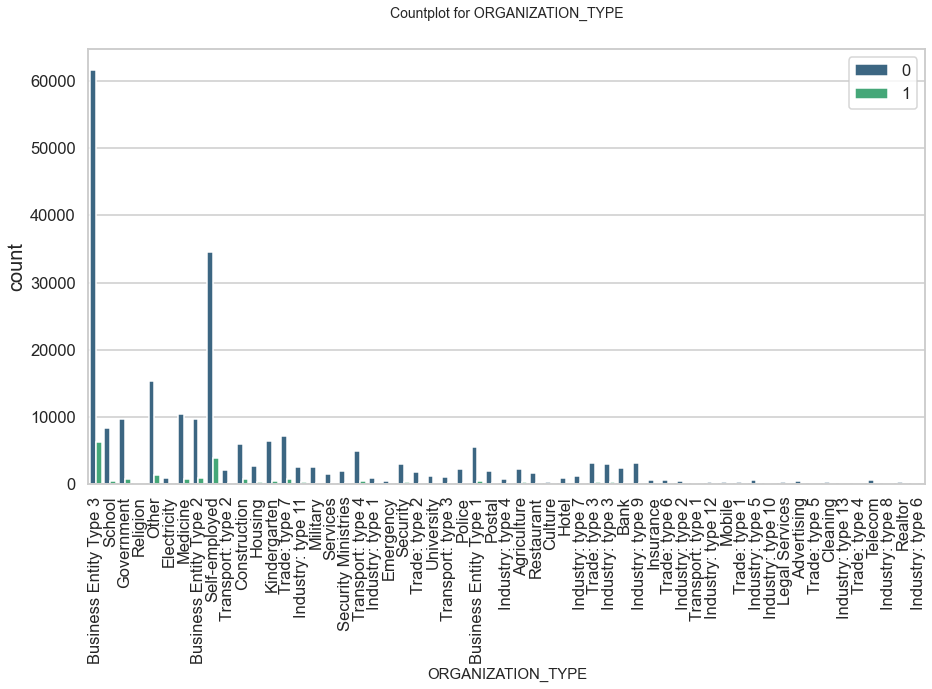

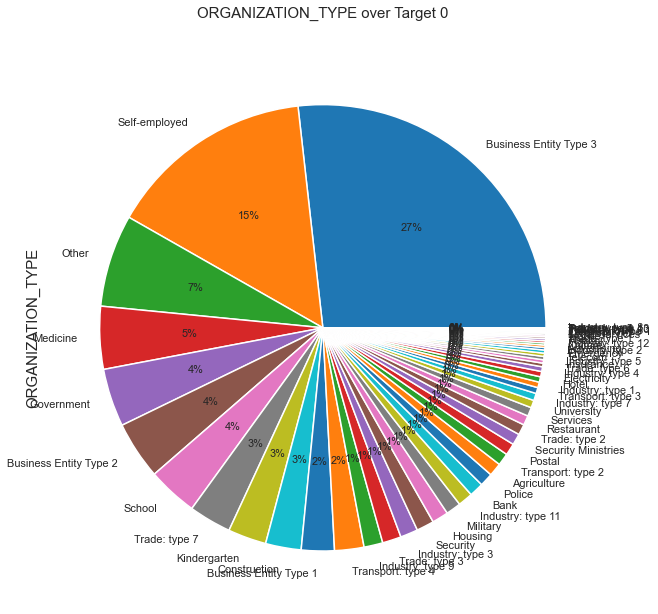

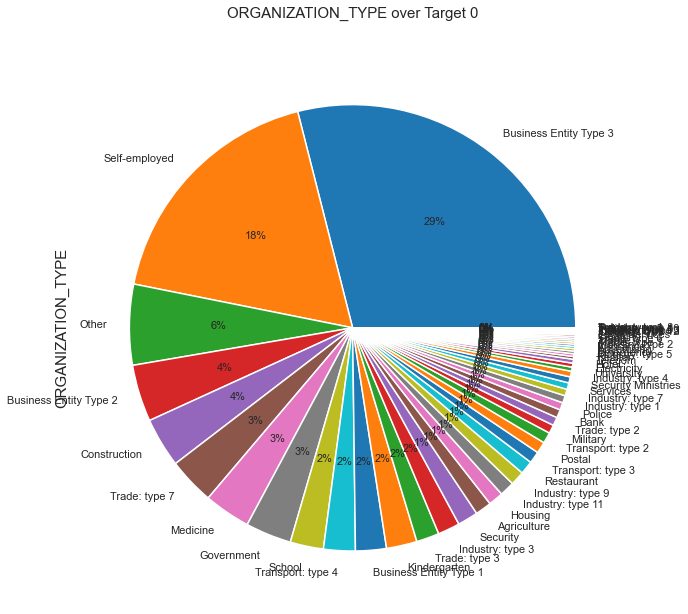

In [170]:
# Apply countplot, pie chart for ORGANIZATION_TYPE
plt.figure(figsize=(15,8))
plt.xlabel('ORGANIZATION_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'ORGANIZATION_TYPE', hue='TARGET', palette='viridis')
plt.title('Countplot for ORGANIZATION_TYPE', fontsize=14)
plt.legend()
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('ORGANIZATION_TYPE',fontsize=15)
plt.title('ORGANIZATION_TYPE over Target 0', fontsize=15)
appln_data_t0.ORGANIZATION_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.figure(figsize=(10,12))
plt.ylabel('ORGANIZATION_TYPE',fontsize=15)
plt.title('ORGANIZATION_TYPE over Target 0', fontsize=15)
appln_data_t1.ORGANIZATION_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

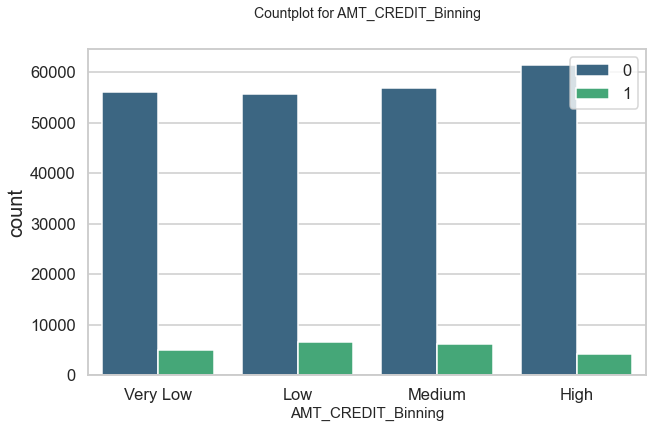

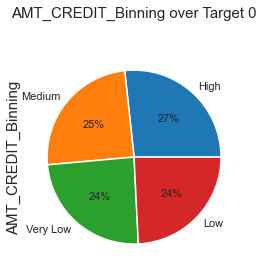

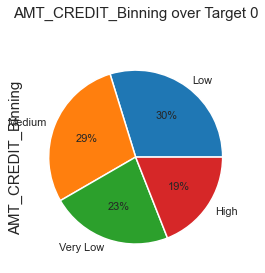

In [171]:
# Apply countplot, pie chart for AMT_CREDIT_Binning
plt.figure(figsize=(10,6))
plt.xlabel('AMT_CREDIT_Binning',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=appln_data, x= 'AMT_CREDIT_Binning', hue='TARGET', palette='viridis')
plt.title('Countplot for AMT_CREDIT_Binning', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('AMT_CREDIT_Binning',fontsize=15)
plt.title('AMT_CREDIT_Binning over Target 0', fontsize=15)
appln_data_t0.AMT_CREDIT_Binning.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('AMT_CREDIT_Binning',fontsize=15)
plt.title('AMT_CREDIT_Binning over Target 0', fontsize=15)
appln_data_t1.AMT_CREDIT_Binning.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

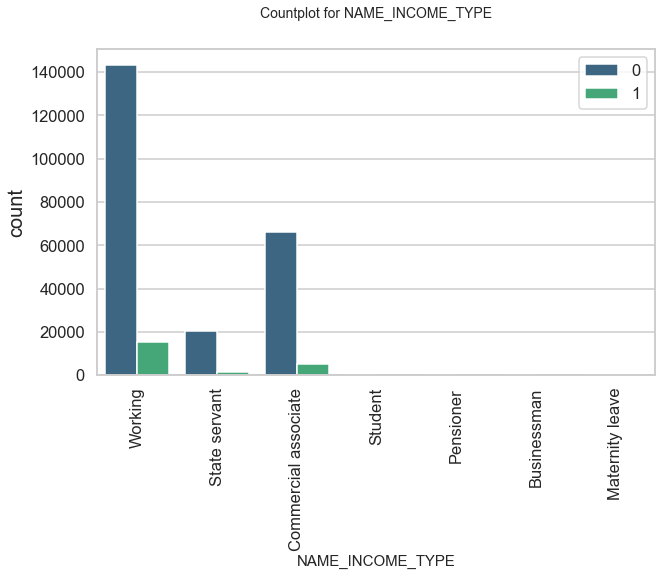

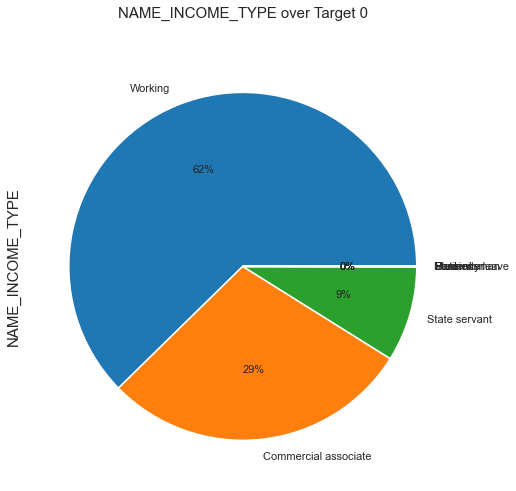

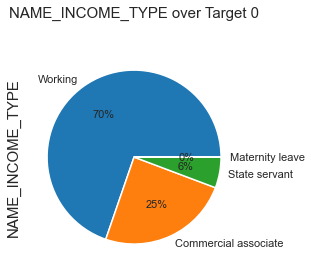

In [174]:
# Apply countplot, pie chart for NAME_INCOME_TYPE
plt.figure(figsize=(10,6))
plt.xlabel('NAME_INCOME_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=appln_data, x= 'NAME_INCOME_TYPE', hue='TARGET', palette='viridis')
plt.title('Countplot for NAME_INCOME_TYPE', fontsize=14)
plt.legend()
plt.show()

plt.figure(figsize=(10,8))
plt.ylabel('NAME_INCOME_TYPE',fontsize=15)
plt.title('NAME_INCOME_TYPE over Target 0', fontsize=15)
appln_data_t0.NAME_INCOME_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('NAME_INCOME_TYPE',fontsize=15)
plt.title('NAME_INCOME_TYPE over Target 0', fontsize=15)
appln_data_t1.NAME_INCOME_TYPE.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

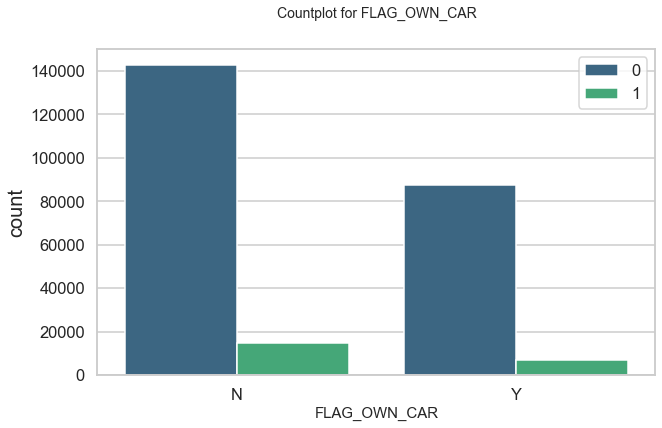

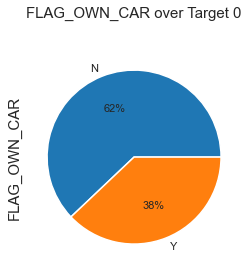

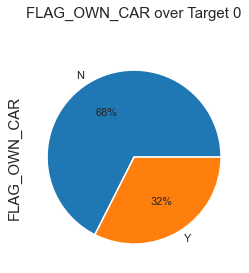

In [175]:
# Apply countplot, pie chart for FLAG_OWN_CAR
plt.figure(figsize=(10,6))
plt.xlabel('FLAG_OWN_CAR',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=appln_data, x= 'FLAG_OWN_CAR', hue='TARGET', palette='viridis')
plt.title('Countplot for FLAG_OWN_CAR', fontsize=14)
plt.legend()
plt.show()

plt.ylabel('FLAG_OWN_CAR',fontsize=15)
plt.title('FLAG_OWN_CAR over Target 0', fontsize=15)
appln_data_t0.FLAG_OWN_CAR.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

plt.ylabel('FLAG_OWN_CAR',fontsize=15)
plt.title('FLAG_OWN_CAR over Target 0', fontsize=15)
appln_data_t1.FLAG_OWN_CAR.value_counts(normalize=True).plot.pie(autopct = "%1.0f%%", fontsize=11)
plt.show()

#### We observed that 
- Individuals having house/flat are more likely to take the loans
- People who are married are tend to take the loan followed by Single/Not Married as compared to other categories
- People are more likely to take the cash loans
- Female tends to take more loans
- We can conclude that Secondary/ Secondary Special are taking high number of loans
- People with House/Apartment are tend to take more loans 
- Income with 125000-150000 are more tend to take the loan
- Laborers are tend to take more loans
- Unaccompained are tend to take more loans compared to other types of category
- People who start their applcation on sunday are less likely to take loan where as people who start their Applicaion on Tuesday are more likely to take loan
- Business Entty Type3 and Self Employed type of organizations are more likely to take the loan
- People with High income credit tend to take loans
- People whose income type is working and commercial associate are more likely to take the loan
- people with no car tend to take more loans


#### Extract the numerical columns from Application_Data DataSet to perform Univariate Analysis on  Numerical Columns


In [179]:
numerical_cols=list(appln_data.describe())
numerical_cols

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'FLOORSMAX_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'F

In [275]:
# Plot the distplot for the Numerical columns in Application_Data DataSet 

def uni_num(data1,col,hue =None):
    sns.set(style="darkgrid")
    fig, ax=plt.subplots(nrows =1,ncols=2,figsize=(20,8))
    ax[0].set_title("Distribution Plot")
    sns.distplot(data1[~data1[col].isna()][col],ax=ax[0], color="#4CB391")
    plt.yscale('log')
    ax[1].set_title("Box Plot")
    sns.boxplot(data =data1, x=col,ax=ax[1],orient='v', color="#4CB391")
    plt.yscale('log')
    plt.show()

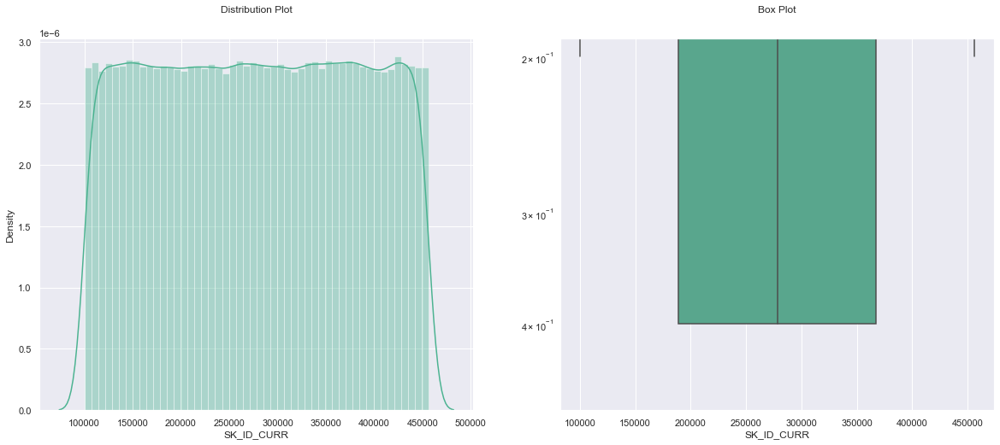

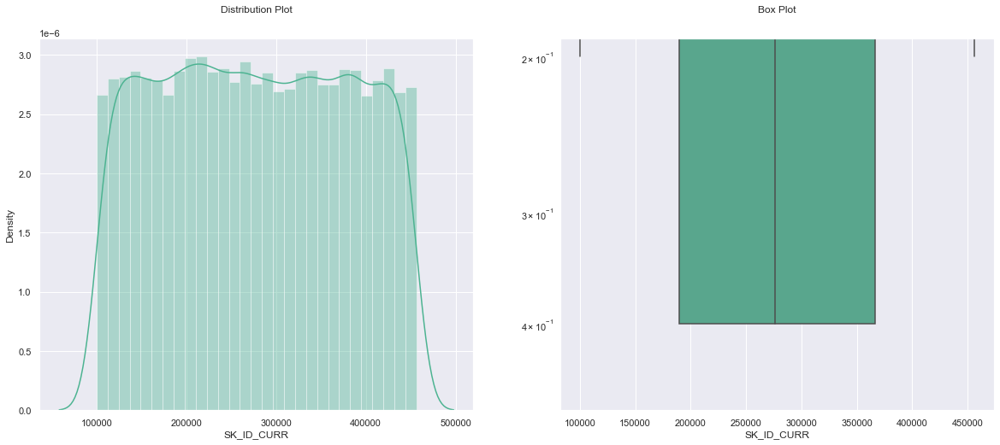

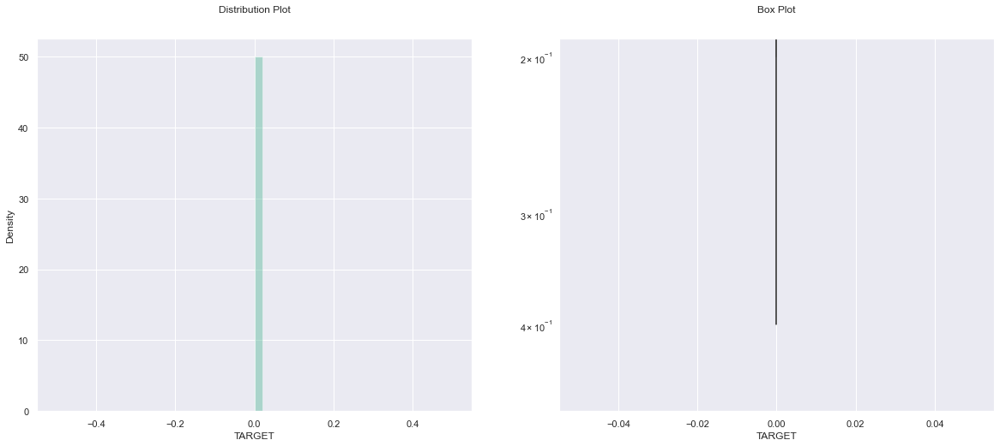

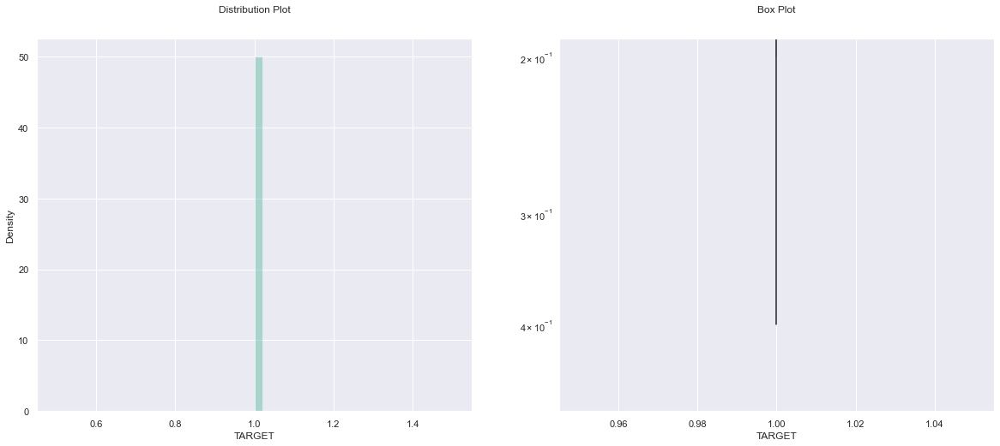

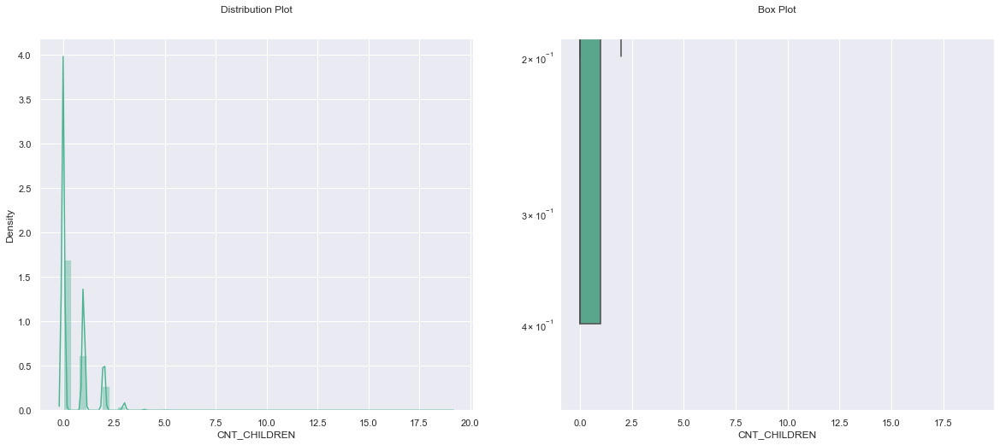

...

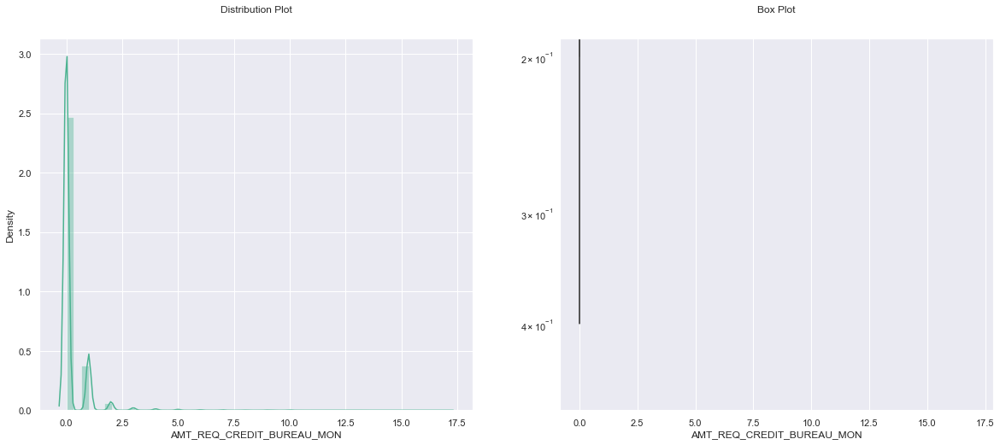

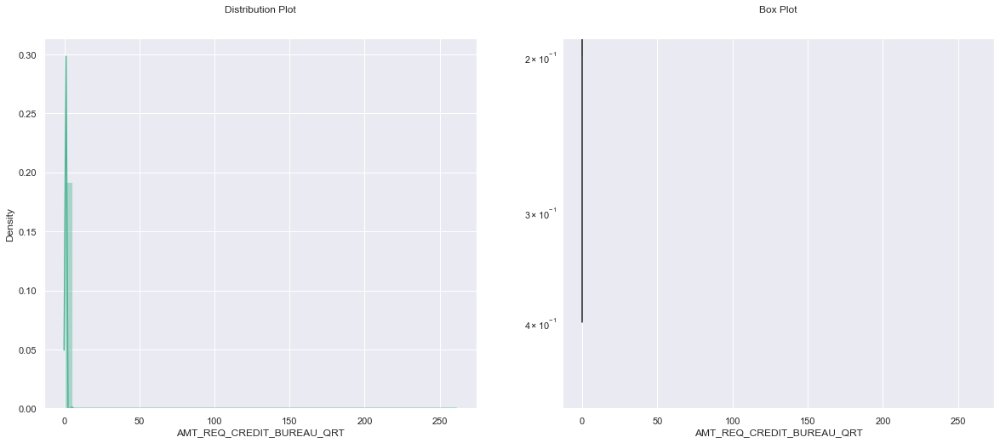

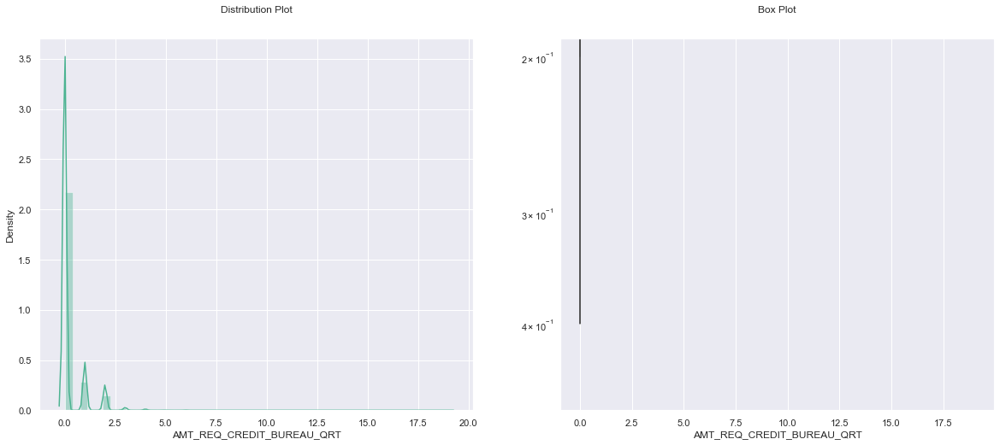

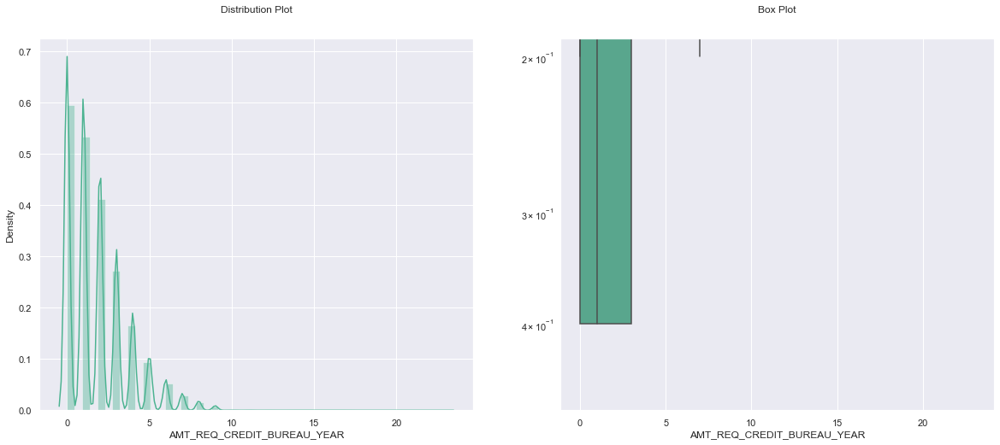

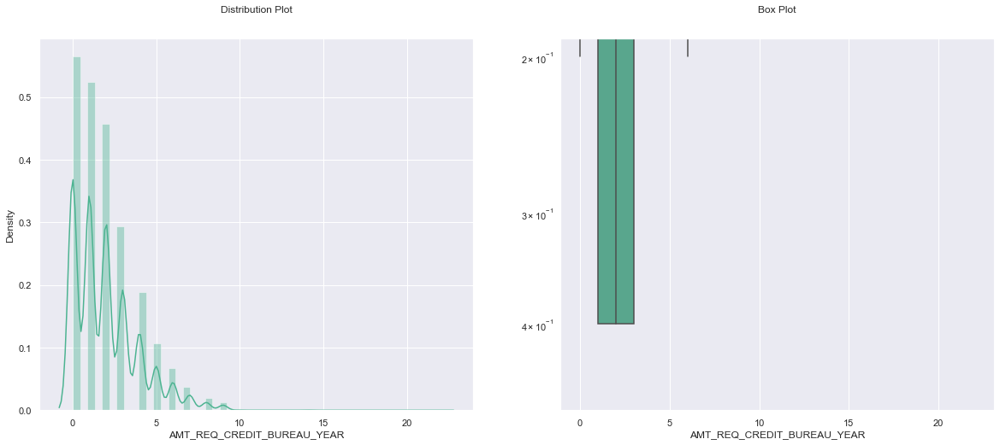

In [191]:
for i in numerical_cols:
    uni_num(data1=appln_data_t0,col=i)
    uni_num(data1=appln_data_t1,col=i)

#### From the above Graphs, we can conclude that
- People with lower total income are less likely to take loans
- People who just got employed tends to take more loans
- People who retired tends to take more loans
- High number of applications are filed in between 10 AM to 2 PM
- People with age between 10000-15000 days tend to take more loans
- People whose ids got published between 4000 days and 5000 days ago tend to take more loans
- Nuclear family tends to take more loans
- For less goods amount people take loans
- Low amount annuity has high number of loans

#### Find the Correlation for Numerical columns in Application_Data

In [193]:
# Find some correlation for numerical columns for both target 0 and 1 

appln_data_t0_corr=appln_data_t0.iloc[0:,2:]
appln_data_t1_corr=appln_data_t1.iloc[0:,2:]

appln_data_corr_t0=appln_data_t0_corr.corr(method='spearman')
appln_data_corr_t1=appln_data_t1_corr.corr(method='spearman')

In [194]:
# Get the correlation data for Target 0
appln_data_corr_t0

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,-0.021950,-0.023652,-0.010799,-0.027086,-0.030579,0.266534,0.030948,0.155518,-0.119164,0.001518,0.001905,-0.012116,0.002632,-0.034281,0.010351,0.848232,0.035561,0.034350,-0.030162,-0.022813,-0.015475,-0.005576,0.002344,0.007487,0.013295,-0.027456,-0.016471,0.021701,-0.020128,0.021674,-0.018751,0.021859,-0.019329,-0.015571,0.026816,0.005460,0.026536,0.003688,-0.001645,0.003130,-0.008397,-0.004279,-0.027691,-0.047128,-0.003385,0.026595,-0.008971,-0.003718,-0.012412,0.000499,-0.001871,-0.011696,0.000439,0.001097,-0.000604,-0.005380,-0.001771,-0.000342,-0.004740,-0.000106,0.001123,-0.000679,-0.013133,-0.001684,-0.035374
AMT_INCOME_TOTAL,-0.021950,1.000000,0.403876,0.472217,0.408533,0.110074,-0.054666,-0.060868,0.040559,-0.036702,0.001334,-0.003887,-0.116929,-0.006908,-0.001622,0.087402,-0.011545,-0.216438,-0.238145,0.073503,0.077634,0.159962,0.148281,-0.001023,-0.013856,-0.004758,0.184161,-0.068317,0.054264,0.168253,0.049430,0.160502,0.053499,0.165724,0.136258,-0.036970,-0.034036,-0.036669,-0.034723,-0.052422,-0.005312,-0.088835,-0.000937,-0.003008,-0.002846,0.000376,0.182143,0.037710,0.001667,-0.004761,0.004011,0.048071,0.038509,0.023916,0.009851,0.006260,-0.006778,0.007115,0.001195,-0.003095,0.002652,0.007412,0.009712,0.069404,0.027260,0.053694
AMT_CREDIT,-0.023652,0.403876,1.000000,0.826706,0.985074,0.060706,-0.169030,-0.104251,-0.015318,-0.038197,0.001784,-0.002788,-0.053181,0.032588,0.023786,0.007630,0.045683,-0.091606,-0.100894,0.036923,0.015118,0.041693,0.045175,-0.040616,-0.037000,-0.011194,0.137629,0.044201,0.032656,0.078389,0.031032,0.076093,0.032491,0.077708,0.064265,-0.001623,-0.018819,-0.001530,-0.021286,-0.079351,0.005506,0.125934,-0.000765,-0.017504,0.019894,-0.005087,0.076535,0.018149,-0.003220,0.001146,0.003805,0.038021,0.033683,0.023725,0.048112,0.007099,0.022033,0.017149,0.025501,-0.023671,-0.004249,0.000323,-0.006210,0.042889,0.028180,-0.036601
AMT_ANNUITY,-0.010799,0.472217,0.826706,1.000000,0.824348,0.064333,-0.100290,-0.074646,0.010712,-0.027355,-0.000007,-0.002229,-0.062150,0.031608,0.010037,0.057749,0.052967,-0.119100,-0.133179,0.032956,0.033442,0.070856,0.069069,-0.019953,-0.024084,-0.008085,0.131532,0.036767,0.034668,0.100398,0.032509,0.096712,0.034227,0.099164,0.079610,-0.014587,-0.019625,-0.014339,-0.022264,-0.066849,0.001610,0.128755,-0.000669,-0.015193,0.008045,-0.005398,0.126105,0.030715,-0.003906,-0.021593,0.001344,0.016860,0.019843,0.010666,-0.005109,0.000476,-0.024663,0.002826,0.011605,-0.026350,0.004098,0.002853,0.013358,0.046989,0.027879,0.004552
AMT_GOODS_PRICE,-0.027086,0.408533,0.985074,0.824348,1.000000,0.069899,-0.169016,-0.109327,-0.014986,-0.039785,0.001723,-0.002758,-0.032882,0.029296,0.039146,0.007353,0.045319,-0.094053,-0.10

In [195]:
# Get the correlation data for Target 0
appln_data_corr_t1

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,-0.039123,0.000427,0.015133,-0.005807,-0.029682,0.175025,0.006823,0.110854,-0.091042,NaN,0.005055,-0.000583,0.006947,-0.029409,0.010805,0.845289,0.048236,0.049688,-0.040338,-0.035213,-0.040853,-0.027993,-0.016072,-0.005444,0.009557,-0.014702,0.000361,0.006568,-0.023195,0.008009,-0.021919,0.005238,-0.022958,-0.024160,0.034901,-0.001687,0.034091,-0.003596,0.015176,-0.010111,0.012013,NaN,-0.032840,-0.031133,-0.001835,0.007380,-0.004424,NaN,-0.012606,NaN,-0.000116,-0.008572,0.008535,-0.014300,-0.007149,0.001282,-0.004365,-0.001604,0.003511,-0.001663,-0.008511,-0.000225,-0.023875,-0.015079,-0.031603
AMT_INCOME_TOTAL,-0.039123,1.000000,0.364559,0.428947,0.369419,0.058005,-0.103026,-0.053798,0.011378,-0.051113,NaN,-0.006178,-0.135888,0.001611,-0.018122,0.094630,-0.029655,-0.163605,-0.181015,0.078779,0.075615,0.156374,0.145982,-0.003813,-0.006241,0.004230,0.151537,-0.048537,0.037238,0.133746,0.030744,0.130385,0.035795,0.134022,0.105028,-0.006082,-0.026784,-0.006269,-0.028520,-0.076684,-0.001225,-0.054092,NaN,-0.005841,-0.007918,-0.005109,0.155940,0.035737,NaN,-0.001676,NaN,0.026663,0.029636,0.009682,0.015320,-0.002888,-0.025381,0.000446,-0.005306,-0.002838,0.008880,-0.005336,0.022686,0.079420,0.023812,0.075815
AMT_CREDIT,0.000427,0.364559,1.000000,0.812093,0.976307,0.043545,-0.200718,-0.107605,-0.021973,-0.065143,NaN,-0.009650,-0.081660,0.040356,-0.009178,0.013229,0.060267,-0.050664,-0.063304,0.024616,0.015043,0.032536,0.034861,-0.030974,-0.032882,-0.012465,0.120180,0.083735,0.014979,0.072062,0.011246,0.071253,0.014768,0.073111,0.055849,0.016914,-0.028261,0.016878,-0.033856,-0.106939,0.021513,0.111312,NaN,-0.018179,0.019861,-0.017454,0.059856,0.018753,NaN,-0.005362,NaN,0.010914,0.041262,0.015899,0.035300,-0.001789,0.004294,0.007214,0.015865,-0.032209,0.001727,-0.006975,0.005325,0.045339,-0.014407,-0.024635
AMT_ANNUITY,0.015133,0.428947,0.812093,1.000000,0.806543,0.028666,-0.100200,-0.060193,0.019762,-0.044128,NaN,-0.006327,-0.075362,0.040549,-0.021928,0.065316,0.062994,-0.059905,-0.076330,0.021129,0.029646,0.060363,0.059724,-0.011744,-0.015938,-0.003012,0.115647,0.050873,0.019068,0.083648,0.013580,0.083012,0.018742,0.085384,0.060436,0.004732,-0.022101,0.005796,-0.026456,-0.077735,0.016403,0.110373,NaN,-0.015524,0.006238,-0.018663,0.111821,0.027909,NaN,-0.016444,NaN,-0.007110,0.020782,0.007936,-0.013081,-0.006002,-0.044801,-0.004318,0.000248,-0.035121,0.013317,-0.003764,0.036961,0.064217,0.002151,-0.000332
AMT_GOODS_PRICE,-0.005807,0.369419,0.976307,0.806543,1.000000,0.058424,-0.198895,-0.116050,-0.023020,-0.069227,NaN,-0.009242,-0.052593,0.037336,0.010761,0.015627,0.058352,-0.060749,-0.072662,0.037317,0.018467,0.036913,0.038112,-0.031660,-0.034358,-0.012493,0.132749,0.088721

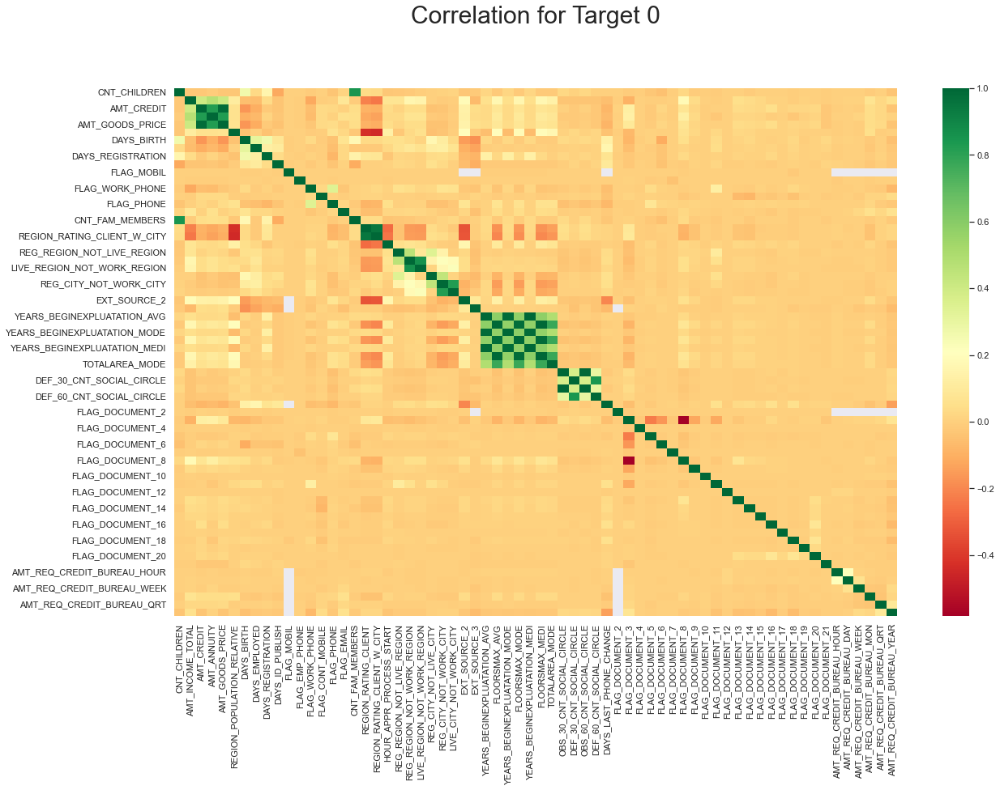

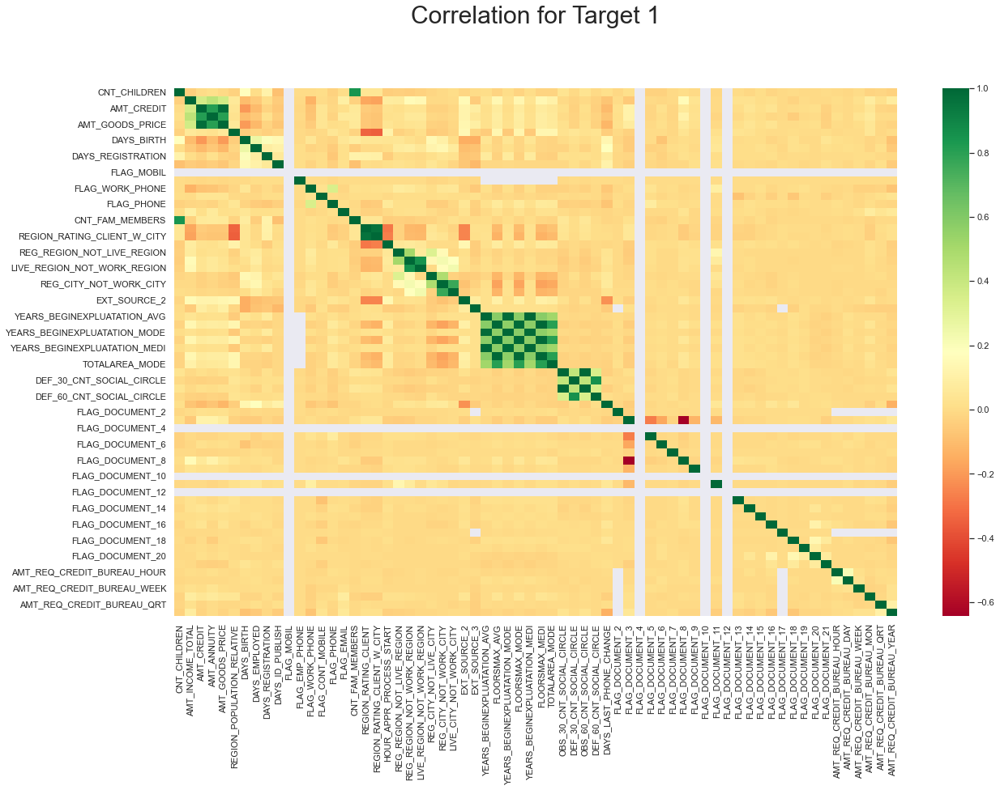

In [206]:
# Now define a function to get the heatmap for both Target values 0 and 1

def target01_corr(data,title):
    plt.figure(figsize=(20,12))
    plt.rcParams['axes.titlesize'] = 30
    plt.rcParams['axes.titlepad'] = 80

    sns.heatmap(data, cmap="RdYlGn",annot=False)
    plt.title(title)
    plt.yticks(rotation=0)
    plt.show()
target01_corr(data=appln_data_corr_t0, title='Correlation for Target 0')
target01_corr(data=appln_data_corr_t1, title='Correlation for Target 1')

In [202]:
# Find the top 10 Correlation for Target 0
corr0=appln_data_t0.corr()
corr_df=corr0.where(np.triu(np.ones(corr0.shape), k=1).astype(np.bool))
corr_df=corr_df.unstack().reset_index()
corr_df.columns=['Variable1','Variable2','Coorelation']
corr_df.dropna(subset=['Coorelation'],inplace=True)
corr_df['Coorelation']=round(corr_df['Coorelation'],2)
corr_df['Coorelation']=abs(corr_df['Coorelation']) 
corr_df.sort_values(by='Coorelation',ascending=False).head(10)

,Variable1,Variable2,Coorelation
2411,FLOORSMAX_MEDI,FLOORSMAX_AVG,1.00
2689,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
2342,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,0.99
412,AMT_GOODS_PRICE,AMT_CREDIT,0.99
2413,FLOORSMAX_MEDI,FLOORSMAX_MODE,0.99
2275,FLOORSMAX_MODE,FLOORSMAX_AVG,0.99
2206,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_AVG,0.97
2344,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_MODE,0.96
1379,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,0.95
1226,CNT_FAM_MEMBERS,CNT_CHILDREN,0.89


In [204]:
# Find the top 10 Correlation for Target 1
corr1=appln_data_t1.corr()
corr_df=corr1.where(np.triu(np.ones(corr1.shape), k=1).astype(np.bool))
corr_df=corr_df.unstack().reset_index()
corr_df.columns=['Variable1','Variable2','Coorelation']
corr_df.dropna(subset=['Coorelation'],inplace=True)
corr_df['Coorelation']=round(corr_df['Coorelation'],2)
corr_df['Coorelation']=abs(corr_df['Coorelation']) 
corr_df.sort_values(by='Coorelation',ascending=False).head(10)

,Variable1,Variable2,Coorelation
2689,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
2411,FLOORSMAX_MEDI,FLOORSMAX_AVG,1.00
2342,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,1.00
2275,FLOORSMAX_MODE,FLOORSMAX_AVG,0.99
2413,FLOORSMAX_MEDI,FLOORSMAX_MODE,0.99
2344,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_MODE,0.98
2206,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_AVG,0.98
412,AMT_GOODS_PRICE,AMT_CREDIT,0.98
1379,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,0.96
1226,CNT_FAM_MEMBERS,CNT_CHILDREN,0.89


#### Insights from Correlation 
- When defaulted, major portion of decision is taken by-
  (YEARS_BEGINEXPLUATATION_MEDI AND YEARS_BEGINEXPLUATATION_AVG)
  (OBS_60_CNT_SOCIAL_CIRCLE AND OBS_30_CNT_SOCIAL_CIRCLE)
  (FLOORSMAX_MEDI AND FLOORSMAX_AVG)

- When not defaulted, major portion of decision is taken by-
  (FLOORSMAX_MEDI AND FLOORSMAX_AVG)
  (OBS_60_CNT_SOCIAL_CIRCLE AND OBS_30_CNT_SOCIAL_CIRCLE)
  (FLOORSMAX_MEDI AND FLOORSMAX_MODE)

- Values - YEARS_BEGINEXPLUATATION_MEDI and YEARS_BEGINEXPLUATATION_AVG are more correlated in default case than non-default

#### Perform Bivarte Analysis for categorical columns in Application_Data DataSet

In [208]:
categorical_cols

['FLAG_OWN_REALTY',
 'NAME_FAMILY_STATUS',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'NAME_EDUCATION_TYPE',
 'EMERGENCYSTATE_MODE',
 'NAME_HOUSING_TYPE',
 'AMT_INCOME_TOTAL_Binning',
 'OCCUPATION_TYPE',
 'NAME_TYPE_SUITE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'AMT_CREDIT_Binning',
 'NAME_INCOME_TYPE',
 'FLAG_OWN_CAR']

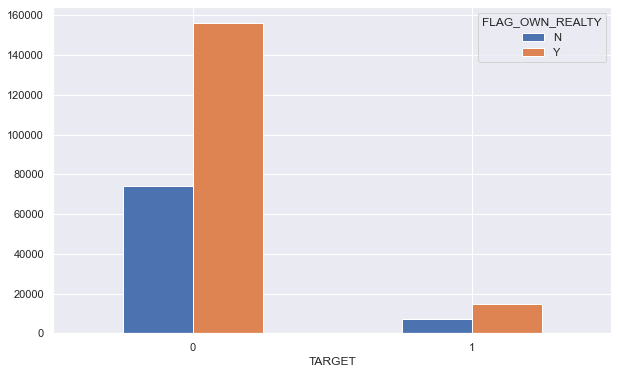

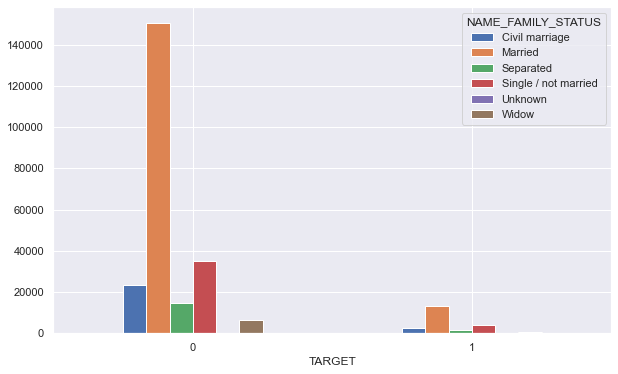

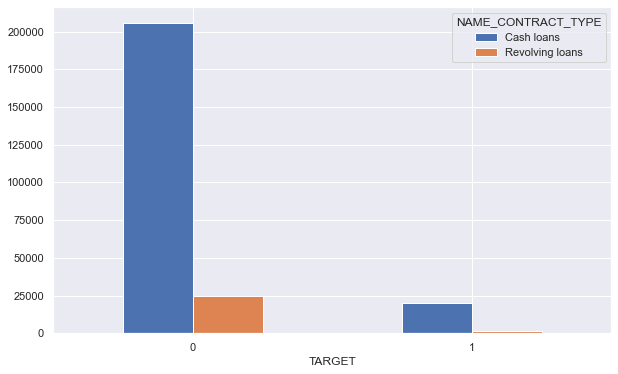

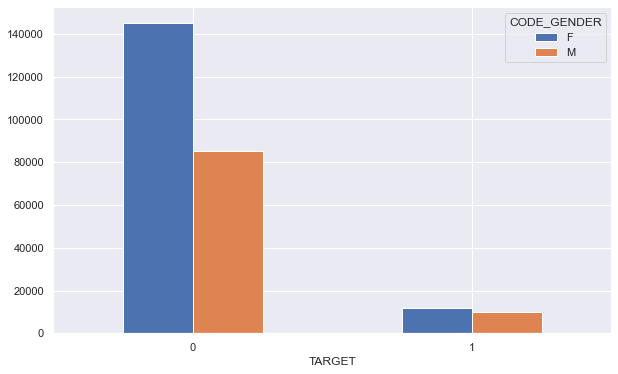

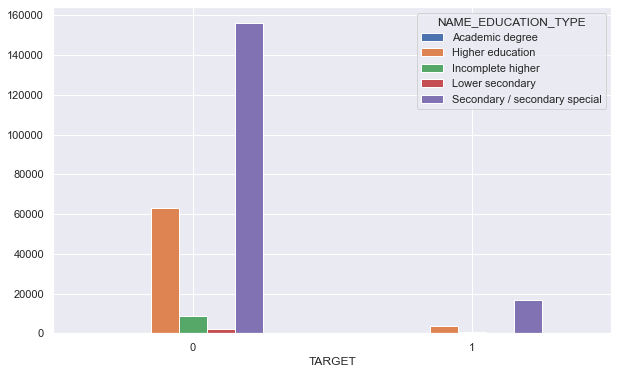

...

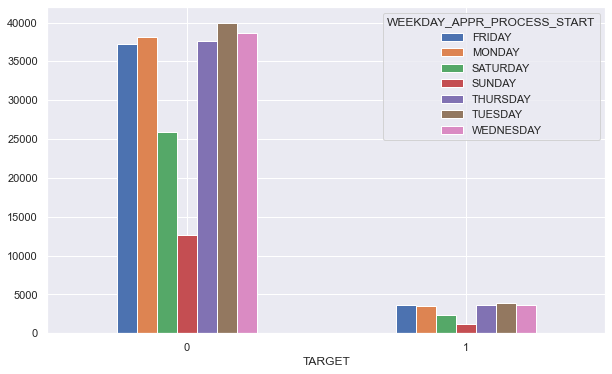

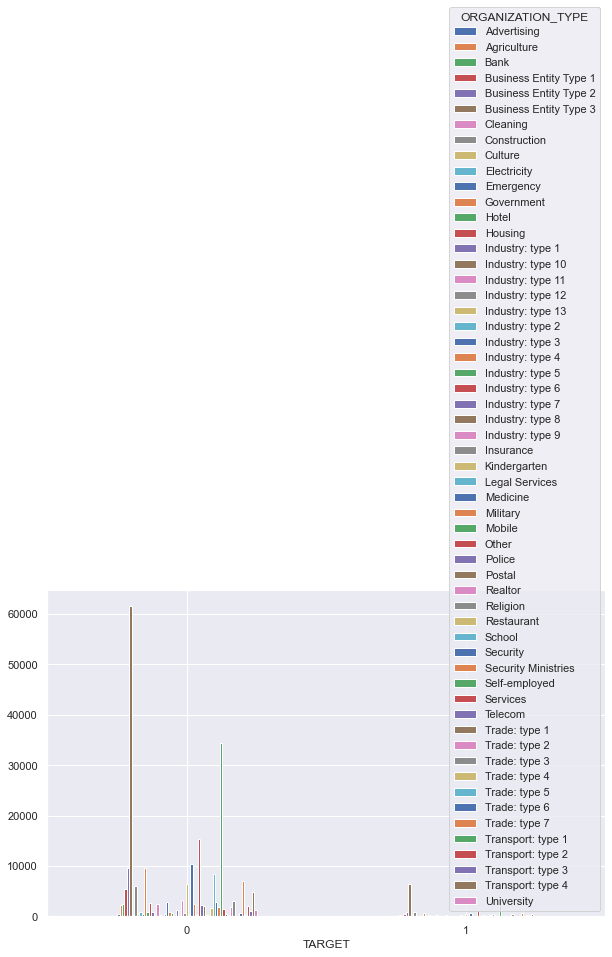

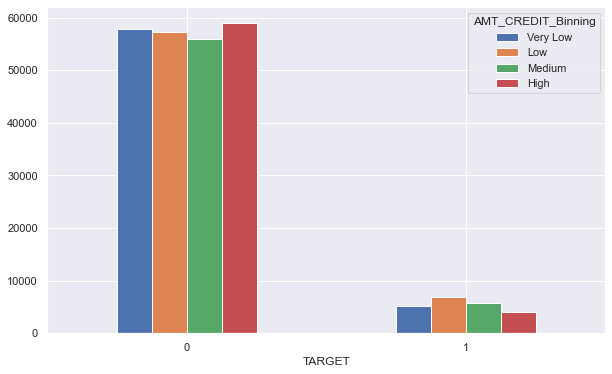

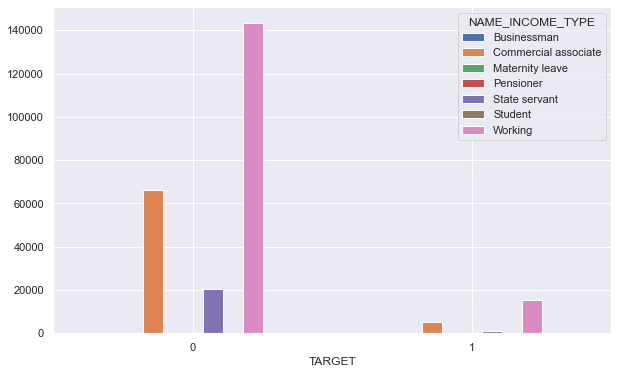

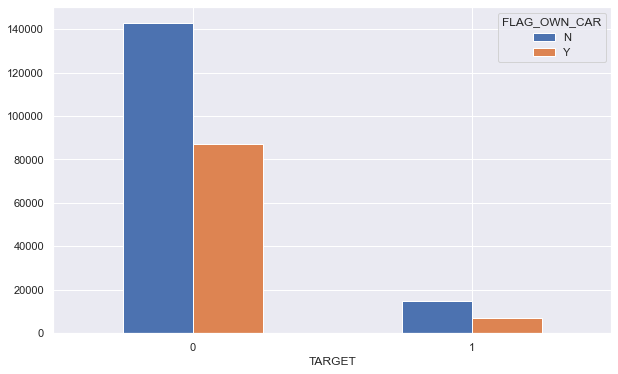

In [276]:
#Plot the Bar Graphs for the categorical columns
FLAG_OWN_REALTY=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['FLAG_OWN_REALTY'])
FLAG_OWN_REALTY.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()
    
NAME_FAMILY_STATUS=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['NAME_FAMILY_STATUS'])
NAME_FAMILY_STATUS.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

NAME_CONTRACT_TYPE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['NAME_CONTRACT_TYPE'])
NAME_CONTRACT_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

CODE_GENDER=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['CODE_GENDER'])
CODE_GENDER.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

NAME_EDUCATION_TYPE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['NAME_EDUCATION_TYPE'])
NAME_EDUCATION_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

EMERGENCYSTATE_MODE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['EMERGENCYSTATE_MODE'])
EMERGENCYSTATE_MODE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

NAME_HOUSING_TYPE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['NAME_HOUSING_TYPE'])
NAME_HOUSING_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

AMT_INCOME_TOTAL_Binning=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['AMT_INCOME_TOTAL_Binning'])
AMT_INCOME_TOTAL_Binning.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

OCCUPATION_TYPE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['OCCUPATION_TYPE'])
OCCUPATION_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

NAME_TYPE_SUITE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['NAME_TYPE_SUITE'])
NAME_TYPE_SUITE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

WEEKDAY_APPR_PROCESS_START=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['WEEKDAY_APPR_PROCESS_START'])
WEEKDAY_APPR_PROCESS_START.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

ORGANIZATION_TYPE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['ORGANIZATION_TYPE'])
ORGANIZATION_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

AMT_CREDIT_Binning=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['AMT_CREDIT_Binning'])
AMT_CREDIT_Binning.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

NAME_INCOME_TYPE=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['NAME_INCOME_TYPE'])
NAME_INCOME_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()

FLAG_OWN_CAR=pd.crosstab(index=appln_data['TARGET'],columns=appln_data['FLAG_OWN_CAR'])
FLAG_OWN_CAR.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=0)
plt.show()


#### Perform Bivariate Analysis for Numerical columns in Application_Data DataSet 

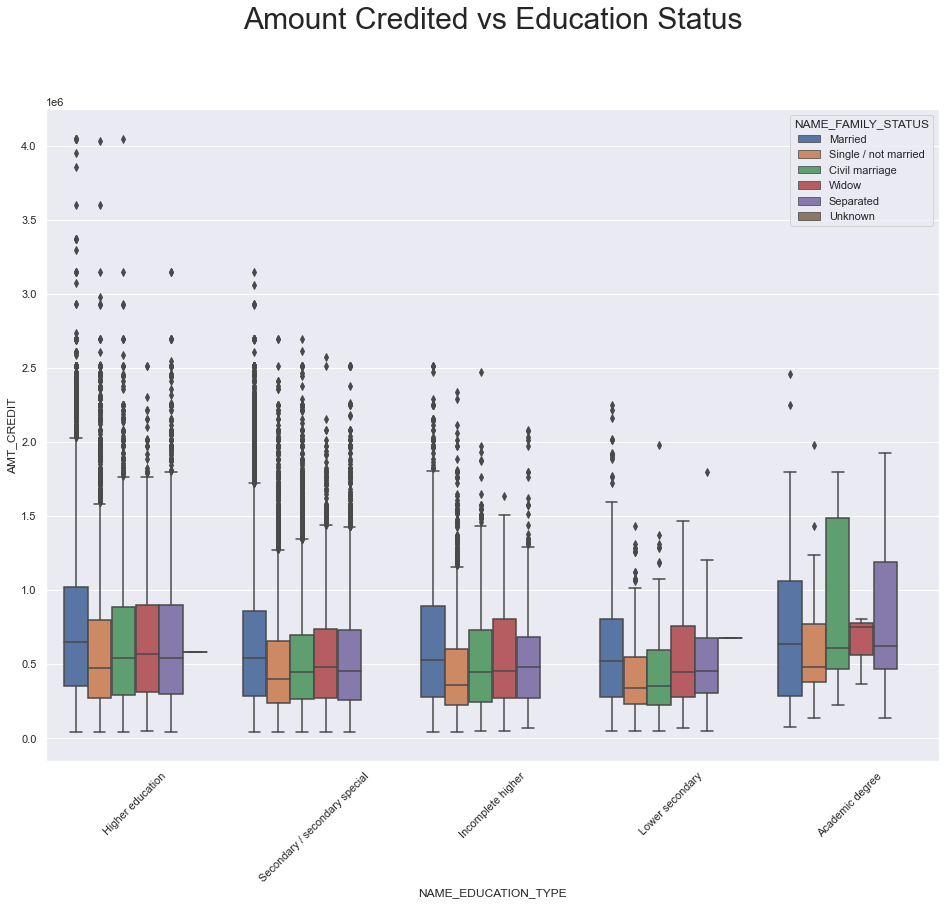

In [217]:
#NAME_EDUCATION_TYPE vs AMT_CREDIT vs NAME_FAMILY_STATUS for Target 0
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
sns.boxplot(data =appln_data_t0, x='NAME_EDUCATION_TYPE',y='AMT_CREDIT', hue ='NAME_FAMILY_STATUS',orient='v')
plt.title('Amount Credited vs Education Status')
plt.show()

- From the above box plot we can conclude that Family status of 'Civil Marriage', 'Marriage' and 'Separated' of Academic degree education are having higher number of credits than others. Also, higher education of family status of 'Marriage', 'Single' and 'Civil Marriage' are having more outliers. Civil marriage for Academic degree is having most of the credits in the third quartile.

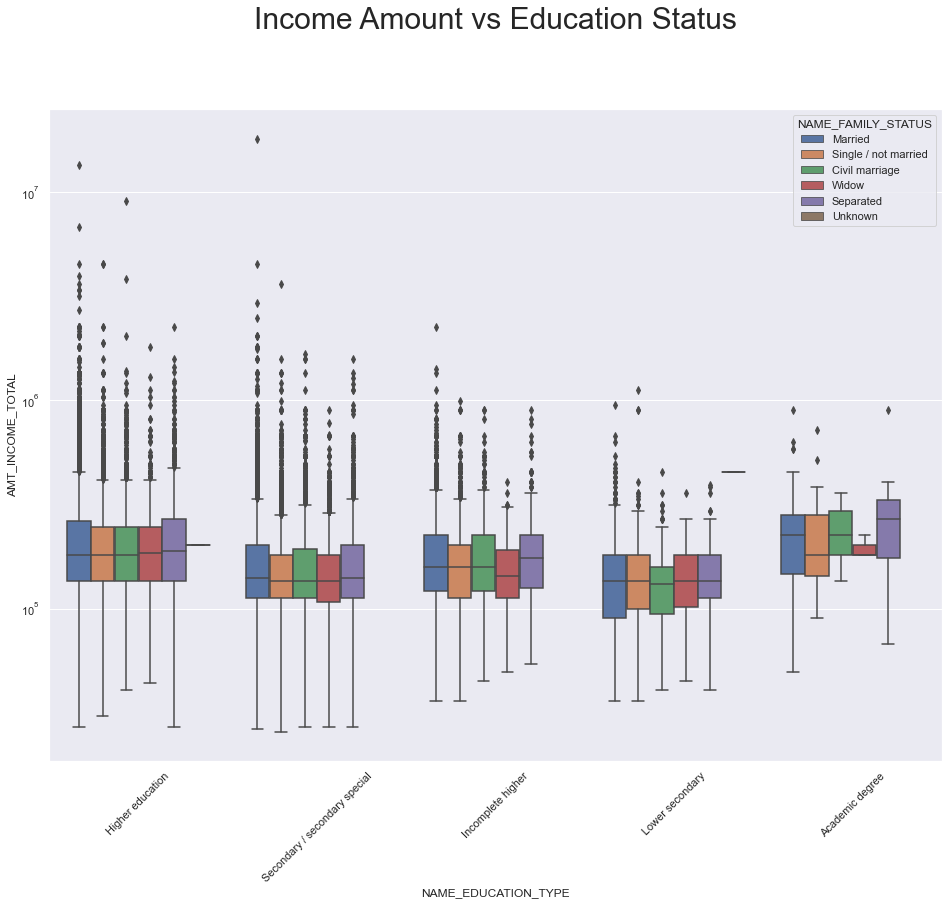

In [219]:
# NAME_EDUCATION_TYPE vs AMT_INCOME_TOTAL vs NAME_FAMILY_STATUS for Target 0
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
plt.yscale('log')
sns.boxplot(data =appln_data_t0, x='NAME_EDUCATION_TYPE',y='AMT_INCOME_TOTAL', hue ='NAME_FAMILY_STATUS',orient='v')
plt.title('Income Amount vs Education Status')
plt.show()

- From above boxplot for Education type 'Higher education' the income amount is mostly equal with family status. It does contain many outliers. Less outlier are having for Academic degree but there income amount is little higher that Higher education. Lower secondary of civil marriage family status are having less income amount than others.

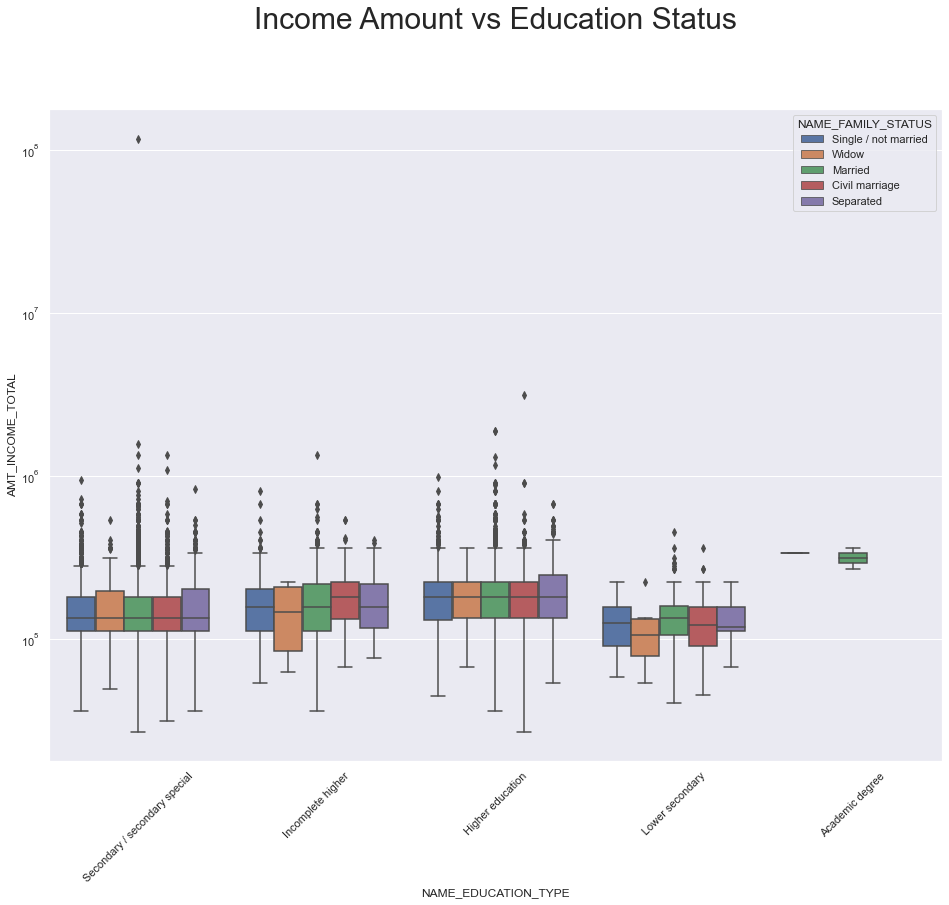

In [220]:
# NAME_EDUCATION_TYPE vs AMT_INCOME_TOTAL vs NAME_FAMILY_STATUS for Target 1
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
plt.yscale('log')
sns.boxplot(data =appln_data_t1, x='NAME_EDUCATION_TYPE',y='AMT_INCOME_TOTAL', hue ='NAME_FAMILY_STATUS',orient='v')
plt.title('Income Amount vs Education Status')
plt.show()

- There is some similarity with Target 0, From above boxplot for Education type 'Higher education' the income amount is mostly equal with family status. Less outlier are having for Academic degree but there income amount is little higher that Higher education. Lower secondary are have less income amount than others.

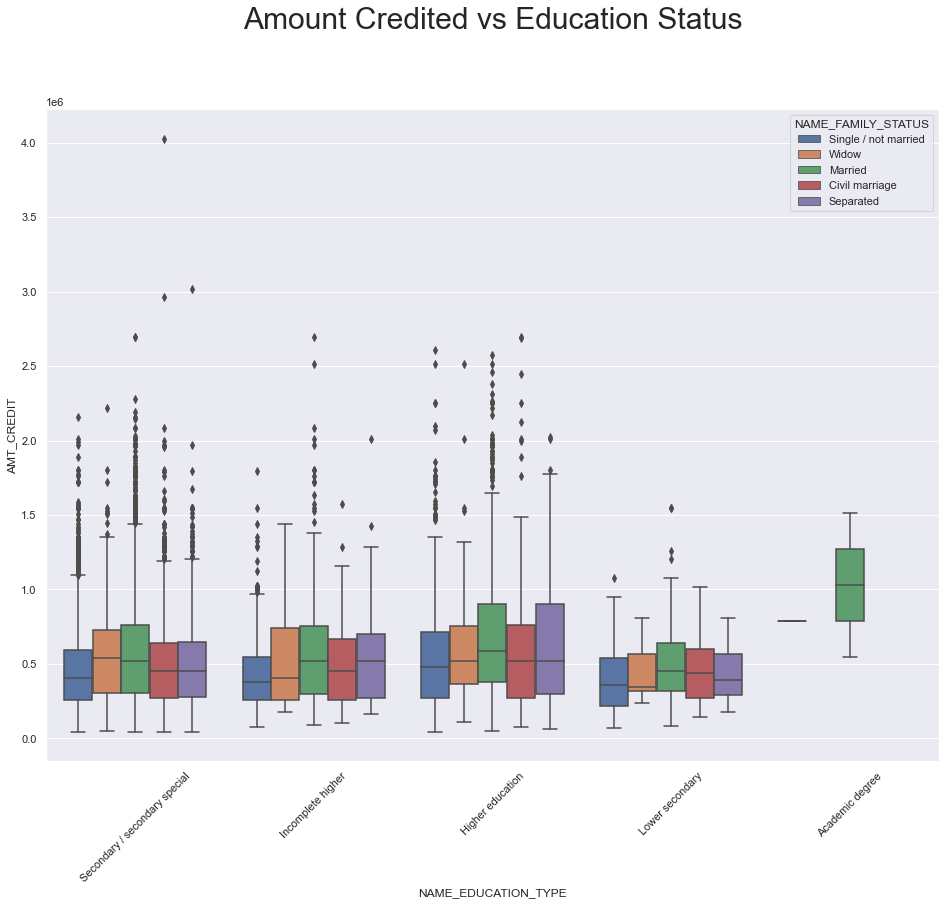

In [221]:
# NAME_EDUCATION_TYPE vs AMT_CREDIT vs NAME_FAMILY_STATUS for Target 1
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
sns.boxplot(data =appln_data_t1, x='NAME_EDUCATION_TYPE',y='AMT_CREDIT', hue ='NAME_FAMILY_STATUS',orient='v')
plt.title('Amount Credited vs Education Status')
plt.show()

- It is similar with Target 0 From the above box plot we can say that Family status of 'civil marriage', 'marriage' and 'separated' of Academic degree education are having higher number of credits than others. Most of the outliers are from Education type 'Higher education' and 'Secondary'. Civil marriage for Academic degree is having most of the credits in the third quartile.

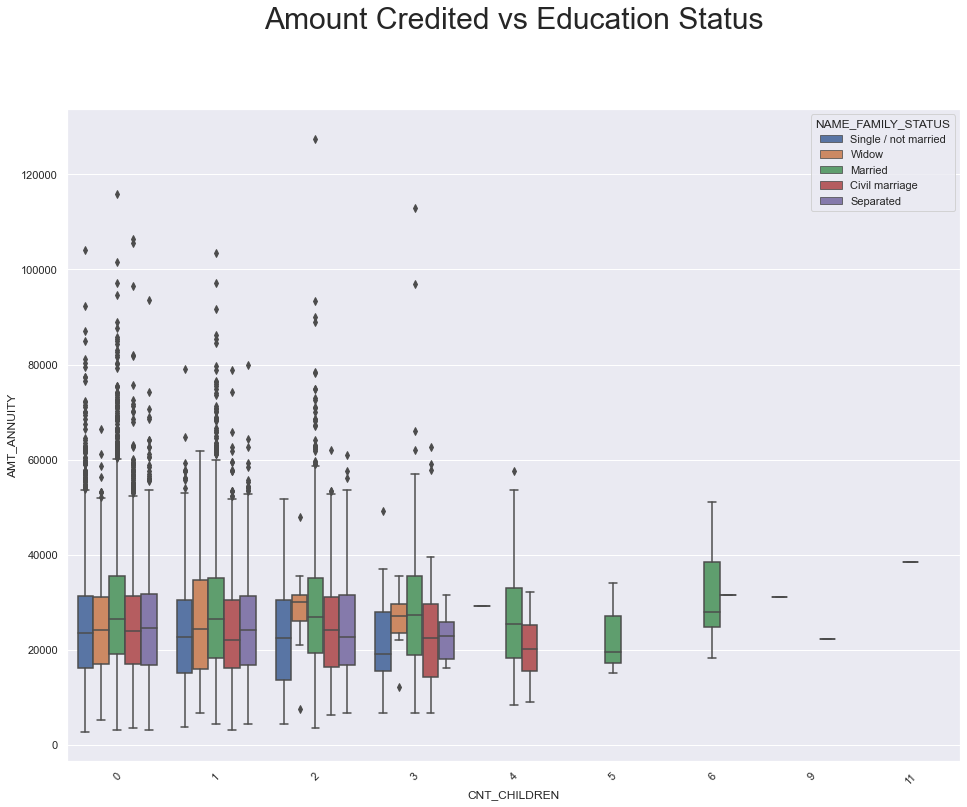

In [222]:
# CNT_CHILDREN vs AMT_ANNUITY vs NAME_FAMILY_STATUS over Target 1
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
sns.boxplot(data =appln_data_t1, x='CNT_CHILDREN',y='AMT_ANNUITY', hue ='NAME_FAMILY_STATUS',orient='v')
plt.title('Annual Income vs Number of Children')
plt.show()

- People who are married and having six children are having high annual income and they tend to take loan

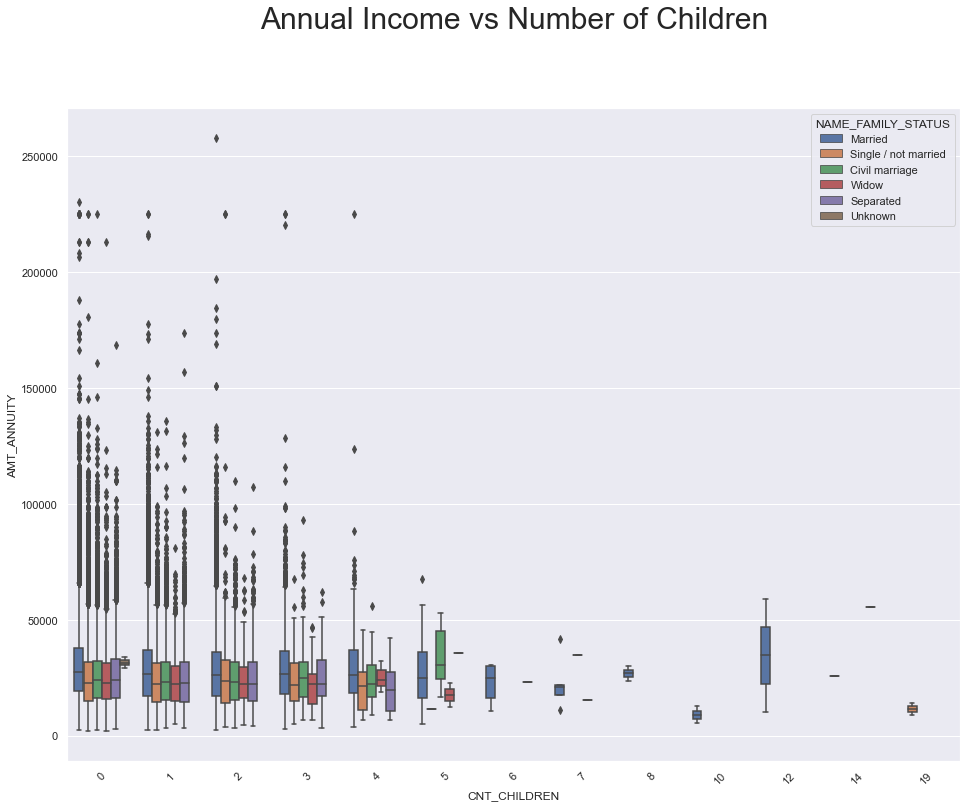

In [223]:
# CNT_CHILDREN vs AMT_ANNUITY vs NAME_FAMILY_STATUS over Target 0
plt.figure(figsize=(16,12))
plt.xticks(rotation=45)
sns.boxplot(data =appln_data_t0, x='CNT_CHILDREN',y='AMT_ANNUITY', hue ='NAME_FAMILY_STATUS',orient='v')
plt.title('Annual Income vs Number of Children')
plt.show()

- From the above graph, people who are married and having 12 children are likely to take the loan

#### Read the Previous_Application DataSet

In [224]:
pre_appln=pd.read_csv('previous_application.csv')
pre_appln

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


#### Check the shape of previous_application dataset

In [225]:
pre_appln.shape

(1670214, 37)

#### Check the missing percentage of values in previous_application dataset

In [226]:
pre_appln.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [227]:
round(100*pre_appln.isnull().sum()/len(pre_appln),2)

SK_ID_PREV                      0.00
SK_ID_CURR                      0.00
NAME_CONTRACT_TYPE              0.00
AMT_ANNUITY                    22.29
AMT_APPLICATION                 0.00
AMT_CREDIT                      0.00
AMT_DOWN_PAYMENT               53.64
AMT_GOODS_PRICE                23.08
WEEKDAY_APPR_PROCESS_START      0.00
HOUR_APPR_PROCESS_START         0.00
FLAG_LAST_APPL_PER_CONTRACT     0.00
NFLAG_LAST_APPL_IN_DAY          0.00
RATE_DOWN_PAYMENT              53.64
RATE_INTEREST_PRIMARY          99.64
RATE_INTEREST_PRIVILEGED       99.64
NAME_CASH_LOAN_PURPOSE          0.00
NAME_CONTRACT_STATUS            0.00
DAYS_DECISION                   0.00
NAME_PAYMENT_TYPE               0.00
CODE_REJECT_REASON              0.00
NAME_TYPE_SUITE                49.12
NAME_CLIENT_TYPE                0.00
NAME_GOODS_CATEGORY             0.00
NAME_PORTFOLIO                  0.00
NAME_PRODUCT_TYPE               0.00
CHANNEL_TYPE                    0.00
SELLERPLACE_AREA                0.00
N

#### Delete the columns which are having the missing percentage (>50%)

In [229]:
pre_appln= pre_appln.loc[:,100*((pre_appln.isnull().sum())/len(pre_appln))<50]
pre_appln.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [230]:
pre_appln.shape

(1670214, 33)

In [231]:
# Observed few values which are having negative values. Now we will convert them to positive values using abs
pre_appln['DAYS_DECISION']=abs(pre_appln['DAYS_DECISION'])
pre_appln['SELLERPLACE_AREA']=abs(pre_appln['SELLERPLACE_AREA'])
pre_appln['DAYS_FIRST_DUE']=abs(pre_appln['DAYS_FIRST_DUE'])
pre_appln['DAYS_LAST_DUE_1ST_VERSION']=abs(pre_appln['DAYS_LAST_DUE_1ST_VERSION'])
pre_appln['DAYS_LAST_DUE']=abs(pre_appln['DAYS_LAST_DUE'])
pre_appln['DAYS_TERMINATION']=abs(pre_appln['DAYS_TERMINATION'])
pre_appln['DAYS_FIRST_DRAWING']=abs(pre_appln['DAYS_FIRST_DRAWING'])

In [232]:
pre_appln.isnull().sum()

SK_ID_PREV                          0
SK_ID_CURR                          0
NAME_CONTRACT_TYPE                  0
AMT_ANNUITY                    372235
AMT_APPLICATION                     0
AMT_CREDIT                          1
AMT_GOODS_PRICE                385515
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
FLAG_LAST_APPL_PER_CONTRACT         0
NFLAG_LAST_APPL_IN_DAY              0
NAME_CASH_LOAN_PURPOSE              0
NAME_CONTRACT_STATUS                0
DAYS_DECISION                       0
NAME_PAYMENT_TYPE                   0
CODE_REJECT_REASON                  0
NAME_TYPE_SUITE                820405
NAME_CLIENT_TYPE                    0
NAME_GOODS_CATEGORY                 0
NAME_PORTFOLIO                      0
NAME_PRODUCT_TYPE                   0
CHANNEL_TYPE                        0
SELLERPLACE_AREA                    0
NAME_SELLER_INDUSTRY                0
CNT_PAYMENT                    372230
NAME_YIELD_GROUP                    0
PRODUCT_COMB

#### Now impute the missing values based on the type of the column (numerical/categorical)

count    1.297979e+06
mean     1.595512e+04
std      1.478214e+04
min      0.000000e+00
25%      6.321780e+03
50%      1.125000e+04
75%      2.065842e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64


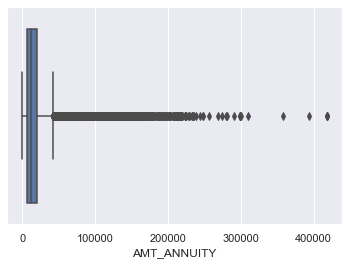

Mean of AMT_ANNUITY: 15955.120659450406
Median of AMT_ANNUITY: 11250.0
Missing values in AMT_ANNUITY: 0


In [234]:
# Imputing the missing values for AMT_ANNUITY
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.AMT_ANNUITY.describe())
#Plot the Boxplot for AMT_ANNUITY to check the outliers 
sns.boxplot(pre_appln.AMT_ANNUITY)
plt.show()
#Finding the mean, median of AMT_ANNUTY
AMT_ANNUITY_Mean=pre_appln.AMT_ANNUITY.mean()
print('Mean of AMT_ANNUITY:', AMT_ANNUITY_Mean)
AMT_ANNUITY_Median=pre_appln.AMT_ANNUITY.median()
print('Median of AMT_ANNUITY:', AMT_ANNUITY_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.AMT_ANNUITY.fillna(AMT_ANNUITY_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_ANNUITY in Application_Data DataSet
print('Missing values in AMT_ANNUITY:',pre_appln.AMT_ANNUITY.isnull().sum())

count    1.670213e+06
mean     1.961140e+05
std      3.185746e+05
min      0.000000e+00
25%      2.416050e+04
50%      8.054100e+04
75%      2.164185e+05
max      6.905160e+06
Name: AMT_CREDIT, dtype: float64


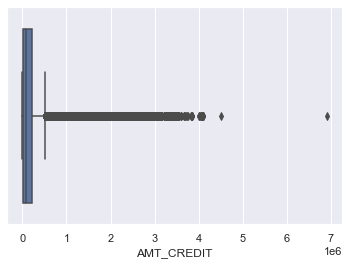

Mean of AMT_CREDIT: 196114.02121797804
Median of AMT_CREDIT: 80541.0
Missing values in AMT_CREDIT: 0


In [236]:
# Imputing the missing values for AMT_CREDIT
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.AMT_CREDIT.describe())
#Plot the Boxplot for AMT_CREDIT to check the outliers 
sns.boxplot(pre_appln.AMT_CREDIT)
plt.show()
#Finding the mean, median of AMT_CREDIT
AMT_CREDIT_Mean=pre_appln.AMT_CREDIT.mean()
print('Mean of AMT_CREDIT:', AMT_CREDIT_Mean)
AMT_CREDIT_Median=pre_appln.AMT_CREDIT.median()
print('Median of AMT_CREDIT:', AMT_CREDIT_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.AMT_CREDIT.fillna(AMT_CREDIT_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_CREDIT in Application_Data DataSet
print('Missing values in AMT_CREDIT:',pre_appln.AMT_CREDIT.isnull().sum())

count    1.284699e+06
mean     2.278473e+05
std      3.153966e+05
min      0.000000e+00
25%      5.084100e+04
50%      1.123200e+05
75%      2.340000e+05
max      6.905160e+06
Name: AMT_GOODS_PRICE, dtype: float64


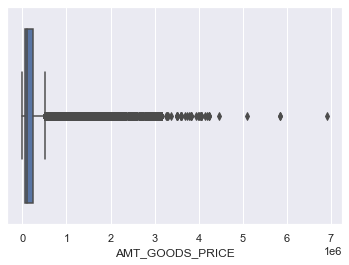

Mean of AMT_GOODS_PRICE: 227847.27928334344
Median of AMT_GOODS_PRICE: 112320.0
Missing values in AMT_GOODS_PRICE: 0


In [238]:
# Imputing the missing values for AMT_GOODS_PRICE
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.AMT_GOODS_PRICE.describe())
#Plot the Boxplot for AMT_GOODS_PRICE to check the outliers 
sns.boxplot(pre_appln.AMT_GOODS_PRICE)
plt.show()
#Finding the mean, median of AMT_GOODS_PRICE
AMT_GOODS_PRICE_Mean=pre_appln.AMT_GOODS_PRICE.mean()
print('Mean of AMT_GOODS_PRICE:', AMT_GOODS_PRICE_Mean)
AMT_GOODS_PRICE_Median=pre_appln.AMT_GOODS_PRICE.median()
print('Median of AMT_GOODS_PRICE:', AMT_GOODS_PRICE_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.AMT_GOODS_PRICE.fillna(AMT_GOODS_PRICE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of AMT_GOODS_PRICE in Application_Data DataSet
print('Missing values in AMT_GOODS_PRICE:',pre_appln.AMT_GOODS_PRICE.isnull().sum())

count            849809
unique                7
top       Unaccompanied
freq             508970
Name: NAME_TYPE_SUITE, dtype: object


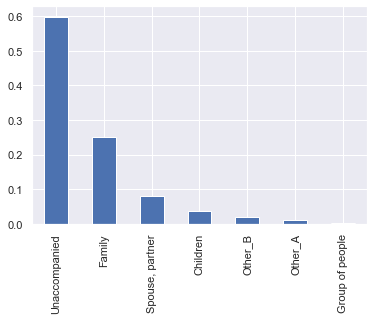

Mode of NAME_TYPE_SUITE: Unaccompanied
Missing values in NAME_TYPE_SUITE: 0


In [241]:
# Imputing the missing values for NAME_TYPE_SUITE
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.NAME_TYPE_SUITE.describe())
#Plot the Bar plot for NAME_TYPE_SUITE to check the outliers 
pre_appln.NAME_TYPE_SUITE.value_counts(normalize=True).plot.bar()
plt.show()
#Finding the Mode of NAME_TYPE_SUITE
NAME_TYPE_SUITE_Mode=pre_appln.NAME_TYPE_SUITE.mode()[0]
print('Mode of NAME_TYPE_SUITE:', NAME_TYPE_SUITE_Mode)
#Imputing the missing values with Mode as it is categorical column
pre_appln.NAME_TYPE_SUITE.fillna(NAME_TYPE_SUITE_Mode, inplace=True)
# After imputing the missing values with mode, check the missing values of NAME_TYPE_SUITE in Application_Data DataSet
print('Missing values in NAME_TYPE_SUITE:',pre_appln.NAME_TYPE_SUITE.isnull().sum())

count    1.297984e+06
mean     1.605408e+01
std      1.456729e+01
min      0.000000e+00
25%      6.000000e+00
50%      1.200000e+01
75%      2.400000e+01
max      8.400000e+01
Name: CNT_PAYMENT, dtype: float64


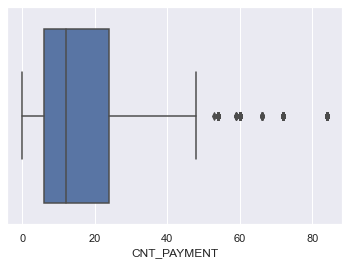

Mean of CNT_PAYMENT: 16.0540815603274
Median of CNT_PAYMENT: 12.0
Missing values in CNT_PAYMENT: 0


In [243]:
# Imputing the missing values for CNT_PAYMENT
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.CNT_PAYMENT.describe())
#Plot the Boxplot for CNT_PAYMENT to check the outliers 
sns.boxplot(pre_appln.CNT_PAYMENT)
plt.show()
#Finding the mean, median of CNT_PAYMENT
CNT_PAYMENT_Mean=pre_appln.CNT_PAYMENT.mean()
print('Mean of CNT_PAYMENT:', CNT_PAYMENT_Mean)
CNT_PAYMENT_Median=pre_appln.CNT_PAYMENT.median()
print('Median of CNT_PAYMENT:', CNT_PAYMENT_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.CNT_PAYMENT.fillna(CNT_PAYMENT_Median, inplace=True)
# After imputing the missing values with median, check the missing values of CNT_PAYMENT in Application_Data DataSet
print('Missing values in CNT_PAYMENT:',pre_appln.CNT_PAYMENT.isnull().sum())

count     1669868
unique         17
top          Cash
freq       285990
Name: PRODUCT_COMBINATION, dtype: object


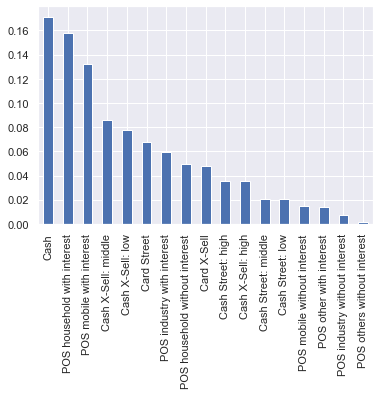

Mode of PRODUCT_COMBINATION: Cash
Missing values in PRODUCT_COMBINATION: 0


In [245]:
# Imputing the missing values for PRODUCT_COMBINATION
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.PRODUCT_COMBINATION.describe())
#Plot the Bar Graph for PRODUCT_COMBINATION 
pre_appln.PRODUCT_COMBINATION.value_counts(normalize=True).plot.bar()
plt.show()
#Finding the Mode of AMT_ANNUTY
PRODUCT_COMBINATION_Mode=pre_appln.PRODUCT_COMBINATION.mode()[0]
print('Mode of PRODUCT_COMBINATION:', PRODUCT_COMBINATION_Mode)
#Imputing the missing values with Mode as it is categorical column
pre_appln.PRODUCT_COMBINATION.fillna(PRODUCT_COMBINATION_Mode, inplace=True)
# After imputing the missing values with Mode, check the missing values of PRODUCT_COMBINATION in Application_Data DataSet
print('Missing values in PRODUCT_COMBINATION:',pre_appln.PRODUCT_COMBINATION.isnull().sum())

count    997149.000000
mean     342340.056543
std       88413.495220
min           2.000000
25%      365243.000000
50%      365243.000000
75%      365243.000000
max      365243.000000
Name: DAYS_FIRST_DRAWING, dtype: float64


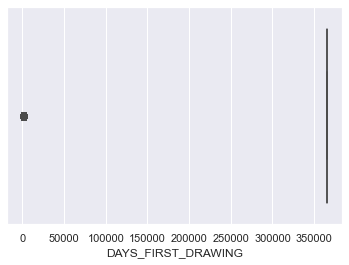

Mean of DAYS_FIRST_DRAWING: 342340.0565432047
Median of DAYS_FIRST_DRAWING: 365243.0
Missing values in DAYS_FIRST_DRAWING: 0


In [247]:
# Imputing the missing values for DAYS_FIRST_DRAWING
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.DAYS_FIRST_DRAWING.describe())
#Plot the Boxplot for DAYS_FIRST_DRAWING to check the outliers 
sns.boxplot(pre_appln.DAYS_FIRST_DRAWING)
plt.show()
#Finding the mean, median of DAYS_FIRST_DRAWING
DAYS_FIRST_DRAWING_Mean=pre_appln.DAYS_FIRST_DRAWING.mean()
print('Mean of DAYS_FIRST_DRAWING:', DAYS_FIRST_DRAWING_Mean)
DAYS_FIRST_DRAWING_Median=pre_appln.DAYS_FIRST_DRAWING.median()
print('Median of DAYS_FIRST_DRAWING:', DAYS_FIRST_DRAWING_Median)
#Imputing the missing values with Mean
pre_appln.DAYS_FIRST_DRAWING.fillna(DAYS_FIRST_DRAWING_Mean, inplace=True)
# After imputing the missing values with mean, check the missing values of CNT_PAYMENT in Application_Data DataSet
print('Missing values in DAYS_FIRST_DRAWING:',pre_appln.DAYS_FIRST_DRAWING.isnull().sum())


count    997149.000000
mean      15949.224065
std       72007.270877
min           2.000000
25%         475.000000
50%         921.000000
75%        1825.000000
max      365243.000000
Name: DAYS_FIRST_DUE, dtype: float64


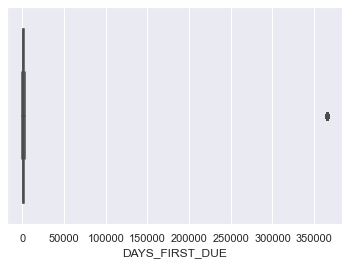

Mean of DAYS_FIRST_DUE: 15949.22406480877
Median of DAYS_FIRST_DUE: 921.0
Missing values in DAYS_FIRST_DUE: 0


In [249]:
# Imputing the missing values for DAYS_FIRST_DUE
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.DAYS_FIRST_DUE.describe())
#Plot the Boxplot for DAYS_FIRST_DUE to check the outliers 
sns.boxplot(pre_appln.DAYS_FIRST_DUE)
plt.show()
#Finding the mean, median of DAYS_FIRST_DUE
DAYS_FIRST_DUE_Mean=pre_appln.DAYS_FIRST_DUE.mean()
print('Mean of DAYS_FIRST_DUE:', DAYS_FIRST_DUE_Mean)
DAYS_FIRST_DUE_Median=pre_appln.DAYS_FIRST_DUE.median()
print('Median of DAYS_FIRST_DUE:', DAYS_FIRST_DUE_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.DAYS_FIRST_DUE.fillna(DAYS_FIRST_DUE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of DAYS_FIRST_DUE in Application_Data DataSet
print('Missing values in DAYS_FIRST_DUE:',pre_appln.DAYS_FIRST_DUE.isnull().sum())

count    997149.000000
mean      35163.363265
std      106405.950190
min           0.000000
25%         257.000000
50%         741.000000
75%        1735.000000
max      365243.000000
Name: DAYS_LAST_DUE_1ST_VERSION, dtype: float64


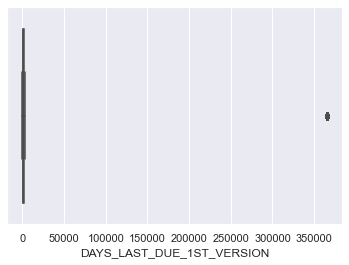

Mean of DAYS_LAST_DUE_1ST_VERSION: 35163.36326466757
Median of DAYS_LAST_DUE_1ST_VERSION: 741.0
Missing values in DAYS_LAST_DUE_1ST_VERSION: 0


In [251]:
# Imputing the missing values for DAYS_LAST_DUE_1ST_VERSION
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.DAYS_LAST_DUE_1ST_VERSION.describe())
#Plot the Boxplot for DAYS_LAST_DUE_1ST_VERSION to check the outliers 
sns.boxplot(pre_appln.DAYS_LAST_DUE_1ST_VERSION)
plt.show()
#Finding the mean, median of DAYS_LAST_DUE_1ST_VERSION
DAYS_LAST_DUE_1ST_VERSION_Mean=pre_appln.DAYS_LAST_DUE_1ST_VERSION.mean()
print('Mean of DAYS_LAST_DUE_1ST_VERSION:', DAYS_LAST_DUE_1ST_VERSION_Mean)
DAYS_LAST_DUE_1ST_VERSION_Median=pre_appln.DAYS_LAST_DUE_1ST_VERSION.median()
print('Median of DAYS_LAST_DUE_1ST_VERSION:', DAYS_LAST_DUE_1ST_VERSION_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.DAYS_LAST_DUE_1ST_VERSION.fillna(DAYS_LAST_DUE_1ST_VERSION_Median, inplace=True)
# After imputing the missing values with median, check the missing values of DAYS_LAST_DUE_1ST_VERSION in Application_Data DataSet
print('Missing values in DAYS_LAST_DUE_1ST_VERSION:',pre_appln.DAYS_LAST_DUE_1ST_VERSION.isnull().sum())

count    997149.000000
mean      78152.730207
std      148833.342466
min           2.000000
25%         455.000000
50%        1155.000000
75%        2418.000000
max      365243.000000
Name: DAYS_LAST_DUE, dtype: float64


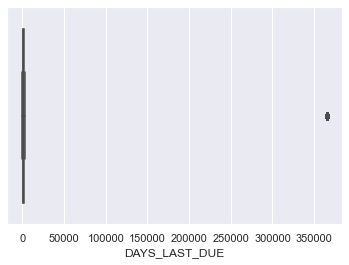

Mean of DAYS_LAST_DUE: 78152.73020681964
Median of DAYS_LAST_DUE: 1155.0
Missing values in DAYS_LAST_DUE: 0


In [253]:
# Imputing the missing values for DAYS_LAST_DUE
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.DAYS_LAST_DUE.describe())
#Plot the Boxplot for DAYS_LAST_DUE to check the outliers 
sns.boxplot(pre_appln.DAYS_LAST_DUE)
plt.show()
#Finding the mean, median of DAYS_LAST_DUE
DAYS_LAST_DUE_Mean=pre_appln.DAYS_LAST_DUE.mean()
print('Mean of DAYS_LAST_DUE:', DAYS_LAST_DUE_Mean)
DAYS_LAST_DUE_Median=pre_appln.DAYS_LAST_DUE.median()
print('Median of DAYS_LAST_DUE:', DAYS_LAST_DUE_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.DAYS_LAST_DUE.fillna(DAYS_LAST_DUE_Median, inplace=True)
# After imputing the missing values with median, check the missing values of DAYS_LAST_DUE in Application_Data DataSet
print('Missing values in DAYS_LAST_DUE:',pre_appln.DAYS_LAST_DUE.isnull().sum())

count    997149.000000
mean      83505.775017
std      152484.418802
min           2.000000
25%         447.000000
50%        1171.000000
75%        2501.000000
max      365243.000000
Name: DAYS_TERMINATION, dtype: float64


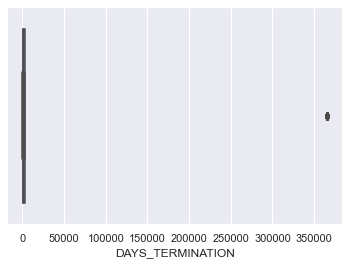

Mean of DAYS_TERMINATION: 83505.77501657225
Median of DAYS_TERMINATION: 1171.0
Missing values in DAYS_TERMINATION: 0


In [255]:
# Imputing the missing values for DAYS_TERMINATION
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.DAYS_TERMINATION.describe())
#Plot the Boxplot for DAYS_TERMINATION to check the outliers 
sns.boxplot(pre_appln.DAYS_TERMINATION)
plt.show()
#Finding the mean, median of DAYS_TERMINATION
DAYS_TERMINATION_Mean=pre_appln.DAYS_TERMINATION.mean()
print('Mean of DAYS_TERMINATION:', DAYS_TERMINATION_Mean)
DAYS_TERMINATION_Median=pre_appln.DAYS_TERMINATION.median()
print('Median of DAYS_TERMINATION:', DAYS_TERMINATION_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.DAYS_TERMINATION.fillna(DAYS_TERMINATION_Median, inplace=True)
# After imputing the missing values with median, check the missing values of DAYS_TERMINATION in Application_Data DataSet
print('Missing values in DAYS_TERMINATION:',pre_appln.DAYS_TERMINATION.isnull().sum())

count    997149.000000
mean          0.332570
std           0.471134
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: NFLAG_INSURED_ON_APPROVAL, dtype: float64


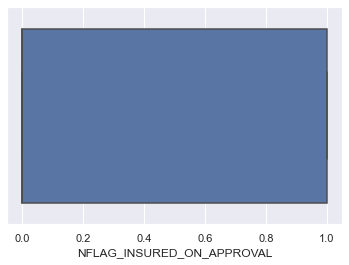

Mean of NFLAG_INSURED_ON_APPROVAL: 0.3325701575190869
Median of NFLAG_INSURED_ON_APPROVAL: 0.0
Missing values in NFLAG_INSURED_ON_APPROVAL: 0


In [257]:
# Imputing the missing values for NFLAG_INSURED_ON_APPROVAL
# Check the minimum, maixmum, 25%, 50%, 75%
print(pre_appln.NFLAG_INSURED_ON_APPROVAL.describe())
#Plot the Boxplot for NFLAG_INSURED_ON_APPROVAL to check the outliers 
sns.boxplot(pre_appln.NFLAG_INSURED_ON_APPROVAL)
plt.show()
#Finding the mean, median of NFLAG_INSURED_ON_APPROVAL
NFLAG_INSURED_ON_APPROVAL_Mean=pre_appln.NFLAG_INSURED_ON_APPROVAL.mean()
print('Mean of NFLAG_INSURED_ON_APPROVAL:', NFLAG_INSURED_ON_APPROVAL_Mean)
NFLAG_INSURED_ON_APPROVAL_Median=pre_appln.NFLAG_INSURED_ON_APPROVAL.median()
print('Median of NFLAG_INSURED_ON_APPROVAL:', NFLAG_INSURED_ON_APPROVAL_Median)
#Imputing the missing values with Median whereas Mean is affected by the outliers
pre_appln.NFLAG_INSURED_ON_APPROVAL.fillna(NFLAG_INSURED_ON_APPROVAL_Median, inplace=True)
# After imputing the missing values with median, check the missing values of NFLAG_INSURED_ON_APPROVAL in Application_Data DataSet
print('Missing values in NFLAG_INSURED_ON_APPROVAL:',pre_appln.NFLAG_INSURED_ON_APPROVAL.isnull().sum())

In [258]:
pre_appln.isnull().sum()

SK_ID_PREV                     0
SK_ID_CURR                     0
NAME_CONTRACT_TYPE             0
AMT_ANNUITY                    0
AMT_APPLICATION                0
AMT_CREDIT                     0
AMT_GOODS_PRICE                0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
FLAG_LAST_APPL_PER_CONTRACT    0
NFLAG_LAST_APPL_IN_DAY         0
NAME_CASH_LOAN_PURPOSE         0
NAME_CONTRACT_STATUS           0
DAYS_DECISION                  0
NAME_PAYMENT_TYPE              0
CODE_REJECT_REASON             0
NAME_TYPE_SUITE                0
NAME_CLIENT_TYPE               0
NAME_GOODS_CATEGORY            0
NAME_PORTFOLIO                 0
NAME_PRODUCT_TYPE              0
CHANNEL_TYPE                   0
SELLERPLACE_AREA               0
NAME_SELLER_INDUSTRY           0
CNT_PAYMENT                    0
NAME_YIELD_GROUP               0
PRODUCT_COMBINATION            0
DAYS_FIRST_DRAWING             0
DAYS_FIRST_DUE                 0
DAYS_LAST_DUE_1ST_VERSION      0
DAYS_LAST_

In [259]:
pre_appln.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 33 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1670214 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670214 non-null  float64
 6   AMT_GOODS_PRICE              1670214 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 8   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 9   FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 11  NAME_CASH_LOAN_PURPOSE       1670214 non-null  object 
 12  NAME_CONTRACT_STATUS         1670214 non-n

In [277]:
pre_appln=pre_appln.drop(pre_appln[pre_appln['NAME_CASH_LOAN_PURPOSE']=='XNA'].index)
pre_appln=pre_appln.drop(pre_appln[pre_appln['NAME_CASH_LOAN_PURPOSE']=='XAP'].index)
pre_appln.shape

(69635, 33)

#### Merge the Application_data and Previous_Application

In [278]:
merge_data=pd.merge(left=appln_data,right=pre_appln,how='inner',on='SK_ID_CURR',suffixes='_x')
merge_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_,AMT_ANNUITY_,AMT_GOODS_PRICE_,NAME_TYPE_SUITE_,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_,HOUR_APPR_PROCESS_START_,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_CREDIT_Binning,AMT_INCOME_TOTAL_Binning,SK_ID_PREV,NAME_CONTRACT_TYPEx,AMT_ANNUITYx,AMT_APPLICATION,AMT_CREDITx,AMT_GOODS_PRICEx,WEEKDAY_APPR_PROCESS_STARTx,HOUR_APPR_PROCESS_STARTx,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITEx,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100034,0,Revolving loans,M,N,Y,0,90000.0,180000.0,9000.0,180000.0,Unaccompanied,Working,Higher education,Single / not married,With parents,0.030755,10341,1010,4799.0,3015,1,1,0,1,0,0,Laborers,1.0,2,2,TUESDAY,16,0,0,0,0,0,0,Business Entity Type 3,0.502779,NaN,0.9831,0.3333,0.9831,0.3333,0.9831,0.3333,0.1227,No,0.0,0.0,0.0,0.0,599.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,Very Low,"75000,100000",1390369,Cash loans,22430.430,94500.0,109971.0,94500.0,FRIDAY,11,Y,1,Other,Approved,599,Cash through the bank,XAP,Unaccompanied,New,XNA,Cash,walk-in,Credit and cash offices,1,XNA,6.0,high,Cash Street: high,365243.000000,569.0,419.0,449.0,443.0,1.0
1,100035,0,Cash loans,F,N,Y,0,292500.0,665892.0,24592.5,477000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.025164,15280,2668,5266.0,3787,1,1,0,1,0,1,NaN,2.0,2,2,WEDNESDAY,13,0,0,0,0,0,0,Business Entity Type 3,0.479987,0.410103,0.9697,0.0417,0.9697,0.0417,0.9697,0.0417,0.0117,No,0.0,0.0,0.0,0.0,1634.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,5.0,Medium,275000-300000,1344613,Cash loans,33238.800,1260000.0,1260000.0,1260000.0,WEDNESDAY,14,Y,1,Payments on other loans,Refused,119,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,1,XNA,60.0,low_action,Cash Street: low,342340.056543,921.0,741.0,1155.0,1171.0,0.0
2,100039,0,Cash loans,M,Y,N,1,360000.0,733315.5,39069.0,679500.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.015221,11694,2060,3557.0,3557,1,1,0,1,0,0,Drivers,3.0,2,2,THURSDAY,10,0,0,0,1,1,0,Self-employed,0.321745,0.411849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,697.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0,Medium,350000-375000,1077565,Cash loans,52513.515,135000

#### Convert the Neative columns to  positive if the misssing values perentage is <50%

In [279]:
pre_appln['DAYS_DECISION']=abs(pre_appln['DAYS_DECISION'])
pre_appln['SELLERPLACE_AREA']=abs(pre_appln['SELLERPLACE_AREA'])
pre_appln['DAYS_FIRST_DUE']=abs(pre_appln['DAYS_FIRST_DUE'])
pre_appln['DAYS_LAST_DUE_1ST_VERSION']=abs(pre_appln['DAYS_LAST_DUE_1ST_VERSION'])
pre_appln['DAYS_LAST_DUE']=abs(pre_appln['DAYS_LAST_DUE'])
pre_appln['DAYS_TERMINATION']=abs(pre_appln['DAYS_TERMINATION'])
pre_appln['DAYS_FIRST_DRAWING']=abs(pre_appln['DAYS_FIRST_DRAWING'])

In [310]:
merge_data1 = merge_data.rename({'NAME_CONTRACT_TYPE_' : 'NAME_CONTRACT_TYPE','AMT_CREDIT_':'AMT_CREDIT','AMT_ANNUITY_':'AMT_ANNUITY',
                         'WEEKDAY_APPR_PROCESS_START_' : 'WEEKDAY_APPR_PROCESS_START',
                         'HOUR_APPR_PROCESS_START_':'HOUR_APPR_PROCESS_START','NAME_CONTRACT_TYPEx':'NAME_CONTRACT_TYPE_PREV',
                         'AMT_CREDITx':'AMT_CREDIT_PREV','AMT_ANNUITYx':'AMT_ANNUITY_PREV',
                         'WEEKDAY_APPR_PROCESS_STARTx':'WEEKDAY_APPR_PROCESS_START_PREV',
                         'HOUR_APPR_PROCESS_STARTx':'HOUR_APPR_PROCESS_START_PREV'}, axis=1)

#### Extract the numerical columns from the previous_application dataset

In [311]:
numerical_cols_pre = list(merge_data1.describe())
numerical_cols_pre

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE_',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'FLOORSMAX_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 '

In [312]:
categorical_cols_pre = list(set(merge_data1.columns)-set(merge_data1.describe()))
categorical_cols_pre

['NAME_TYPE_SUITEx',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_SELLER_INDUSTRY',
 'CODE_REJECT_REASON',
 'NAME_CLIENT_TYPE',
 'NAME_CONTRACT_TYPE',
 'NAME_YIELD_GROUP',
 'NAME_EDUCATION_TYPE',
 'NAME_HOUSING_TYPE',
 'PRODUCT_COMBINATION',
 'AMT_INCOME_TOTAL_Binning',
 'ORGANIZATION_TYPE',
 'AMT_CREDIT_Binning',
 'NAME_INCOME_TYPE',
 'FLAG_OWN_CAR',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_PORTFOLIO',
 'NAME_GOODS_CATEGORY',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE_',
 'NAME_CONTRACT_TYPE_PREV',
 'CODE_GENDER',
 'NAME_CONTRACT_STATUS',
 'CHANNEL_TYPE',
 'NAME_FAMILY_STATUS',
 'EMERGENCYSTATE_MODE',
 'NAME_PAYMENT_TYPE',
 'NAME_PRODUCT_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START_PREV',
 'WEEKDAY_APPR_PROCESS_START']

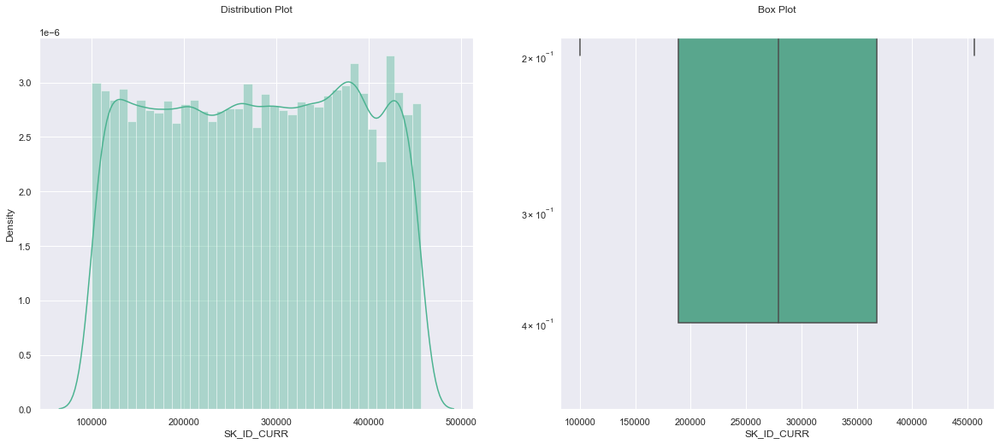

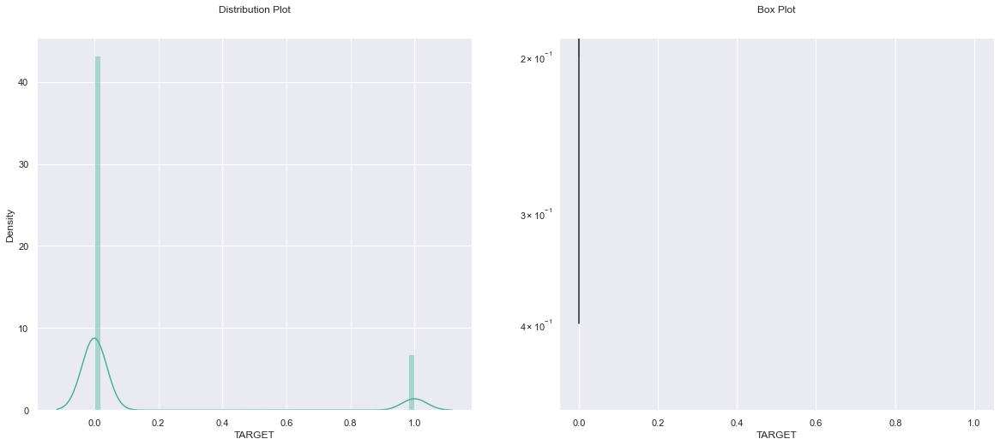

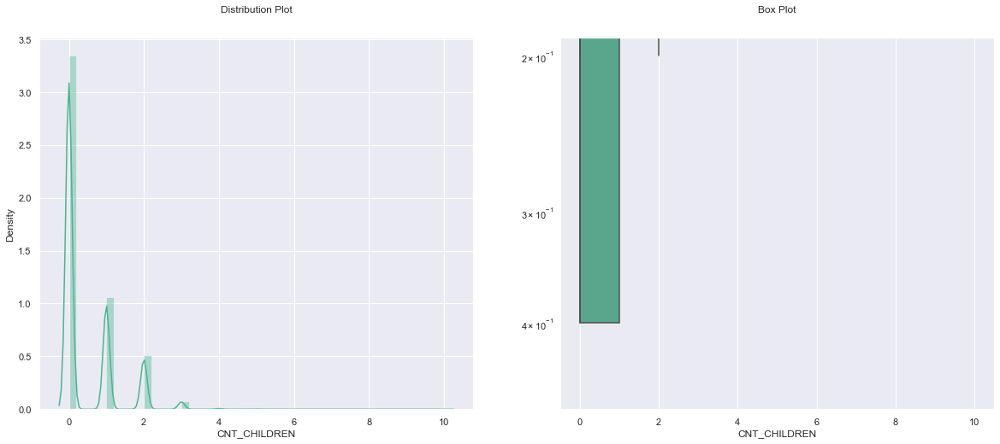

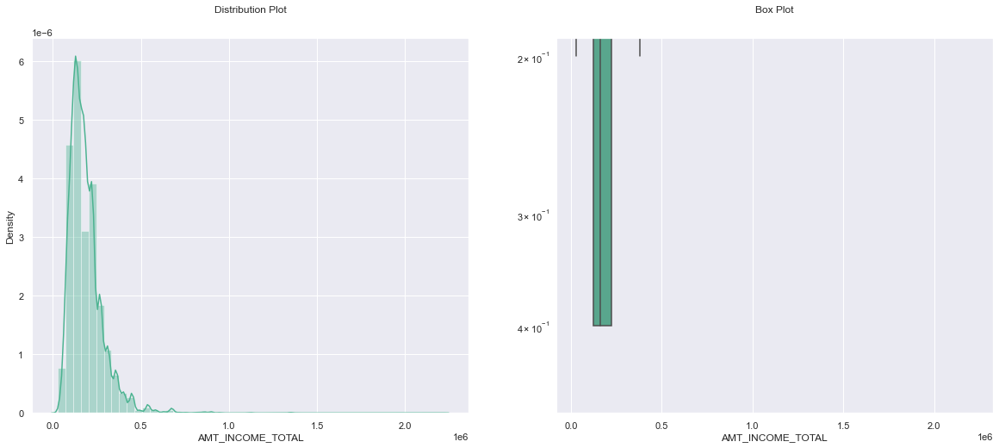

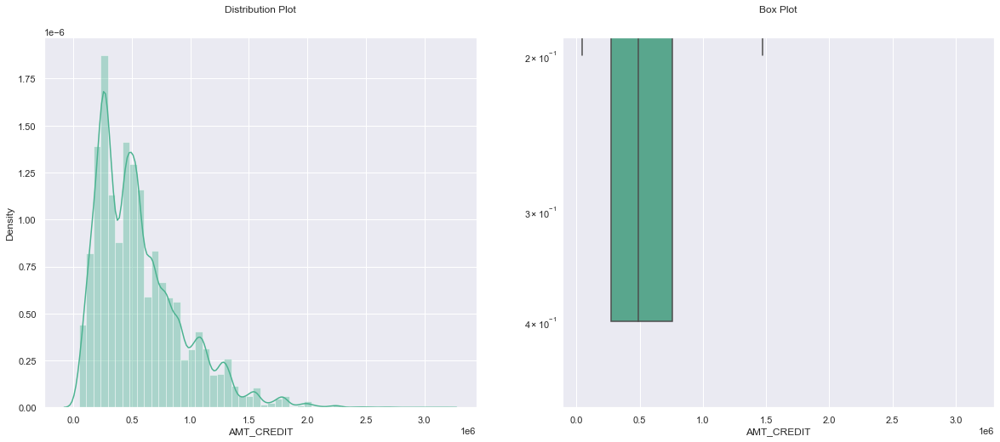

...

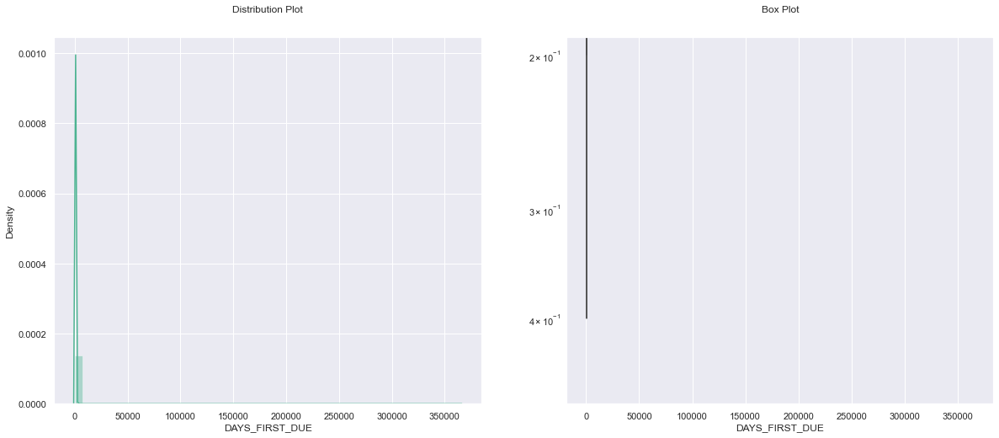

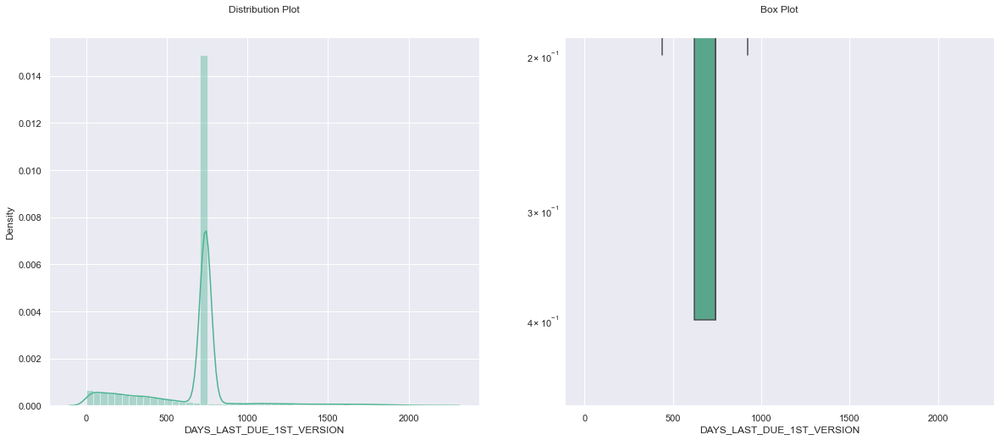

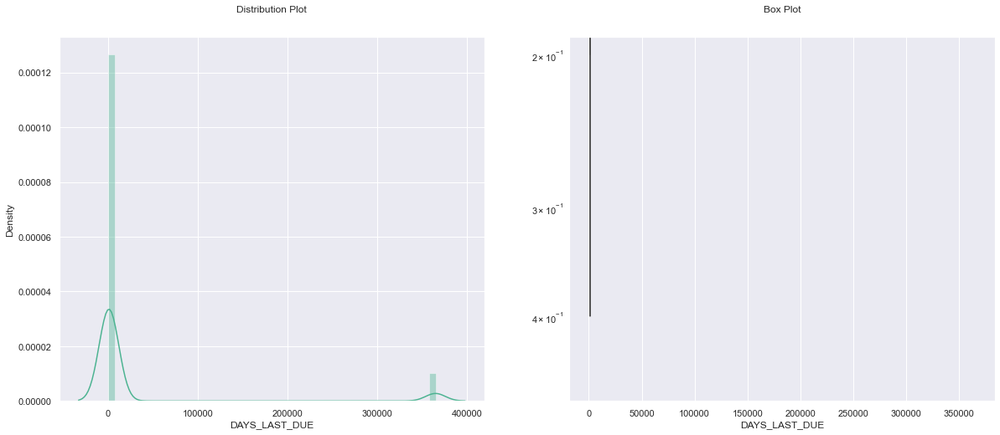

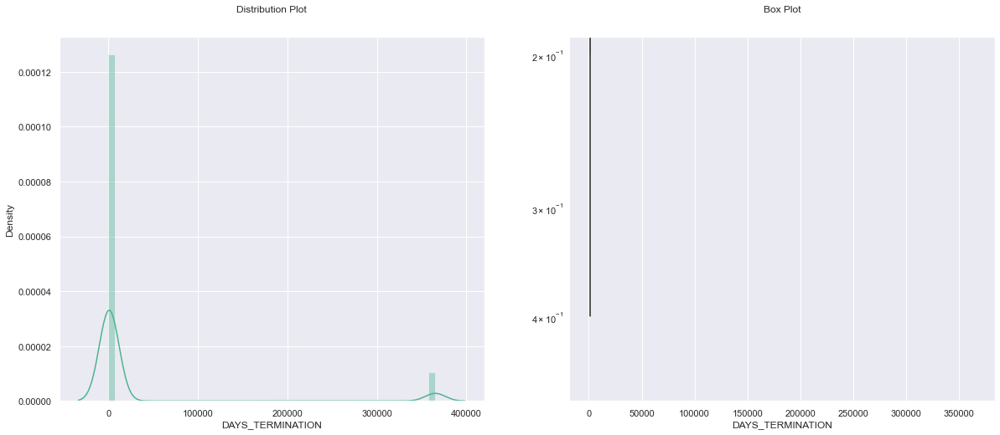

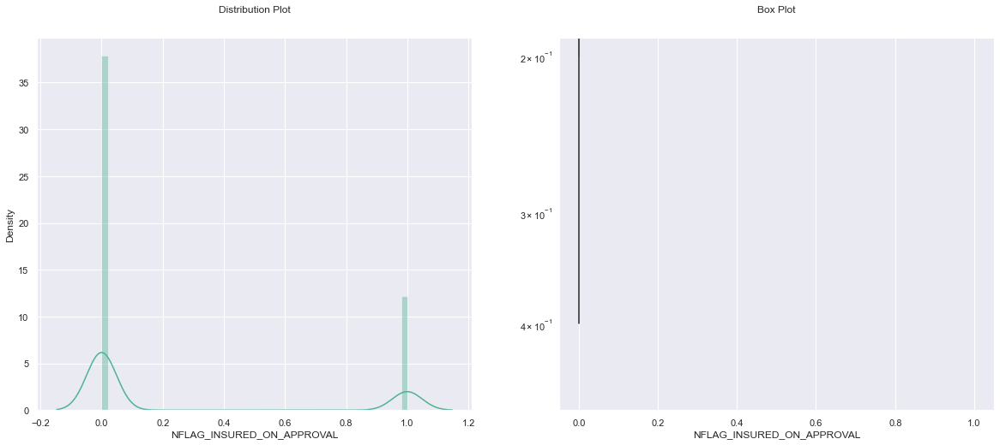

In [315]:
# plot the distplot and perform the univariate analysis on numerical columns
for i in numerical_cols_pre:
    uni_num(data1=merge_data1,col=i)

#### Insights from the Univarite Analysis of Numerical columns
- High number of applications are filed in 9 AM to 2 PM for both Current and Previous data.
- So busiest hours for bank are form 9 AM to 2 PM.
- Nuclear family tends to take more loans.
- Previously bank had high unused offers but currently refused is high incase of AMT_GOODS_PRICE.
- Previously bank had high unused offers and currently cancelled/refused offers are similar for AMT_ANNUITY.
- Previously bank had high unused offers and currently high number of refused offers for AMT_CREDIT.

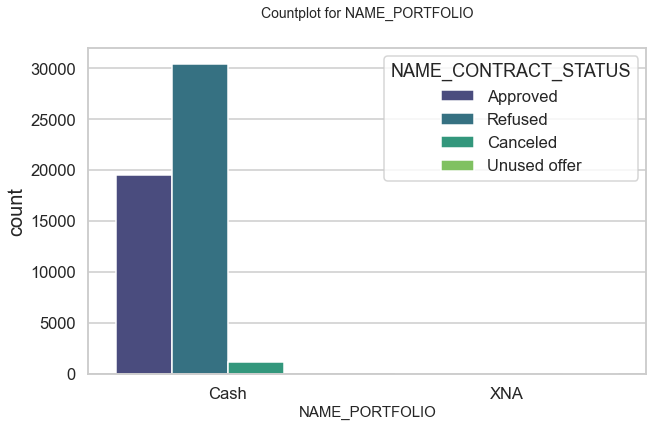

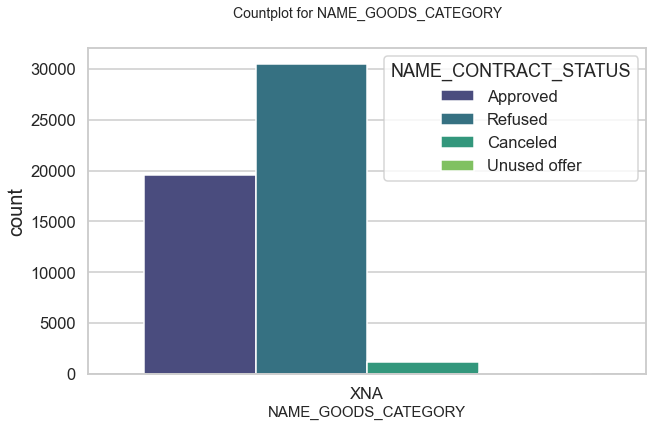

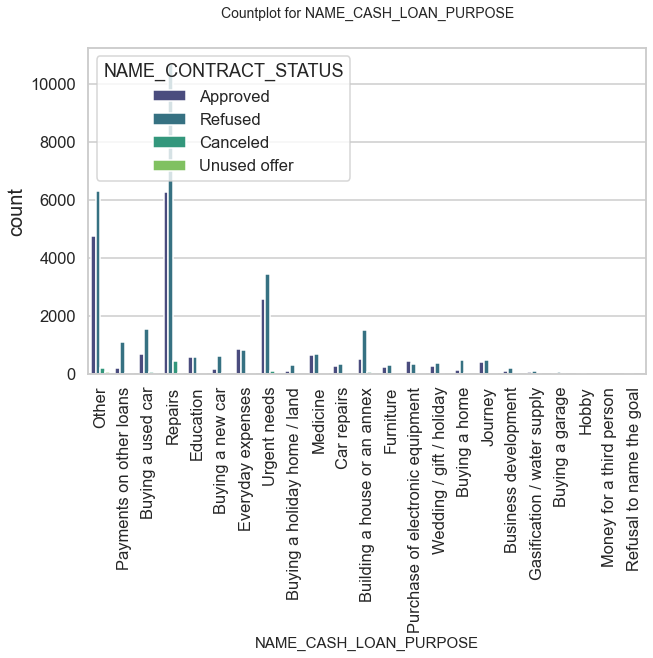

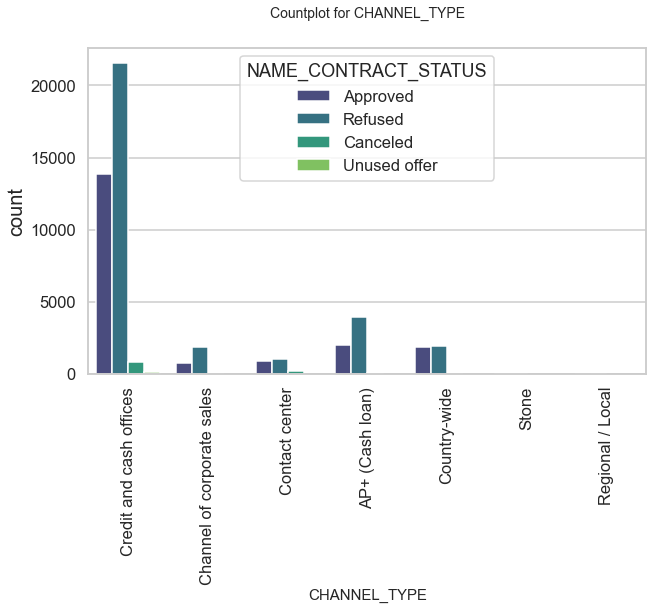

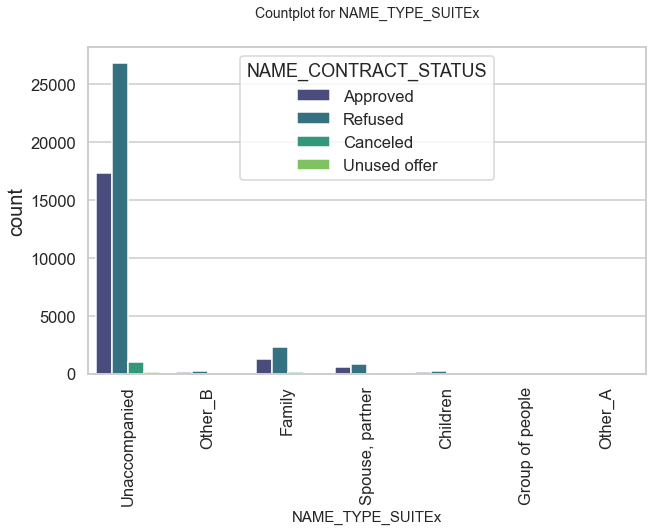

...

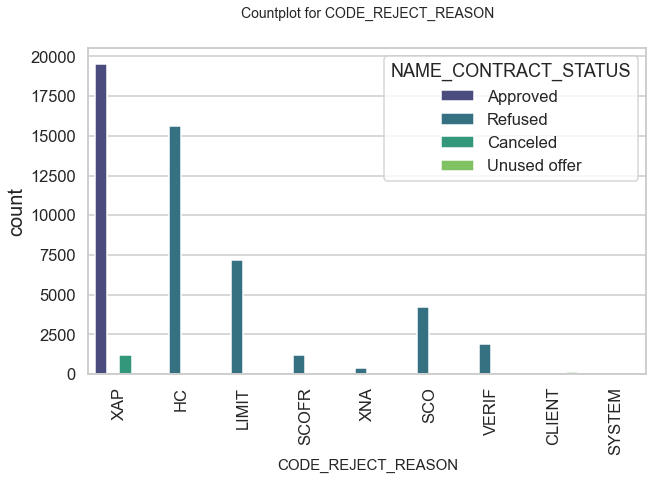

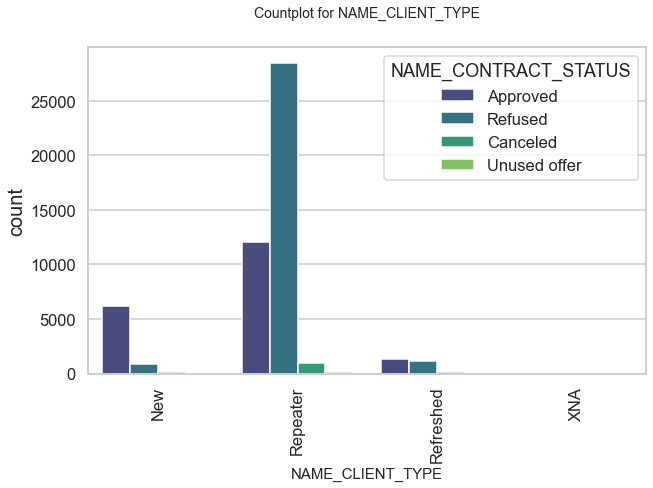

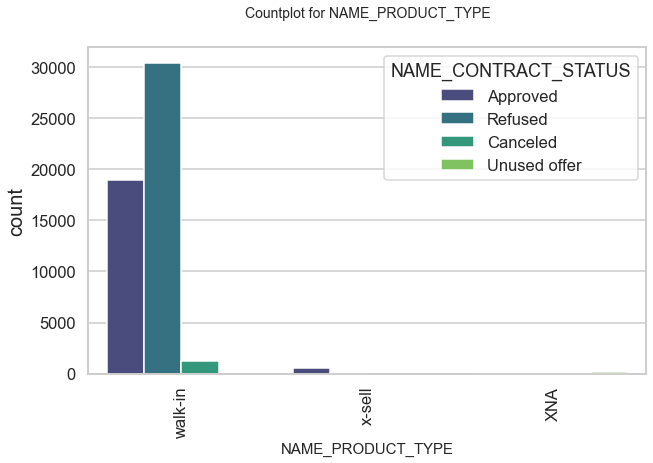

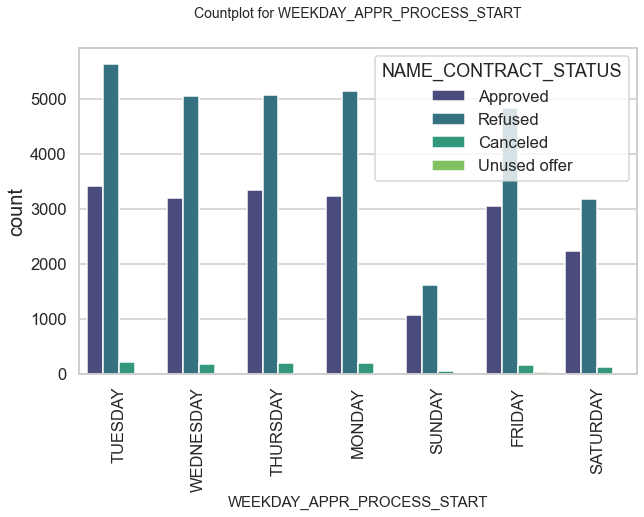

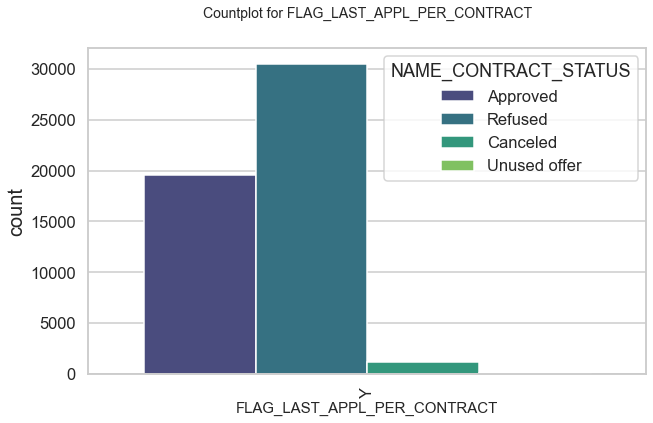

In [314]:
# plot the countplot and perform the univariate analysis on categoricl columns
plt.figure(figsize=(10,6))
plt.xlabel('NAME_PORTFOLIO',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=merge_data1, x= 'NAME_PORTFOLIO', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_PORTFOLIO', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('NAME_GOODS_CATEGORY',fontsize=15)
plt.ylabel('count',fontsize=20)
sns.countplot(data=merge_data1, x= 'NAME_GOODS_CATEGORY', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_GOODS_CATEGORY', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('NAME_CASH_LOAN_PURPOSE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'NAME_CASH_LOAN_PURPOSE', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_CASH_LOAN_PURPOSE', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('CHANNEL_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'CHANNEL_TYPE', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for CHANNEL_TYPE', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('NAME_TYPE_SUITEx',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'NAME_TYPE_SUITEx', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_TYPE_SUITEx', fontsize=14)
plt.show()


plt.figure(figsize=(10,6))
plt.xlabel('NAME_YIELD_GROUP',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'NAME_YIELD_GROUP', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_YIELD_GROUP', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('PRODUCT_COMBINATION',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'PRODUCT_COMBINATION', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for PRODUCT_COMBINATION', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('NAME_PAYMENT_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'NAME_PAYMENT_TYPE', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_PAYMENT_TYPE', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('NAME_SELLER_INDUSTRY',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'NAME_SELLER_INDUSTRY', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_SELLER_INDUSTRY', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('CODE_REJECT_REASON',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'CODE_REJECT_REASON', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for CODE_REJECT_REASON', fontsize=14)
plt.show()



plt.figure(figsize=(10,6))
plt.xlabel('NAME_CLIENT_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'NAME_CLIENT_TYPE', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_CLIENT_TYPE', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('NAME_PRODUCT_TYPE',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'NAME_PRODUCT_TYPE', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for NAME_PRODUCT_TYPE', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('WEEKDAY_APPR_PROCESS_START',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data1, x= 'WEEKDAY_APPR_PROCESS_START', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for WEEKDAY_APPR_PROCESS_START', fontsize=14)
plt.show()

plt.figure(figsize=(10,6))
plt.xlabel('FLAG_LAST_APPL_PER_CONTRACT',fontsize=15)
plt.ylabel('count',fontsize=20)
plt.xticks(rotation=90)
sns.countplot(data=merge_data, x= 'FLAG_LAST_APPL_PER_CONTRACT', hue='NAME_CONTRACT_STATUS', palette='viridis')
plt.title('Countplot for FLAG_LAST_APPL_PER_CONTRACT', fontsize=14)
plt.show()


#### Insights from Univariate Analysis of categorical columns

- Repeater has highest number of approved loans.
- Middle NAME_YIELD_GROUP has highest approval.
- Value of AMT_CREDIT_Binning does not affect loan approvals.
- Medium AMT_INCOME_TOTAL_Binning the approval is highest .
- In previous application saturday has the highest approval rate but in current application it is tuesday.
- Both in NAME_CONTRACT_TYPEx and NAME_CONTRACT_TYPE unaccompanied has the highest number.
- Currently bank is only giving two types of loans -Cash and Revolving Loans.
- Previously bank was providing Cash, Revolving and Consumer loans.
- Number of consumer loans were highest previously and now highest number is Cash loans

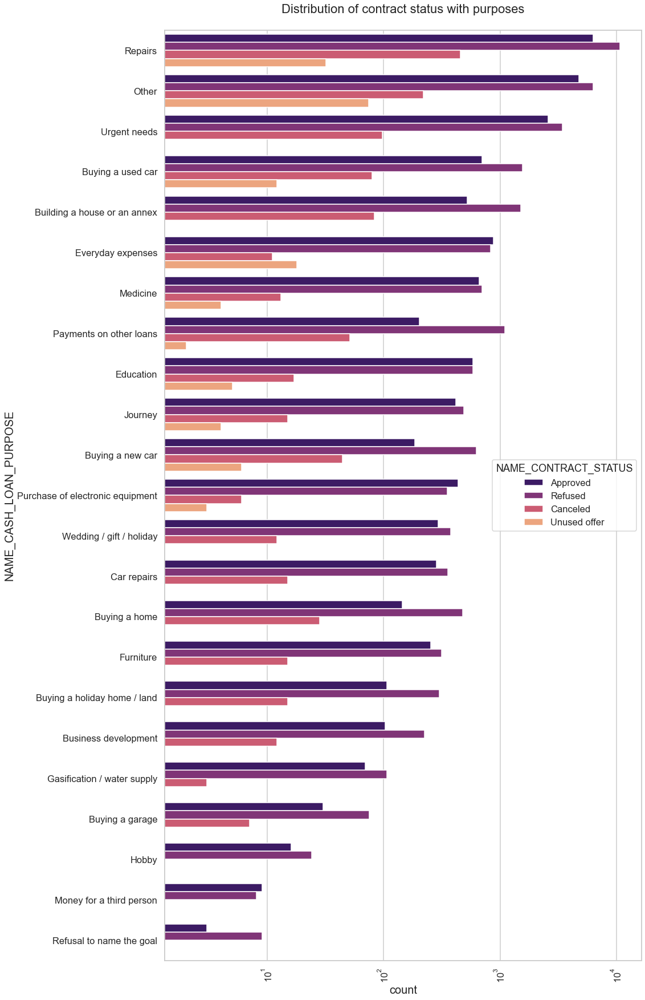

In [328]:
# plot the countplot and perform the bivariate analysis on categorical columns
sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(15,30))
plt.rcParams["axes.labelsize"] = 20
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.titlepad'] = 30
plt.xticks(rotation=90)
plt.xscale('log')
plt.title('Distribution of contract status with purposes')
ax = sns.countplot(data = merge_data, y= 'NAME_CASH_LOAN_PURPOSE', order=merge_data1['NAME_CASH_LOAN_PURPOSE'].value_counts().index,hue = 'NAME_CONTRACT_STATUS',palette='magma',orient='v') 


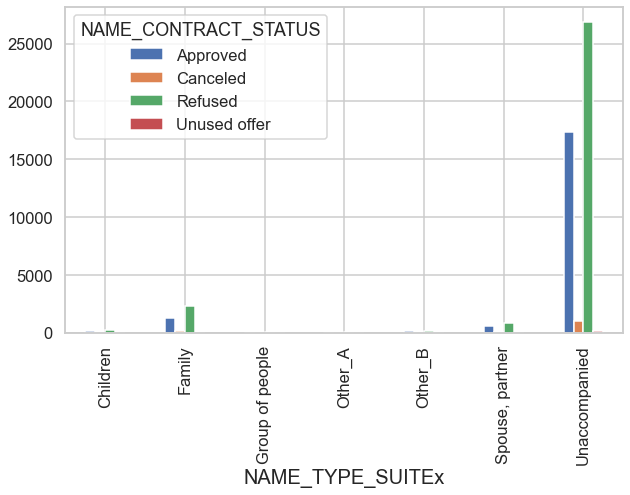

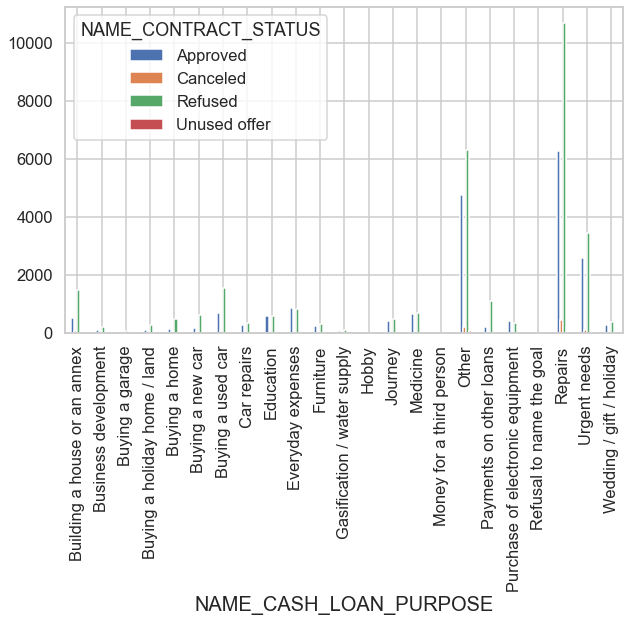

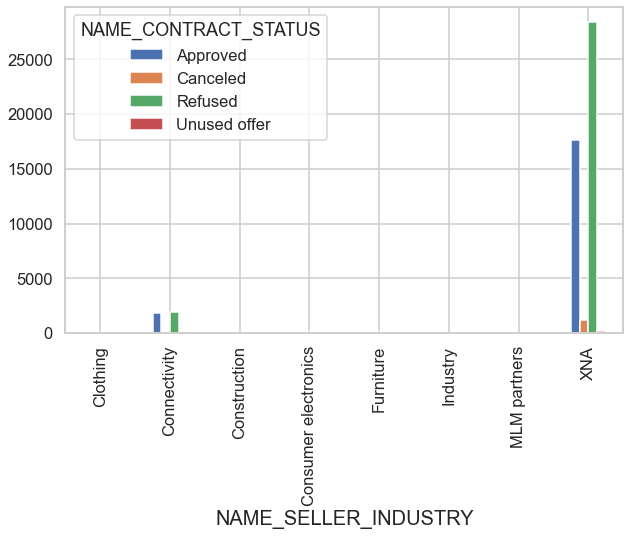

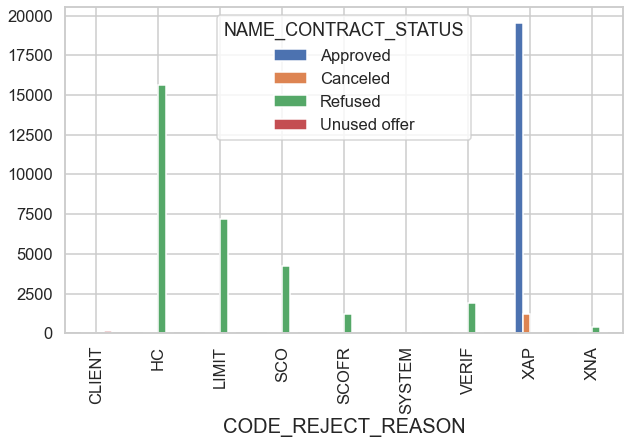

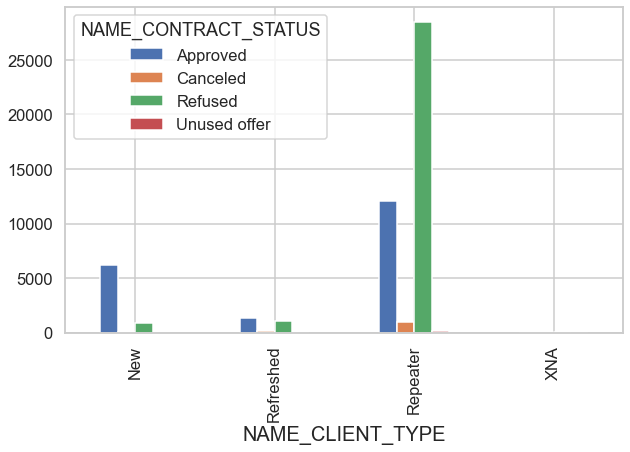

...

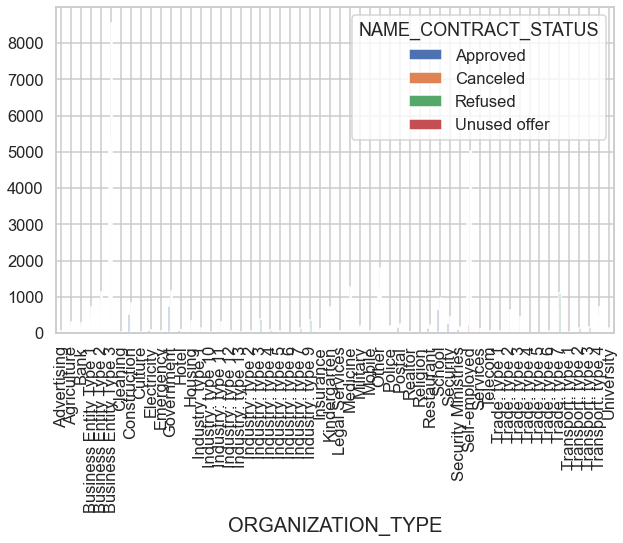

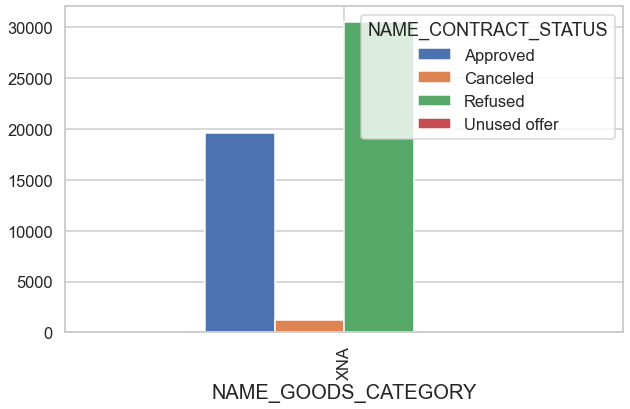

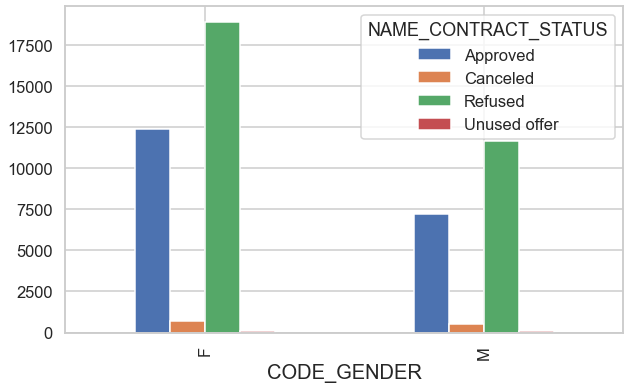

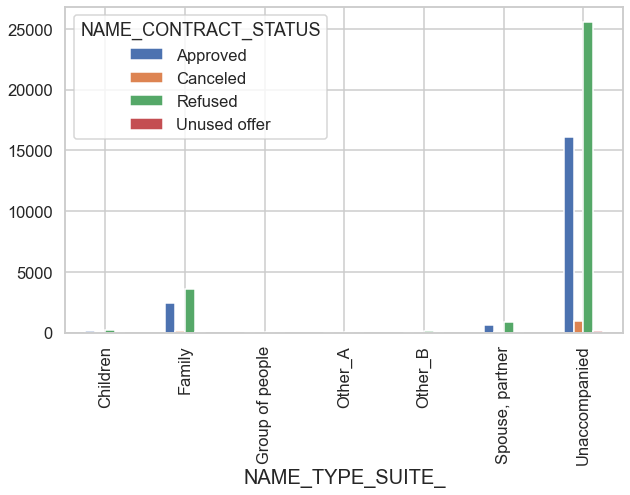

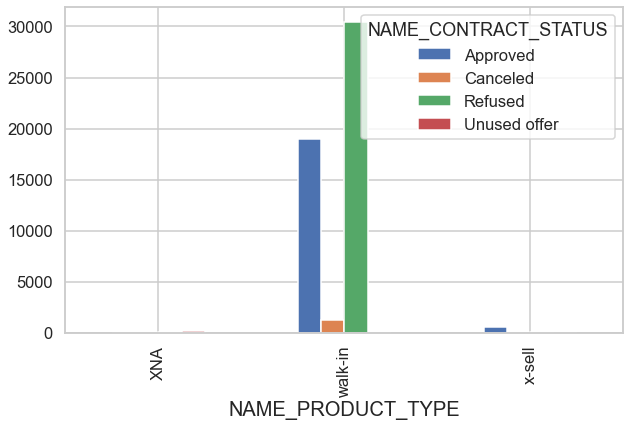

In [327]:
NAME_TYPE_SUITEx=pd.crosstab(index=merge_data1['NAME_TYPE_SUITEx'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_TYPE_SUITEx.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_CASH_LOAN_PURPOSE=pd.crosstab(index=merge_data1['NAME_CASH_LOAN_PURPOSE'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_CASH_LOAN_PURPOSE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_SELLER_INDUSTRY=pd.crosstab(index=merge_data1['NAME_SELLER_INDUSTRY'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_SELLER_INDUSTRY.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

CODE_REJECT_REASON=pd.crosstab(index=merge_data1['CODE_REJECT_REASON'],columns=merge_data1['NAME_CONTRACT_STATUS'])
CODE_REJECT_REASON.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_CLIENT_TYPE=pd.crosstab(index=merge_data1['NAME_CLIENT_TYPE'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_CLIENT_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_CONTRACT_TYPE=pd.crosstab(index=merge_data1['NAME_CONTRACT_TYPE'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_CONTRACT_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_YIELD_GROUP=pd.crosstab(index=merge_data1['NAME_YIELD_GROUP'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_YIELD_GROUP.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_EDUCATION_TYPE=pd.crosstab(index=merge_data1['NAME_EDUCATION_TYPE'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_EDUCATION_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_HOUSING_TYPE=pd.crosstab(index=merge_data1['NAME_HOUSING_TYPE'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_HOUSING_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

PRODUCT_COMBINATION=pd.crosstab(index=merge_data1['PRODUCT_COMBINATION'],columns=merge_data1['NAME_CONTRACT_STATUS'])
PRODUCT_COMBINATION.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

ORGANIZATION_TYPE=pd.crosstab(index=merge_data1['ORGANIZATION_TYPE'],columns=merge_data1['NAME_CONTRACT_STATUS'])
ORGANIZATION_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_GOODS_CATEGORY=pd.crosstab(index=merge_data1['NAME_GOODS_CATEGORY'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_GOODS_CATEGORY.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

CODE_GENDER=pd.crosstab(index=merge_data1['CODE_GENDER'],columns=merge_data1['NAME_CONTRACT_STATUS'])
CODE_GENDER.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_TYPE_SUITE_=pd.crosstab(index=merge_data1['NAME_TYPE_SUITE_'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_TYPE_SUITE_.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()

NAME_PRODUCT_TYPE=pd.crosstab(index=merge_data1['NAME_PRODUCT_TYPE'],columns=merge_data1['NAME_CONTRACT_STATUS'])
NAME_PRODUCT_TYPE.plot(kind="bar", figsize=(10,6),stacked=False)
plt.xticks(rotation=90)
plt.show()


#### Insights from Bivariate Analysis of Categorical Columns after the merging the dataset
- people who are unaccompanied while applying for loan are having high chances of refuse
- HC has the high chances of refusing the loan
- Repeater Client has high chanes of approving as well as refusing compared to other categories
- Cash Loans are having high chances of approving the loans
- High Yield group has the maximum chances of approval
- Secondary/secondary special has high chances of taking the loan
- People who are having house/apartment tends to take loans
- Cash Street: high product has higher chances of loan approval
- Female tends to take more loans
- Walk in product has high chances of taking the loans

#### plot the boxplot and perform the bivariate analysis on categorical columns

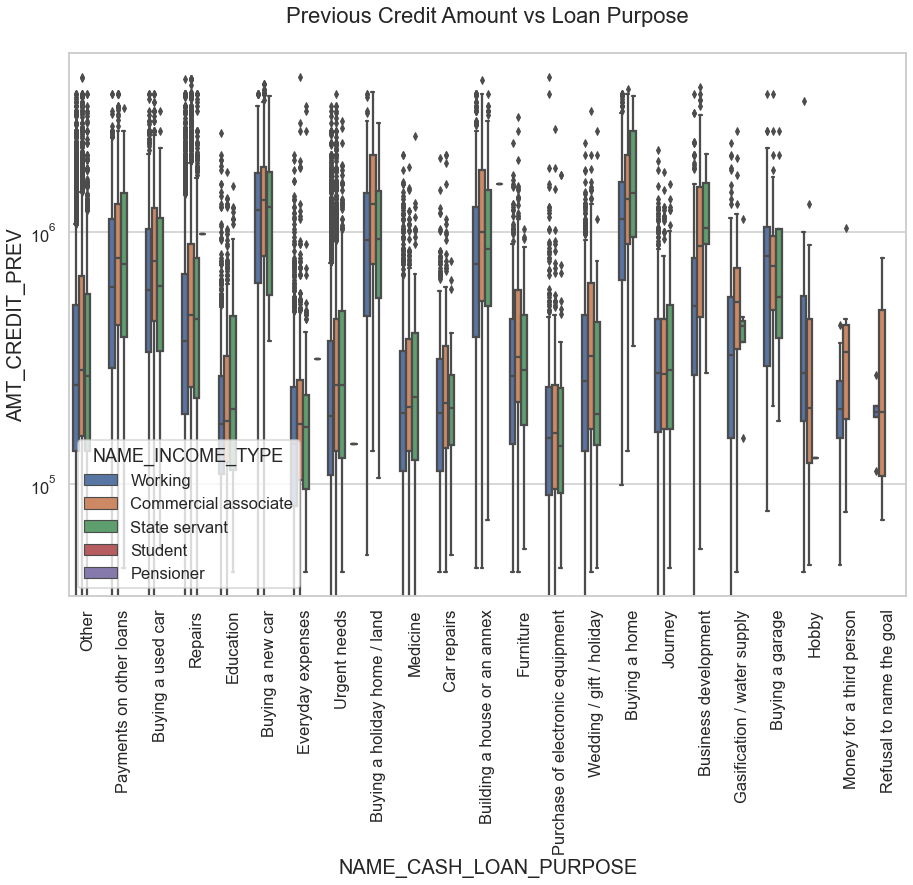

In [330]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=90)
plt.yscale('log')
sns.boxplot(data =merge_data1, x='NAME_CASH_LOAN_PURPOSE',hue='NAME_INCOME_TYPE',y='AMT_CREDIT_PREV',orient='v')
plt.title('Previous Credit Amount vs Loan Purpose')
plt.show()

- From the above we can conclude some points-

The credit amount of Loan purposes like 'Buying a home','Buying a land','Buying a new car' and'Building a house' is higher.
Income type of state servants have a significant amount of credit applied
Money for third person or a Hobby is having less credits applied for.

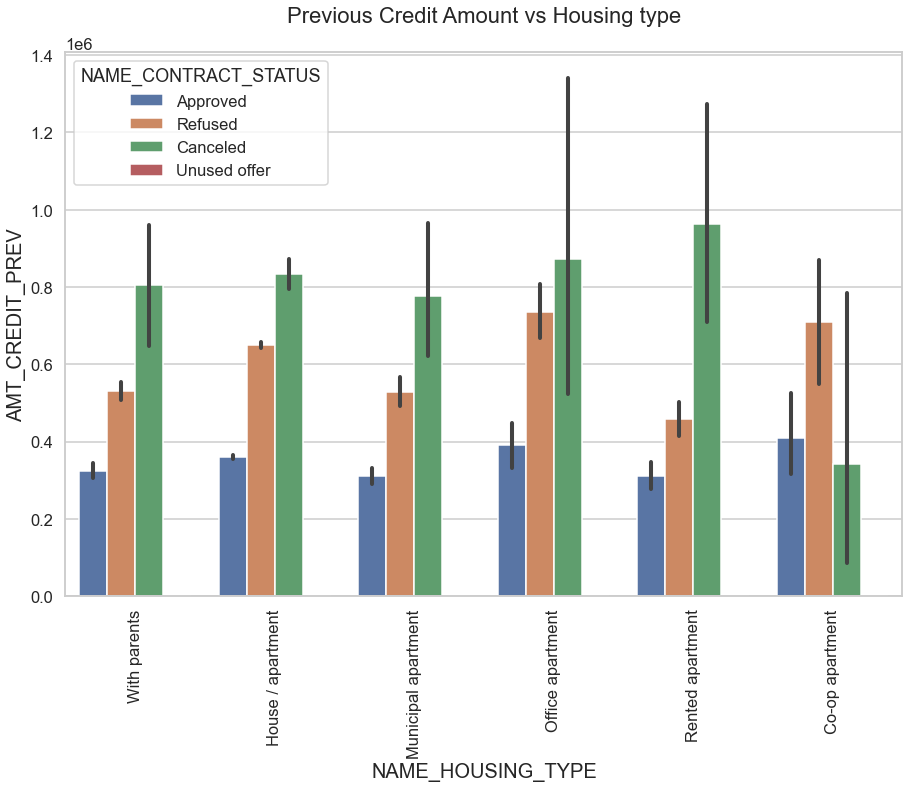

In [334]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=90)
sns.barplot(data =merge_data1, y='AMT_CREDIT_PREV',hue='NAME_CONTRACT_STATUS',x='NAME_HOUSING_TYPE')
plt.title('Previous Credit Amount vs Housing type')
plt.show()

- From the above graph, we can conclude that Rented apartment has higher chances of cancellation of loan

#### CONCLUSION

1. Banks should focus more on contract type ‘Student’ ,’pensioner’ and ‘Businessman’ with housing ‘type other than ‘Co-op apartment’ for successful payments.
2. Banks should focus less on income type ‘Working’ as they are having most number of unsuccessful payments.
3. Also with loan purpose ‘Repair’ is having higher number of unsuccessful payments on time.
4. Get as much as clients from housing type ‘With parents’ as they are having least number of unsuccessful payments.
